We can see that the distribution is almost uniform for all the short description categories except for a few

# Capstone Project: Group 2 NLP-1

# DOMAIN: Automated Ticketing System

### Participants: 
- Pranav Kumar Singh
- Bhawna Jha
- Janki Pandya
- Ramakrishna Pothula
- Sumit

### Introduction

#### The AS-IS State

Currently,
- Around ~54% of the incidents are resolved by L1 / L2 teams. 
- Incase L1 / L2 is unable to resolve, they will then escalate / assign the tickets to Functional teams from Applications and Infrastructure (L3 teams). 
- Some portions of incidents are directly assigned to L3 teams by either Monitoring tools or Callers / Requestors. L3 teams will carry out detailed diagnosis and resolve the incidents. 
- Around ~56% of incidents are resolved by Functional / L3 teams. Incase if vendor support is needed, they will reach out for their support towards incident closure. 

#### Pain points

- L1 / L2 needs to spend time reviewing Standard Operating Procedures (SOPs) before assigning to Functional teams (Minimum ~25-30% of incidents needs to be reviewed for SOPs before ticket assignment). 
- 15 min is being spent for SOP review for each incident. 
- Minimum of ~1 FTE effort needed only for incident assignment to L3 teams.
- During the process of incident assignments by L1 / L2 teams to functional groups, there were multiple instances of incidents getting assigned to wrong functional groups. 
- Around ~25% of Incidents are wrongly assigned to functional teams. 
- Additional effort needed for Functional teams to re-assign to right functional groups. 
- During this process, some of the incidents are in queue and not addressed timely resulting in poor customer service. 

#### Opportunity

Guided by powerful AI techniques that can classify incidents to right functional groups can help organizations to reduce the resolving time of the issue and can focus on more productive tasks.

## PROJECT OBJECTIVE: Build a classifier that can classify the tickets by analyzing text.

### 1. Importing necessary libraries

In [1]:
import nltk # Import NLTK
from nltk.corpus import reuters # Import the Reuters corpus

In [2]:
import pandas as pd
import numpy as np # linear algebra
import seaborn as sns
import matplotlib.pyplot as plt  # seaborn is based on matplotlib
sns.set(color_codes=True) # adds a nice background to the graphs
%matplotlib inline 
# tells python to actually display the graphs
import scipy.stats as stats
import seaborn as sns
from statsmodels.stats.weightstats import ztest
from sklearn.model_selection import train_test_split

In [3]:
import tensorflow as tf
# Importing necessary libraries

import seaborn as sns
import tensorflow
import random
import pandas as pd
import os
import cv2

import seaborn as sns
import matplotlib.pyplot as plt  # seaborn is based on matplotlib
sns.set(color_codes=True) # adds a nice background to the graphs
%matplotlib inline 
# tells python to actually display the graphs
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers, optimizers
from tensorflow.keras.preprocessing import image
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

In [4]:
# Initialize the random number generator
import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
#import numpy
from keras.datasets import imdb
from matplotlib import pyplot

### 2. EDA and Data Visualization 

#### Fetching the given file 

In [7]:
Data = pd.read_excel("IT-Ticket-Classification.xlsx") # reading the csv file from local machine

In [8]:
# from google.colab import drive
# drive.mount("/content/gdrive")

In [9]:
# Data = pd.read_excel("/content/gdrive/MyDrive/input_data.xlsx")

#### 2.1 Exploring the given Data files

In [10]:
Data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


Data has four columns:
- **Short description**: Specifying the nature of issue
- **Description**: The actual issue
- **Caller**: UserID of the caller of the issue
- **Assignment group**: Group to which the issue was assigned

#### 2.2. Understanding the structure of data

In [11]:
Data.shape

(8500, 4)

There are 8500 rows in the dataset

In [12]:
##### Ask Dipanshu how can we do the upsampling - Bhawna to check

#### 2.3 Finding missing points in data

In [13]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


- 8 rows in the Short Description column are blank
- 1 row in the Description columns is blank

We need to either remove or feed such entries before processing the data

In [14]:
#Data.describe(include='all')

- There are 74 unique assignment groups to which the issues are being assigned
- password reset issue seems the most common which has occured 38 times

We will analyze the data further and derive more insights later

In [15]:
Data.drop(['Caller'], axis = 1) # Dropping the caller column as it wouldn't be needed for the classification task 

,Short description,Description,Assignment group
0,login issue,-verified user details.(employee# & manager na...,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0
4,skype error,skype error,GRP_0
...,...,...,...
8495,emails not coming in from zz mail,_x000D_\n_x000D_\nreceived from: avglmrts.vhqm...,GRP_29
8496,telephony_software issue,telephony_software issue,GRP_0
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,GRP_0
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,GRP_62


#### 2.4 Finding inconsistencies in the data

In [16]:
Data["Assignment group"].value_counts() 

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_64       1
GRP_67       1
GRP_35       1
GRP_70       1
GRP_73       1
Name: Assignment group, Length: 74, dtype: int64

- There are few assignment groups which gets good number of tickets (GRP_8, 24, 12 and 9) and there are few which hardly receive any ticket (GRP_70, 67, 35, 73 and 64)
- GRP_0 is an outlier with 3976 tckets about of 8500 i.e. ~50% of the issues


#### 2.5 Visualizing different patterns

#### Plotting the pie chart showing percentage distribution of tickets against different functional groups 

In [17]:
import plotly
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
cf.go_offline()
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', Data['Assignment group'].nunique())

# Pie chart
assgn_grp = pd.DataFrame(Data.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='Assignment Group Distribution- Pie Chart (Fig-2)', 
    hoverinfo="label+percent+name", hole=0.25)

Total assignment groups: 74


#### Observation:
- As analyzed above, we see that GRP_0 has the highest number (46.8%) of the assigned tickets, followed by GRP_8.
- Other groups which receive good number of tickets are: GRP_24 (3.4%), GRP_12 (3.02%), GRP_9 (2.96%)

Plotting Frequency distribution in **descending order**, across various groups which were assigned the tickets

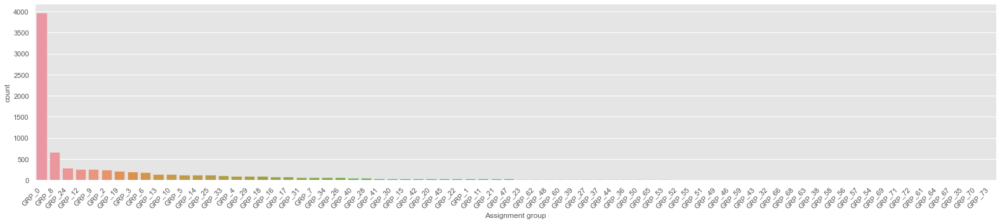

In [18]:
plt.style.use('ggplot') # Using gg plot for plotting based on decending order
%matplotlib inline

descending_order = Data['Assignment group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#added code for x label rotate 
ax=sns.countplot(x='Assignment group', data=Data,order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

**Observation**: 
- GRP_0 as observed above is an outlier.
- There are around 50% of the groups which receive considerable number of tickets, as obeserved from the graph

#### Plotting the frequency distribution once more without the outlier GRP_0

In [19]:
Data['Assignment group'][Data['Assignment group'] != "GRP_0"]

6        GRP_1
17       GRP_3
32       GRP_4
43       GRP_5
47       GRP_6
         ...  
8493    GRP_10
8494     GRP_3
8495    GRP_29
8498    GRP_62
8499    GRP_49
Name: Assignment group, Length: 4524, dtype: object

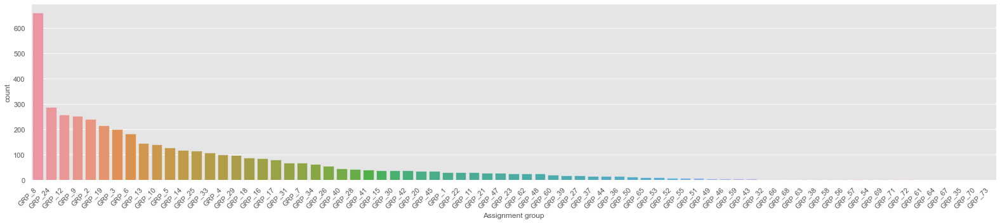

In [20]:
plt.style.use('ggplot') # Using gg plot for plotting based on descending order
%matplotlib inline

descending_order = Data['Assignment group'][Data['Assignment group'] != "GRP_0"].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#added code for x label rotate 
ay=sns.countplot(x='Assignment group', data=Data,order=descending_order)
ay.set_xticklabels(ay.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

#### Finding groups which hardly recieve tickets

**Observation**: 
- GRP_8 has more than 600 tickets followed by 5 groups with count of tickets between 200 - 300 range 
- There are 7 groups with count of tickets between 100 - 200 range
- There are around 18 groups with very minimal count of tickets

In [21]:
# Find out the Assignment Groups with less than equal to 30 tickets assigned
rare_ticket = Data.groupby(['Assignment group']).filter(lambda x: len(x) <= 5)
print('\033[1m#Groups with less than equal to 5 tickets assigned:\033[0m', rare_ticket['Assignment group'].nunique())

rare_ticket['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    colorscale='-orrd',
    title='#Records by rare Assignment Groups- Histogram (Fig-4)')

#Groups with less than equal to 5 tickets assigned: 19


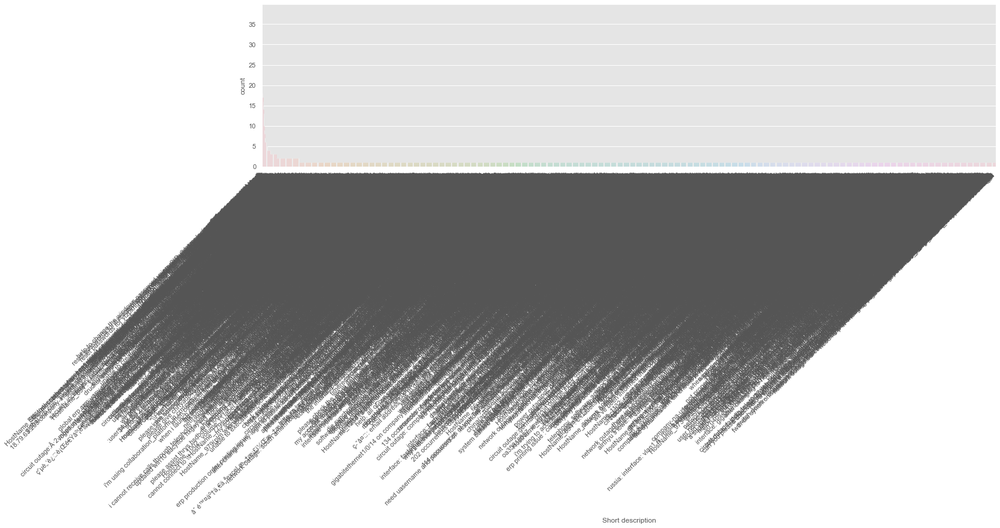

In [ ]:
plt.style.use('ggplot') # Using gg plot for plotting based on descending order
%matplotlib inline

descending_order = Data['Short description'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#added code for x label rotate 
az=sns.countplot(x='Short description', data=Data,order=descending_order)
az.set_xticklabels(az.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

#### Observation:
- There are 19 groups which receive less than 5 tickets.
- These groups are: GRP_35, 38, 43, 54,56, 57, 58, 61, 32, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73

In [22]:
# Distribution of Assignment groups excluding GRP_0 & rare groups (groups with less than equal 30 tickets assigned)
excluded_grp = ['GRP_0']
excluded_grp.extend(rare_ticket['Assignment group'].unique())
filtered_tkt = Data[~Data['Assignment group'].isin(excluded_grp)]

# Pie chart
filtered_assgn_grp = pd.DataFrame(filtered_tkt.groupby('Assignment group').size(),columns = ['Count']).reset_index()
filtered_assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='#Records by Assignment groups(excluding GRP_0 and rare groups)- Pie Chart (Fig-5)',
    pull=np.linspace(0,0.3,filtered_assgn_grp['Assignment group'].nunique()))

# Histogram
filtered_tkt['Assignment group'].iplot(
    kind='histogram',
    xTitle='Assignment Group',
    yTitle='count',
    colorscale='-gnbu',
    title='#Records by Assignment groups(excluding GRP_0 and rare groups)- Histogram (Fig-6)')

Observations from the histogram are confimred with the pie-chart which is showing percentage distributions of tickets assigned

### 3. Pre-processing of data

#### 3.1. Dealing with missing values

In [23]:
# Datafinal = Data.dropna() # Dropping the 20 null "LoanOnCard" value carrying rows 
Datafinal= Data # Taking backup

In [24]:
Data.head

<bound method NDFrame.head of                                       Short description  \
0                                           login issue   
1                                               outlook   
2                                    cant log in to vpn   
3                         unable to access hr_tool page   
4                                          skype error    
...                                                 ...   
8495                  emails not coming in from zz mail   
8496                           telephony_software issue   
8497  vip2: windows password reset for tifpdchb pedx...   
8498                     machine nÃ£o estÃ¡ funcionando   
8499  an mehreren pc`s lassen sich verschiedene prgr...   

                                            Description             Caller  \
0     -verified user details.(employee# & manager na...  spxjnwir pjlcoqds   
1     _x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...  hmjdrvpb komuaywn   
2     _x000D_\n_x000D_\nrec

In [25]:
Datafinal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


#### 3.2 Data Cleansing

We need to create a custom function for data cleansing as the standard nltk stpwords would not work for:
- Removing the chracters related to email IDs
- special characters for new line for e.g. \n \r
- Email format headers like: "received from:", "from:" etc.

In [26]:
import re
from dateutil import parser
def is_valid_date(date_str):
    try:
        parser.parse(date_str)
        return True
    except:
        return False

def clean_data(text):
    text=text.lower()
    text = ' '.join([w for w in text.split() if not is_valid_date(w)])
    text = re.sub(r"received from:",' ',text)
    text = re.sub(r"from:",' ',text)
    text = re.sub(r"to:",' ',text)
    text = re.sub(r"subject:",' ',text)
    text = re.sub(r"sent:",' ',text)
    text = re.sub(r"ic:",' ',text)
    text = re.sub(r"cc:",' ',text)
    text = re.sub(r"bcc:",' ',text)
    #Remove email 
    text = re.sub(r'\S*@\S*\s?', '', text)
    # Remove numbers 
    text = re.sub(r'\d+','' ,text)

    # Remove new line characters 
    text = re.sub(r'\n',' ',text)
    text = re.sub(r'\r',' ',text)
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    #& 
    text = re.sub(r'&;?', 'and',text)
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    # Remove characters beyond Readable formart by Unicode:
    text= ''.join(c for c in text if c <= '\uFFFF') 
    text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
#     for name in callers:
#       namelist = [part for part in name.split()]
#       for namepart in namelist: 
#           text = text.replace(namepart,'')
          
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub(' +', ' ', text)
    text = text.strip()
    return text

In [27]:
for i in range(len(Datafinal['Short description'])):
    Datafinal['Short description'][i] =clean_data(str(Datafinal['Short description'][i]))
    Datafinal['Description'][i] =clean_data(str(Datafinal['Description'][i]))

In [28]:
Datafinal.head(10)

,Short description,Description,Caller,Assignment group
0,login issue,verified user details employee and manager nam...,spxjnwir pjlcoqds,GRP_0
1,outlook,xd xd xd hello team xd xd my meetings skype me...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,xd xd xd hi xd xd cannot log on to vpn xd xd best,eylqgodm ybqkwiam,GRP_0
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event critical hostname company com the value ...,event critical hostname company com the value ...,jyoqwxhz clhxsoqy,GRP_1
7,ticket no employment status new non employee e...,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0


In [29]:
Datafinal['Short description'].replace('', np.nan, inplace=True) # To be execcuted after clean_data function 
Datafinal['Description'].replace('', np.nan, inplace=True) # To be execcuted after clean_data function

In [30]:
Data.dropna(subset=['Short description'],inplace=True)
Data.dropna(subset=['Description'],inplace=True)

In [31]:
Datafinal.head

<bound method NDFrame.head of                                       Short description  \
0                                           login issue   
1                                               outlook   
2                                    cant log in to vpn   
3                         unable to access hr tool page   
4                                           skype error   
...                                                 ...   
8495                  emails not coming in from zz mail   
8496                           telephony software issue   
8497   vip windows password reset for tifpdchb pedxruyf   
8498                          machine o est funcionando   
8499  an mehreren pc lassen sich verschiedene prgram...   

                                            Description             Caller  \
0     verified user details employee and manager nam...  spxjnwir pjlcoqds   
1     xd xd xd hello team xd xd my meetings skype me...  hmjdrvpb komuaywn   
2     xd xd xd hi xd xd can

**Observation**: Some of the sentences sound German in nature which needs to be transalted back to English. We need to first identify all such sentenes

#### 3.3 Language Detection & Translation

In [32]:
pip install deep-translator

Note: you may need to restart the kernel to use updated packages.


In [33]:
pip install google_trans_new

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [34]:
pip install langdetect

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


#### 3.4 Translating both "Short Description" and "Description" columns using google translator if language is not English

In [35]:
from google_trans_new import google_translator 
from deep_translator import GoogleTranslator
from langdetect import detect
detected_lang = []
for i in range(0,len(Datafinal)):
    print("i:",i," ",Datafinal.iloc[i]['Description'])
    result_lang = detect(Datafinal.iloc[i]['Description'])
 # print(result_lang) 
    if result_lang == 'en':
        continue
    else:
        translator = google_translator()
        detected_lang.append(result_lang)
        Datafinal.iloc[i]['Short description']=GoogleTranslator(source=result_lang, target='en').translate(Datafinal.iloc[i]['Short description'])
        Datafinal.iloc[i]['Description']=GoogleTranslator(source=result_lang, target='en').translate(Datafinal.iloc[i]['Description'])
        print("Translated ",i,": ",Datafinal.iloc[i]['Description'])

i: 0   verified user details employee and manager name xd checked the user name in ad and reset the password xd advised the user to login and check xd caller confirmed that he was able to login xd issue resolved
i: 1   xd xd xd hello team xd xd my meetings skype meetings etc are not appearing in my outlook calendar can somebody please advise how to correct this xd xd kind
i: 2   xd xd xd hi xd xd cannot log on to vpn xd xd best
Translated  2 :  xd xd xd xd xd hi ne can log on to a VPN xd xd Best
i: 3   unable to access hr tool page
i: 4   skype error
Translated  4 :  skype error
i: 5   unable to log in to engineering tool and skype
i: 6   event critical hostname company com the value of mountpoint threshold for oracle sid erpdata srpsad srpsad data perpsrpsad is
i: 7   ticket no employment status new non employee enter user name
i: 8   unable to disable add ins on outlook
i: 9   ticket update on inplant
i: 10   engineering tool says not connected and unable to submit reports
i: 11   hr

i: 81   erp sid account locked
i: 82   user yhmwxsqj ugnthxky having issues logging to outlook rgtry will be available tomorrow around am he works out of company campus request you to reach out to him and fix the issue
i: 83   xd job bwhrattr failed in job scheduler at
i: 84   hello it service xd need to monitor the manufacturing drawings to approve manufacturing xd the engineering tool stopped showing pdf originals xd xd process xd xd xd erp production order interface vendor bas cr rfc destination production order interface vendor views not accessible file cannot be stamped now xd xd bapireturnederrorexception xd stack trace xd cadagent erp conn jco tm jcoerpmanager handlereturnstructureorreturntableline jcoerpmanager java id jcoerpmanager java wt xd cadagent erp conn jco tm jcoerpmanager handlereturnstructure jcoerpmanager java id jcoerpmanager java wt xd cadagent erp conn jco tm jcoerpmanager generirtcfunction jcoerpmanager java id jcoerpmanager java wt xd cadagent objmod plmfile ch

Translated  146 :  erp print tool install
i: 147   name wvngzrca sfmrzdth language browser microsoft internet explorer customer number summary good morning am having trouble getting into my vpn can you assist
i: 148   install acrobat standard
Translated  148 :  install standard acrobat
i: 149   password reset from ad
i: 150   please reset my password to sid it blocked login jdhdw
i: 151   bwfhtumx japznrvb regional controller
Translated  151 :  bwfhtumx japznrvb regional controller
i: 152   crm add in is getting disabled from outlook
i: 153   outlook hangs
Translated  153 :  outlook hangs
i: 154   vpn not working
Translated  154 :  vpn not working
i: 155   employee is getting an error user authentication failed when trying to log into the ess portal she is able to access erp and is able to access the hub tried to reset and change her password through password management tool password manager but got an error cannot find account woodscf on target active directory her user id is hdjdkt
i

Translated  219 :  contact phone
i: 220   adding members to dl
Translated  220 :  adding members to dl
i: 221   java issue on uacyltoe hxgaycze laptop
Translated  221 :  java issue on uacyltoe hxgaycze laptop
i: 222   support r fa konnica arexjftu ohxdwngl
i: 223   hallo es ist erneut passiert der pc hat sich zum wiederholten male aufgeh ngt und mir lediglich einen blauen bildschirm mit weisser schrift pr sentiert was nnen wir da machen
Translated  223 :  hello it happened again the pc hung itself up again and again and just presented me with a blue screen with white writing what we can do there
i: 224   xd job pp eu tool netch ap failed in job scheduler at
i: 225   eu tool crashes when confirmations are deleted not able to remove scrap confirmations that have been rectified in erp
i: 226   enable bgdxitwu dhcopwxa active directory account name fdgrty summary need bgdxitwu dhcopwxa active directory account enabled
i: 227   sync emails issue
Translated  227 :  sync emails issue
i: 228  

Translated  265 :  xd xd xd hello xd xd netweaver no longer works or I can no longer open it xd xd xd xd xd xd xd xd xd xd xd best regards
i: 266   a ndigung for fgxprnub hlanwgqj effective has been approved
i: 267   xd job job failed in job scheduler at
Translated  267 :  xd job job failed in job scheduler at
i: 268   outlook setting is changed
i: 269   xd job job failed in job scheduler at
i: 270   neues passwort r accountname tgryhu hgygrtui passwort r diesen account funktioniert nicht mehr mitarbeiter ist in kw und auf fr hschicht anwesend
Translated  270 :  new password r account name tgryhu hgygrtui password r this account no longer works employee is present in kw and early shift
i: 271   check status button is not seen in my purchasing screen
i: 272   drucker scanner em scanner findet pfad nicht mehr
Translated  272 :  printer scanner em scanner can no longer find path
i: 273   without logging in to vpn remote am unable to login to erp it throws balancing error
i: 274   windows 

Translated  335 :  classroom intercom not working xd
i: 336   data back up for germany
Translated  336 :  data backup for germany
i: 337   server ekpsm located at germany location is down since on
i: 338   germany company pbx trunk card andpbx since am et on
i: 339   konto gespaerrt
Translated  339 :  account locked
i: 340   i am not able to sign onto vpn with my user name and password it says incorrect password but it is the one always use
i: 341   source ip system name lmsl user name trhdyd mffbsf location usa sms status no updates field sales user yes no yes dsw event log see below
i: 342   shortcut opening multiple folders
i: 343   dear sir we required system updating for govt tender uploading in portal on the following computer computer name aiuw service tag no jnjxbq model details optiplex please do the needful and confirm on urgent basis with kind
i: 344   account locked out
i: 345   hi could you please help after an error message server disconnected cannot make any edits to trg

Translated  402 :  password reset for yscgjexz hxlbvjgf
i: 403   node lhqsv located at usa is down since pm interface fc lhqsv on sandplant and sandir is down since pm
i: 404   account lock and need to unlock
i: 405   followup on ticket no
i: 406   xd xd xd hr tool etime unable to see payroll statements try to access and receive screen below it will not move out of this view xd xd xd xd xd xd xd best
i: 407   xd xd xd pl support to resolve this problem xd xd
i: 408   not able to enter project in the lean tracker in collaboration platform see attached errors
i: 409   hi had an associate leave on the vsp at the end of had his outlook in my outlook but now it gone had received an email that it was now stored on collaboration platform but don see anything when click on the link can have his email restored through
i: 410   myhrt sthry retired as plant manager in usa have replaced him request access to his collaboration platform to copy relevant documents before it is being deleted as per ma

Translated  463 :  telephone gigaset ex professional tel d no longer connection defective
i: 464   please setup user trhdaa back to startpassword at erp
i: 465   hello following problem xd due to necessary changes on tool for an received order tried to update the costs in cockpit but when saving the quote it does not work error message field mvgr cannot be changed vbapkom ready for input any hints how to solve that did that on other s before and it worked only new thing is that we have an order running xd erp data in case it is necessary order concerning items as above
i: 466   nutzer wk ksem gesperrt
Translated  466 :  user wk ksem blocked
i: 467   timerecording terminals in plant germany no communication to the server in rth they are sending the message
i: 468   xd job job failed in job scheduler at
i: 469   ie crm crm
Translated  469 :  ie crm crm
i: 470   xd xd xd hello xd xd kindly request to give access to drive xd xd globalengservices xd xd xd
i: 471   kindly add user id trhsyds

Translated  526 :  password reset
i: 527   erp sid password reset
Translated  527 :  erp sid password reset
i: 528   name fievgddtrr language browser microsoft internet explorer customer number telephone summary erp bloqued too many failes attempts tanks
i: 529   unable to join skype meeting xd skype keeps freezing
Translated  529 :  unable to join skype meeting xd skype keeps freezing
i: 530   unable to connect to company center sales org not working
i: 531   blank call
i: 532   name joetrhud language browser microsoft internet explorer customer number telephone summary unable to connect to internet using broadband service
i: 533   garthyhtuy was out of office for long time and needs assistance with logging back in to the pc now he is in office at the moment
i: 534   name kirathrydan language browser microsoft internet explorer customer number telephone summary attendance tool password forgot
i: 535   erp quote pntp net price and zntc unit price are but all costs are loaded see screen

Translated  586 :  Hello, the computer at my workplace has just got out of the car again and only has a blue screen with white letters. Please take a look at it on site
i: 587   login issue xd verified user details employee and manager name xd checked the user name in ad and unlocked the account xd advised the user to login and check xd caller confirmed that he was able to login xd issue resolved
i: 588   no display on desk phone
i: 589   probleme mit lan r rechner erodiermaschine dtlmbcrx mwuateyx
Translated  589 :  problems with lan r computer erosion machine dtlmbcrx mwuateyx
i: 590   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit no yes no na xd xd backup circuit active no yes no na xd xd s

Translated  639 :  xd job job failed in job scheduler at
i: 640   xd job bkbackup tool hostname prod inc failed in job scheduler at
i: 641   xd job bkbackup tool hostname prod inc failed in job scheduler at
i: 642   xd job job failed in job scheduler at
i: 643   interface gigabitethernet usa access sw on usa core sw is down since pm
i: 644   my outlook is not working please see if you can fix thsadyu dwwlhews sales manager gl
i: 645   xd job job failed in job scheduler at
i: 646   xd job job failed in job scheduler at
Translated  646 :  xd job job failed in job scheduler at
i: 647   hostname germany server is down since am et on
i: 648   call came and there was only music and nothing else
i: 649   blank call loud noise
Translated  649 :  blank call loud noise
i: 650   hi require to reset erp password login id anantadth with warm
i: 651   call came and got disconnected
i: 652   xd job bwhrerattr failed in job scheduler at
i: 653   xd job job failed in job scheduler at
i: 654   hostname 

Translated  707 :  xd xd xd
i: 708   dear sir please help me in erp login user id dwivethn with best
i: 709   hello team can you please create business partner id for bertsckaadyd in solution manager inxsupmy zhwmifvx team lead sourcing and logistics global it
i: 710   missed call
i: 711   id printer have paper stuck up issue
i: 712   when searching in inbox the following message is received due to current network conditions some results not be included in your search
i: 713   skype error while logging in
i: 714   system sid sid sid sid hrp other sid enter user id of user having the issue moranm transaction code the user needs or was working with cvn describe the issue csr mdwydindy mwdlkloran currently does not have access to view drawings please upgrade her access as this is necessary requirement for all csrs on the company team provide access the same as this other user yrlsguzk fasyiokl
i: 715   unable to open xml files on the computer
i: 716   yesterday had some problems with outl

Translated  773 :  eu tool no longer works
i: 774   hello all dudyhuyv is not active in password management tool and australia can access to windows please can you check and do what is necessary thx sinc res salutations best
i: 775   unable to open eps files
Translated  775 :  unable to open eps files
i: 776   received solarwind alert am on et xd xd netpath running from hostname is having an issue reaching portal microsoftonline com xd xd attached is the screen shot
i: 777   xd xd xd dv zlettel mit freundlichen gr en with best
Translated  777 :  xd xd xd dv note with kind regards with best
i: 778   xd job job failed in job scheduler at
i: 779   collaboration platform nicht verf gbar kein internetzugriff
Translated  779 :  collaboration platform not available no internet access
i: 780   xd xd xd hello xd xd requesting you to provide me an authorization for the below mentioned programdnty xd xd xd xd best
i: 781   wgpimkle kijhcwur mail xd am xd nwfodmhc exurcwkm xd rad bex error xd xd h

Translated  848 :  to check on email to angen License for production leads dwwkd wdjwd usa wdnwk wdwmd wdkfww usa usa wdkwdwd whwdiuw wdnwwl kwfwdw
i: 849   can not sign into crm or single sign on portal on the hub it states my password is not correct this is the password use for all other access points in company
i: 850   password reset
Translated  850 :  password reset
i: 851   printer dymo labelwriter turbo is not working can print calibration label for our gages
i: 852   unable to change password
i: 853   not able to login to sso one team it never worked xd refer ticket ticket no
i: 854   xd job sid hotf failed in job scheduler at
i: 855   pc rqxw setup for remote company use cannot be logged in to it appears the domain membership is broken
i: 856   bdwdwarbara needs the permissions to save to the folder srvlavstorage toolroom tooling documentation
i: 857   the name of the employee who needs access is wdwddw wwdyuan yqddquanw employee number the file is located on our operations dr

Translated  904 :  obleme mit barcode labels volume format zu gro vzqomdgt jwoqbuml
i: 905   setup new ws in br usalikfj lfmpxbcn
i: 906   guten morgen hkydrfdw der monitor an unser ngenmessmaschine ist defekt bitte kurzfristig einen ersatzmonitor bereitstellen danke
Translated  906 :  good morning hkydrfdw the monitor on our measuring machine is defective please provide a replacement monitor at short notice thank you
i: 907   bitte wieder freigeben
Translated  907 :  please release again
i: 908   reinstall eagl from scratch device chrashes when entering stand by mode
i: 909   please restore the complete file hostname hr fd mitarbeiter azubis including all files under azubis danke viele gr trgqbeax hfyzudql
i: 910   xd job job failed in job scheduler at
i: 911   xd xd xd hi it xd xd please help to resolve our sg printer problem the printer is fine after printer technician check it is to do with our cable and server ports in the server room xd xd we admin have no knowledge and capabilit

i: 962   windows running into problem goes to start up repair page loading fine in safe mode with networking user was able to log in using admin account but dint dint have access to it tried shutting down pc and trying booting up no go flea power no go it was going to repair screen again and again st lkzddens contact details can be contacted during
i: 963   hostname volume label sys hostname aa is over space consumed space available xd
i: 964   i need my address added to xerox prtqx
i: 965   personal number locked expense report
i: 966   erp sid password reset
Translated  966 :  erp sid password reset
i: 967   hallo ersuche alle meine passw rter zur ckzusetzen da gesperrt crm erp vpn hello all my passwords are locked crm erp vpn mit freundlichen gr en best
Translated  967 :  hello ask to reset all my passwords because locked crm erp vpn hello all my passwords are locked crm erp vpn best regards
i: 968   skype and outlook synch issue meeting are not showing up in skype xd error message 

Translated  1016 :  hello, i cannot log into the impact award program or reset my password, best regards lzvdyouh imqgfadb
i: 1017   system sid sid sid sid hrp other enter user id of user having the issue transaction code the user needs or was working with describe the issue if you are getting not authorized message recreate the condition then do nsu and attach result to the ticketing tool ticket provide access the same as this other user pandethrypv
i: 1018   please see below in red xd xd viele gr best
Translated  1018 :  please see below in red xd xd viele gr best
i: 1019   outlook not working
Translated  1019 :  outlook not working
i: 1020   every time click on the walkme link get the upgrade plugin message get the below message in new tab am not being able to access walkme plugin on hr tool
i: 1021   german caller
Translated  1021 :  german caller
i: 1022   xd xd xd hello xd xd please note am unable to get my old mails in the inbox the oldest mail can get is of xd need my old mails

Translated  1063 :  xd job job failed in job scheduler at
i: 1064   xd job job failed in job scheduler at
i: 1065   please insert the delivery note no in erp book
i: 1066   xd xd xd dear it xd xd would you pls help to check dn the o can not generated
i: 1067   ms office pro plus french has got corrupted please do the need full
i: 1068   unable to login to windows account
i: 1069   also my initial is wrong the right one is waitgr chdffong sdfgwong
i: 1070   a termination for lauredwwden hwffiglhkins effective has been approved
i: 1071   xd job job failed in job scheduler at
i: 1072   xd job sid hoti failed in job scheduler at
i: 1073   hi it team kindly please assist as my staff kmvwxdti uaoyhcep unable to open his email computer name aswl user kthassia dbkdwwd wdfwsggalleh operation supervisor company distribution services of asia pte ltd email
i: 1074   mail am nwfodmhc exurcwkm the terminate action for phvwitud kvetadzo has completed hello termination for phvwitud kvetadzo effective 

i: 1119   dear sir have two issues on my kpm my time keep does not go forward ii submitted my time report for last week but my supervisor does not receive it and iii my time keeping window only showing one row on my time cannot enter new vacation time dathniel fangtry senior staff engineer
i: 1120   unable to see engineering tool
i: 1121   current file is corrupt and not working xd server name dat hostname
i: 1122   iwifi companysecure not working at sao bernardo do campo
i: 1123   call came and got disconnected xd private number was unable to call
i: 1124   blank call
i: 1125   account lockout
i: 1126   get the attached error when trying to post delivery
i: 1127   name pfzxecbo ptygkvzl language browser microsoft internet explorer customer number telephone summary can not add skype meeting link to new meeting notice the button is no longer there please advise how to get it back
i: 1128   password reset
Translated  1128 :  password reset
i: 1129   uninstalling driver update slimware te

Translated  1170 :  erp sid password reset
i: 1171   dear all this is jathyrsy from plant we are on the audit and the auditor would like to see po documents hard copy is there any way to print po documents one time if ues men and zz mails need to do one by one the number of pos is more than
i: 1172   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit no yes no na xd xd backup circuit active no yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor xd xd notified gsc yes no na cert started yes no 

Translated  1213 :  erp prtgghjk password reset
i: 1214   needs to change password
i: 1215   windows account unlock
i: 1216   bcxfhekz bplfrnis exited the company and we need to forward bcxfhekz bplfrnis emails to zneyrlhg bfiwanze effective immediately xd
i: 1217   telephone summary have completed nda for alarm systems but am not receiving the emailed response with link to the form cothyshy has access to the above link she can edit but whenever she saves it she does not receive the email confirmation copy
i: 1218   xd job job failed in job scheduler at
i: 1219   icloud account is synched with outlook need to delete it
i: 1220   erp sid account locked out
i: 1221   name bettymcdanghtnuell language browser microsoft internet explorer customer number telephone summary iam locked out of erp tried to change password and got locked out
i: 1222   summary new employee phone number needed
i: 1223   xd xd xd dear it team xd xd cannot connect below link it is long download it and as below screen

Translated  1278 :  xd job job failed in job scheduler at
i: 1279   xd xd xd good day xd xd please help with the following xd xd we have an issue on the below sales order xd xd xd the first line item is not pulling through to the picking slip xd xd xd please assist xd xd
i: 1280   r pc def evtl netzger t
Translated  1280 :  r pc def evtl netzger t
i: 1281   bitte sofort lokalen it support smpijawb eawkpgqf vor ort schicken um fehler zu analysieren komplette auslieferung des werkes germany steht
Translated  1281 :  please send local it support to smpijawb eawkpgqf on site immediately to analyze errors complete delivery of the works in germany is available
i: 1282   as in the last weeks the eu tool performance is verly low in germany plant
i: 1283   not able to submit lean tracker
i: 1284   eu tool und chargenverwaltung geht nicht
Translated  1284 :  eu tool and batch management does not work
i: 1285   yotyhga narthdyhy am nwfodmhc exurcwkm fw file scanning problem in richoscan wy kindly

Translated  1338 :  xd job job failed in job scheduler at
i: 1339   xd job job failed in job scheduler at
i: 1340   xd job bwhrattr failed in job scheduler at
i: 1341   xd job job failed in job scheduler at
i: 1342   einlasten bei it germany da hierf bereits ein ersatz pc verbaut ist und ein neuer bestellt wurde
Translated  1342 :  Invite it Germany because a replacement pc is already installed and a new one has been ordered
i: 1343   name ilypdtno mkdfetuq language browser microsoft internet explorer customer number telephone summary my laptop model latitude speakers are not working
i: 1344   jobs are getting fail due to dbif rsql sql error issue
Translated  1344 :  jobs are getting fail due to dbif rsql sql error issue
i: 1345   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no y

i: 1412   i have recently switched account from company com to company com now whilst m able to log into the hub with the new credentials when try to log into the ethics portal get this message welcome to the company business ethics and conduct center ethics training site our records indicate that the log in credentials you used to access this site from the company collaboration platform do not match the records we have on file within the active directory please submit ticket to the global support center to ensure that your network log in id is correctly entered into erp giuliasana byhdderni bernig
i: 1413   xd xd xd hi it team xd xd here with enclosed the screen shot it says this copy of microsoft office professional is not activated please suggest what to be done for key entry for activation this popup comes automatically after login to ms outlook xd xd best
i: 1414   user called to inform that she was kicked out of eu remote after minutes and now she is connected to na its working f

Translated  1460 :  xd job job failed in job scheduler at
i: 1461   xd job bkwin hostname inc failed in job scheduler at
i: 1462   when creating sto to return complained goods from plant to plant we found the error message as below please help fixing this issue and advise back to us aerp
i: 1463   xd xd xd hello it team xd xd we are not able to change the condition type for pos and in so xd please check and advise me xd xd
i: 1464   xd job sid filesys failed in job scheduler at
i: 1465   ticket update on inplant
i: 1466   show me the text that is written on the email that has been quarantined below xd xd uisewznr ewtmkphs xd am xd nwfodmhc exurcwkm xd fw notification fwd needed material drawing xd xd hi team xd xd can you please show me the text that is written on the email that has been quarantined below
i: 1467   xd xd xd could someone please call me have tried to call it and it keeps disconnecting xd xd xd
i: 1468   unable to install engineering tool
i: 1469   xd xd tjlgzkbp iervwjz

Translated  1540 :  problems with portal user gogtyekthyto vzqomdgt jwoqbuml
i: 1541   xd xd xd hi stefyty xd xd recent we have moved some changes to improve the performance xd can you please check if you are still getting the same issue xd xd
i: 1542   xd job job failed in job scheduler at
Translated  1542 :  xd job job failed in job scheduler at
i: 1543   hello xd xd we have again the problem with wrong too late automaticaly created stock stransfers the delivery date is too late xd need at plant on shows delivery date nov xd the parts are available at plant xd why dosen show the stock transfer the wrong delivery date xd xd we had the same problem with xd the issue needs to solved s p xd
i: 1544   xd xd xd hi xd xd every quarter when the course has been added it does not appear in my current learning xd ll have to find out the course name from my team mates and check in the browse option xd could you please help to resolve this issue permanently xd xd best
i: 1545   drucker em macht w

Translated  1576 :  xd job job failed in job scheduler at
i: 1577   xd backup statistics xd xd session queuing time hours xd xd completed disk agents xd failed disk agents xd aborted disk agents xd xd disk agents total xd xd completed media agents xd failed media agents xd aborted media agents xd xd media agents total xd xd mbytes total mb xd used media total xd disk agent errors total xd xd xd xd job bkwin hostname inc failed in job scheduler at
i: 1578   no power on the laptop
i: 1579   frequent account lockout on windows
i: 1580   hostname volume label sys hostname ab is over space consumed space available g
i: 1581   ticket update on ticket no
Translated  1581 :  ticket update on ticket no
i: 1582   engineering tool not working
Translated  1582 :  engineering tool not working
i: 1583   need help resetting one of my team members hub windows password
i: 1584   summary hello need to reset one of my team members password his name is mzyejqvd xzbtcfar user id gilbrmuyt
i: 1585   ticket 

Translated  1637 :  problems with eu tool error when logging off the order ypladjeu wzfryxav
i: 1638   xd xd xd dac gso xd xd basis on call details has been modified and the modified is placed in the below location in the collaboration platform please update your records accordingly xd xd xd xd
i: 1639   is the finance app system still down xd we need this system to retrieve financial information for our quarterly closing
i: 1640   laptop byclpwmv esafrtbh defekt
Translated  1640 :  laptop byclpwmv esafrtbh defective
i: 1641   ess password reset
Translated  1641 :  ess password reset
i: 1642   jayatramdntydba cvyg pm nwfodmhc exurcwkm bhayhtrathramdnty mamilujli amihtar lalthy fw ticket no new non employee gurublxkizmh nvodbrfluppasadabasavaraj vvkuthyrppg hello mr guruythupyhtyad is still not able to open the folder ie mtb project mgmt servicing please look into this subject and provide access best
i: 1643   xd xd xd got an error message after minutes xd think that update has not been

i: 1696   hostname volume label dat hostname eafe on server hostname is over space consumed space available g
i: 1697   amssm volume ef on server is over space consumed space available g
i: 1698   unable to log in to collaboration platform
Translated  1698 :  unable to log in to collaboration platform
i: 1699   xd job bkwin hostname inc failed in job scheduler at
i: 1700   ticket update on inplant
i: 1701   no power on the laptop
i: 1702   i changed my password through password management toolpasswordmanager and when attempt to logon to erp my password is not recognized mthyike voyyhuek senior materials engineer
i: 1703   outlook
Translated  1703 :  outlook
i: 1704   unable to update passwords using password management tool link
i: 1705   usa file server not responding appears to have crashed
i: 1706   ticket update on inplant
i: 1707   rolcgqhx ehndjmlv am communication help please let me know why cannot send email to this customer best
i: 1708   ticket update on ticket no
Translated 

Translated  1755 :  getting virus prompt from sep xd xd
i: 1756   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance power na yes no na company power provider power xd xd scheduled maintenance network na yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit yes yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor xd xd notified gsc yes no na cert started yes no na xd xd additional diagnostics
i: 1757   handscanner an pc evhw bei funktioniert nach tausch immer noch nicht bitte pr fen und bei bedarf nochmals tauschen
Translated  1757 :  hand scanner on pc evhw if it still does not work aft

Translated  1784 :  monitor defective xd for hr tjzohmve wusgaozx xd xd new building stock
i: 1785   erp gui login profile missing erp cannot login
Translated  1785 :  erp gui login profile missing erp cannot login
i: 1786   device does not properly boot up windows system hangs before user login
i: 1787   dear team we got stock recall noticplant for mm and should return pc materials to plant then created sto base on this recall dn pc was just created against the sto pls help to run out the dn of rest pc thx lot rgds judthtihty zhuyhts company hardpoint apac wgq dc
i: 1788   xd job job failed in job scheduler at
i: 1789   please provide details of the issue xd xd m not able to view the attachment of customer xd yesterday received the hourglass only loging on and off didn solve the issue xd today the following message is displaying on the bottom xd javascript void
i: 1790   xd job job failed in job scheduler at
i: 1791   xd job job failed in job scheduler at
i: 1792   xd xd xd dear all x

Translated  1832 :  blank call loud noise gso
i: 1833   name bgflmyar xgufkidq language browser microsoft internet explorer customer number telephone summary is there way to access hr tool time from mobile device
i: 1834   unable to open website
i: 1835   i have several company center accounts that are not pulling information from erp checked to make sure they were created correctly and they are this is effecting channel partners ability to use company center
i: 1836   vpn vpn is working
Translated  1836 :  vpn vpn is working
i: 1837   erp sid locked out
i: 1838   erp sid and erp sid password reset
Translated  1838 :  erp sid and erp sid password reset
i: 1839   ethics flash player issue
i: 1840   the
i: 1841   the
i: 1842   please to extend the user validation to development environment sid still are expired user vvamrtryot
i: 1843   vpn is not working
Translated  1843 :  vpn is not working
i: 1844   xd xd xd plant servers hostname and lrrsm are not connecting xd xd can see gtehdnyu l

Translated  1886 :  install hardcopy ewew rhaycqjg arcgonvy
i: 1887   i using the us vpn as the european one is down fjaqbgnld yukdzwxs can reach the hana box can connect to all other machines on the network have attached the reporting tool failure and tracert to the box have rebooted my machine and broadband
i: 1888   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network na yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit yes yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor xd xd notified gsc yes n

Translated  1948 :  xd job job failed in job scheduler at
i: 1949   xd job mm zscr wkly rollfgyuej failed in job scheduler at
i: 1950   xd job pp eu tool netch ap failed in job scheduler at
i: 1951   xd job pp eu tool netch ap failed in job scheduler at
i: 1952   xd pm unable to allocate processing resources error all backup proxies are offline or outdated xd xd xd job job failed in job scheduler at
i: 1953   hello the issue contacts that have been designated to track in crm are not showing up in crm and m not sure why see the screen shots below biyhll kthyarg sales engineer wc team
i: 1954   rakthyesh ramdntythanjesh am kzishqfu bmdawzoi tiyhum kuyiomar re request to reset microsoft online services password for dear dene accounts status is unlocked for user please note the following url using which you can unlock all accounts and setup one single password for access across all systems from any other pc connected to the company network for step by step guide on how to use this site cli

Translated  2012 :  engineering tool issue
i: 2013   business client net error message
Translated  2013 :  business client net error message
i: 2014   unable to enter mileage details
Translated  2014 :  unable to enter mileage details
i: 2015   ticketing tool issue cannot seem to create new subtask from the ticketing tool console the area to create new sub task seems to be missing we were asked to create separate tasks for server decommissioning and neither me nor ron mcgee can seem to create sub task on ticket any more
i: 2016   client is having issues with excel crashing
i: 2017   summary need help downloading uacyltoe hxgaycze application can someone take over my screen and help me out
i: 2018   subbathykrisyuhnyrt shhuivashankar company provided phone activation
i: 2019   ticket update on inplant
i: 2020   unable to access easyterritory map view builder
i: 2021   when attempting to email voucher following the standard procedure enter the email address and press send email and the p

Translated  2071 :  install printer we oziflwma nhgvmqdl
i: 2072   hallo ben tige eine zahlenblock tastatur r linke hand
Translated  2072 :  hello need a numeric keypad r left hand
i: 2073   aktuell nnen keine ckmeldungen in eu tool eingegeben werden fehler laufzeitfehler
Translated  2073 :  currently no c-messages can be entered in eu tool errors runtime errors
i: 2074   xd xd xd hello at all xd xd ist not possible to create the delivery note xd xd xd xd best
i: 2075   xd job job failed in job scheduler at
i: 2076   not able login to ethics website please find the screenshot for the same and kindly help regarding this issue
i: 2077   pulverleitstand and chargenverwaltung doesn work correctly either it runs very slow or it crashes down there are error messages all the time xd eu tool also runs very slow
i: 2078   xd job job failed in job scheduler at
i: 2079   xd job job failed in job scheduler at
Translated  2079 :  xd job job failed in job scheduler at
i: 2080   automatische datenauf

i: 2147   inter company sto is not computing transfer price is it because the material is priced at euro per pc and the order is only for pc should they change the order to pc xd xd
i: 2148   name xmeytziq dcgwuvfk browser microsoft internet explorer email telephone summary earlier in the week was trying to put my expense report in but it will not let me change the cost center there was suppose to be ticket but in for this and was just wondering how that was going have not received any notifications on this issue
i: 2149   xd xd xd bitte schalten sie meine passw rter frei xd xd xd mit freundlichen gr en best
Translated  2149 :  xd xd xd please activate my passwords xd xd xd Yours sincerely
i: 2150   configair server not available in production sid error message service not available
Translated  2150 :  configair server not available in production sid error message service not available
i: 2151   engineering tool and distributor tool error unable to see customer details
i: 2152   freque

Translated  2198 :  no data comparison between eu tool and erp in germany
i: 2199   ich habe an meinem pc nur zugriff auf die interne festplatte drucken funktioniert aber kein zugriff auf b die drucker server
Translated  2199 :  i only have access to the internal hard drive on my pc. printing works but no access to the printer server
i: 2200   please reset the password for the below user in quality uacyltoe hxgaycze in erp user rayhtuorv
i: 2201   xd job job failed in job scheduler at
i: 2202   xd xd xd hi xd xd am unable to take ethics training course in ie as it is showing the below shown error please do the needful xd xd this error shows up even after updating the flash player xd xd xd
i: 2203   xd xd xd hello xd xd there is problem while creating new lean tracker and when we click on save and upgrade option xd please resolve xd xd
i: 2204   hello please usa access add mr shryresh rdyrty to shared mail box investor relation kindly do the needful with
i: 2205   the oracle listener mo

i: 2268   not able to make outbound calls from siemens phone system
i: 2269   halo der drucker bereitet problem mit dem druck bitte die einstellungen berpr fen danke uwe
Translated  2269 :  halo the printer is causing problems with the printing please check the settings thanks uwe
i: 2270   pl provide pm supervisor role to user haajksjp plant plant system sid sent from my iphone
Translated  2270 :  pl provide pm supervisor role to user haajksjp plant plant system sid sent from my iphone
i: 2271   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit no yes no na xd xd backup circuit active na yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipme

i: 2325   need crm added to outlook ribbon in microsoft outlook for crm mfg tooltion
i: 2326   power management query
Translated  2326 :  power management query
i: 2327   unable to load collaboration platform site
i: 2328   xd xd xd xd best
Translated  2328 :  xd xd xd xd Best
i: 2329   pjxclyhs fcniljtu pm nwfodmhc exurcwkm jwoiyzfp zlftrkpq liz domasky trupthyti fw folder access ticket no please usa me read only access to the following folder finance corporateaccounting partner cash and bank reconciliations misc cash account kind
i: 2330   lhqsm patching antivirus sw prod node lhqsm located at usa is down since pm et on
i: 2331   unable to load outlook
i: 2332   collaboration platform not working server is busy unavailable
i: 2333   royhtub haujtimpton unable to access crm thru outlook
i: 2334   change of owner on collaboration platform link
i: 2335   coffee spillage on keybankrd
Translated  2335 :  coffee spillage on keybankrd
i: 2336   can you please check marftgytin pfner userid h

Translated  2372 :  skype issue personal certificate error
i: 2373   request to reset user password the following user in your organization has requested password reset be performed for their account first name hyeonthygwon last name lethre consider contacting this user to validate this request is authentic before continuing if you have determined that this is valid request use your service admin portal office windows intune windows azure etc to reset the password for this user want to let you users reset their own passwords check out how you can enable password reset for users in your organization with just few clicks sincerely company inc this message was sent from an unmonitored email address please do not reply to this message
i: 2374   account got locked
i: 2375   system took long time to respond after password reset xd stack guard error came up with outlook
i: 2376   user lndypaqg dhqwtcsr gogtyekthyto hat sein passwort in erp sid verggermany
Translated  2376 :  user lndypaqg dhq

Translated  2425 :  can not login
i: 2426   xd xd xd xd mit freundlichem gru kind
Translated  2426 :  xd xd xd xd Yours sincerely, gru child
i: 2427   unable to login to hostname vsphere client xd vmware virtualcenter server service is in stopped state
i: 2428   the material code trn hdt kmc is available in the erp system but when selecting it in engineering tool there is an error no material code exists
i: 2429   hello since while the plm enterprise search for engineering records is not working on my pc plugin is missing according to the error messages in the status bar see attachments xd
i: 2430   request to reset user password the following user in your organization has requested password reset be performed for their account first name tyhufrey last name thyel consider contacting this user to validate this request is authentic before continuing if you have determined that this is valid request use your service admin portal office windows intune windows azure etc to reset the passwor

Translated  2478 :  unable to login to erp
i: 2479   please complete all required questions below xd if not it will be returned back to the gsc requester to provide required information xd xd gsc to review ticket if not able to resolve then please assign to appropriate group per your printer problem assignment flowchart xd xd printer name make model ex hq wy hp prtqv and prtqv xd xd detailed description of the problem xd xd type of documents not printing email excel word etc xd inwarehouse tool delivery note production order etc xd erp xd what system or application being used at time of the problem ex windows erp kls xd erp windows xd if not printing at all does it respond to ping command on the network and has power cycle of the printer been completed xd xd if erp system which system ex sid sid hrp plm sid xd xd if it an erp printer problem can the erp output be rerouted to another erp printer temporarily xd what printer can it be rerouted too currently qv is being routed to qv xd qv 

i: 2535   i ve just changed my all passwords because of expiration but erp does not accept the new password it says that the name and password is not correct please fix it
i: 2536   a few users have reported the seeing the attached error message today regarding certificate validity xd
i: 2537   bex analyzer and bex designer is not working
i: 2538   hi have just started having below system massage and it prompts every time move from erp nord to nord bothering me please advise what this is about and what should do on this qgrbnjiu hidzlfma manager warehouse and distribution company posts select the following link to view the disclaimer in an alternate language
i: 2539   office has to be upgraded to
i: 2540   the
i: 2541   the
i: 2542   dn has been received on but the same dn mm qty have arrived on duplicated please help finding the root cause why the duplicated dn could have been pgi since the dn was already received plant is not able to perform the gr against this intransit please provi

i: 2609   xd job hr payroll na failed in job scheduler at
i: 2610   xd job hr payroll na failed in job scheduler at
i: 2611   xd job job failed in job scheduler at
i: 2612   xd job hr payroll na failed in job scheduler at
i: 2613   xd job sid filesys failed in job scheduler at
i: 2614   name wpdxlbhz etvzjmhx language browser microsoft internet explorer customer number telephone summary was on skype call when programdnty locked up after restarting computer several times can not log into skype as it freezes every time also can not get speaker on laptop in dell device
i: 2615   xd job job failed in job scheduler at
i: 2616   with full charge indicates hr mint but actual life hours seeking replacement original battery two years old xd model dell asset number xd xd also rubber around screen is separating can this be replaced reattached or should super glue
i: 2617   bwfhtumx japznrvb regional controller
Translated  2617 :  bwfhtumx japznrvb regional controller
i: 2618   name danyhuie deyht

Translated  2670 :  ticket update
i: 2671   account has expired on th xd need to extend the account until the end of the year xd xd need this done as soon as possible as the employee is assisting with tasks that are related to an employee who is leaving the company today xd please expedite
i: 2672   ms crm dymanics giving error message while loading outlook
i: 2673   need an update on inplant
i: 2674   synchronization log mails after accepting calendar invite
i: 2675   infopath installation
i: 2676   phishing emails uacyltoe hxgaycze query
i: 2677   please see attached ppt op is confirmed but order is not showing up in op to do list even after hours both ops are in same work center xd my understanding is that the background job runs every minutes
i: 2678   usa bd printer says it needs drivers updated but continually fails to update or allow printing
i: 2679   i am experiencing reoccurring issue with my erp engineering tool am not able to display original files pdf and stp this is major

Translated  2720 :  enterprise scanner is freezing telephone
i: 2721   xd major lib drive time am xd dev rmt xd cannot write to device o error xd xd job bk biaprod failed in job scheduler at
i: 2722   xd xd xd dear it team xd xd kindly fixed it transaction error as below within to avoid difference for intercompany reconciliation xd xd xd ir transaction has not been posted xd xd xd xd xd duplicate ir transaction xd xd best
i: 2723   vpn tuqrvowp fxmzkvqo human resources
i: 2724   xd job job failed in job scheduler at
i: 2725   hello xd please approve primary email of jeknosml gkcoltsy in ms crm prod and train email xd
i: 2726   xd xd xd hello team xd could you please check the error and help us we cannot create the inwarehouse tool for this delivery for months because of this error and it cannot be solved xd xd your urgent support is needed xd
i: 2727   xd xd xd hi xd xd erp is very slow please resolve the issue on urgent basis xd xd xd best
i: 2728   dthyan matheywtyuews pm nwfodmhc ex

Translated  2774 :  power outage query
i: 2775   the
i: 2776   blank call
i: 2777   windows password reset request
i: 2778   need to check the payslips
i: 2779   configure crm on the outlook xd xd
i: 2780   erp sid account locked password reset
i: 2781   name nmpworvu upgtrvnj language browser microsoft internet explorer customer number telephone summary have an issue saving lean project to infopath
i: 2782   xd xd xd hi manjgtiry xd xd got again skype problem but not that big as the last time xd xd every morning when start my computer have to add skype manually in the add ins xd xd could you please fix this issue aerp will be on vacations from xd xd
i: 2783   have not been able to switch the tapes for this week
i: 2784   external user called for help for calendar issue
i: 2785   can you please remove my email from this mailing list cesgrtar abgrtyreu pm nwfodmhc exurcwkm ranjhruy re ergebnis evakuierungs bung hello can you please remove my email from this mailing list
i: 2786   xd job

Translated  2835 :  vuxdrbng owqplduj k
i: 2836   xd job job failed in job scheduler at
i: 2837   i cannot select the customer and cannot edit it see the picture below there is no button for new or find which we had in the previous versions and the select button is not active
i: 2838   setup new ws vuxdrbng owqplduj
i: 2839   volume label dat hostname ad on server is over space consumed space available k
i: 2840   reset the password for bzwrchnd ysfiwvmo on windows
i: 2841   xd job job failed in job scheduler at
i: 2842   am rechner evhw funktioniert outlook nicht mehr xd
Translated  2842 :  on the computer evhw outlook no longer works xd
i: 2843   lean tracker not opening
i: 2844   account locked in ad
i: 2845   po same tax issue
Translated  2845 :  po same tax issue
i: 2846   we are in the process of refreshing history in rr and we need to send years sales data from zsd table through bobj script jb ecc bw zsd please modify the programdnty to pull month data to from zsd once the extra

i: 2886   we are finding warehouse to creating with the planned pgi date based on the production confirmed date and not the committed date to the customer this is occurring on orders with multiple schedule lines usually created by production recommits good example is sales order line with to number will be attaching pdf copy
i: 2887   msoffice installation
i: 2888   naveuythen dyhtruutt pm nwfodmhc exurcwkm dan fw your unauthorized loggin attempt hi am getting this mail continuously from past days can you pls have look into this
i: 2889   security clearance to view cutter and insert drawings on our web based netweaver system xd xd hello it team xd xd please help my team members get the proper security clearance to view cutter and insert drawings on our web based netweaver system
i: 2890   appears the next message nx has stoped working problem caused the programdnty xd gkad lathe and gkadx function properly
i: 2891   all the users from usa plant are unable to access mii they re getting 

Translated  2942 :  outlook not working
i: 2943   outlook not working
Translated  2943 :  outlook not working
i: 2944   user moblews forgotten his telephony software password xd schtrtgoyht mobley xd
i: 2945   pc eemw einrichten damit der barcode angezeigt und man ihm drucken kann xd ebs ro dicker
Translated  2945 :  Set up pc eemw so that the barcode is displayed and you can print it xd ebs ro thicker
i: 2946   xd xd xd hi xd xd please reset the password of mr aqihfoly xsrkthvf xd xd emp no xd xd name xd xd useid xd xd manager xd xd xd xd aqihfoly xsrkthvf xd xd hsh xd xd panghyiraj shthuihog xd xd xd fyi xd xd xd with
Translated  2946 :  xd xd xd xd xd hi Please reset the password of Mr aqihfoly xsrkthvf emp no xd xd xd xd xd xd name useid manager xd xd xd xd xd xd aqihfoly xsrkthvf hsh xd xd xd xd panghyiraj shthuihog xd xd xd xd xd xd with FYI
i: 2947   ordnerfreigabe r kvp und ce leiter
Translated  2947 :  folder sharing r kvp and ce head
i: 2948   xd job job failed in job schedul

Translated  2979 :  I have not been able to use my search in outlook for about week since the notice your elements are currently being indexed by outlook appears xd also ran my pc over the weekend with the outlook open but so far it has always been the same xd current ssen elements are still indexed xd were yesterday es ca elements xd i have massive problems because i can't find mails from a year ago until now with the search function
i: 2980   please unlock my erp account user id murakt
i: 2981   xd job job failed in job scheduler at
Translated  2981 :  xd job job failed in job scheduler at
i: 2982   xd xd xd hello xd xd am not able to login to business client due to wrong password xd pl unblock and let me know the existing password to reset the same with new password xd xd
i: 2983   out look is not opening showing error message couldn able to access mail
i: 2984   unable to login to ess portal
Translated  2984 :  unable to login to ess portal
i: 2985   unable to login to windows
i: 2

Translated  3035 :  vpn disconnect
i: 3036   erp mae id seems to be locked in hana sid request for unlock
i: 3037   unable to launch outlook
i: 3038   name xernsfqa uzvsnlbd language browser microsoft internet explorer customer number telephone summary am receiving error messages when trying to update my printer drivers m unable to print to the printers need to utilize dg and dg
i: 3039   bsxvtpke vbfcashd cell system affected is dell laptop outlook
i: 3040   xd job job failed in job scheduler at
i: 3041   unable to connect to vpn
Translated  3041 :  unable to connect to vpn
i: 3042   unable to connect to company secure in usa
i: 3043   name dfgtyon stasrty language browser microsoft internet explorer customer number telephone summary can we get this ticket ticket no completed today need to be able to get this site up thank u
i: 3044   account unlock
i: 3045   ticket update on inplant
i: 3046   customer sales org have inwarehouse tools automatically set to be emailed this works for sta

Translated  3084 :  kfdyzexr hnbetvfk password reset
i: 3085   please provide the following xd xd what order number xd xd what material or item number xd xd what warehouse location plant xd xd issue description error message create delivery not allowed sys status exls object vb
i: 3086   mobile device activation
Translated  3086 :  mobile device activation
i: 3087   xjvubmlq vyamhjip xd am xd nwfodmhc exurcwkm xd rad po language is incorrect po xd xd hello xd the po language is correct when print output it xd xd xd xd xd xd but when use zz mails the po language is incorrect could you please help to check it xd xd xd xd xd xd xd xd xd with best
i: 3088   hi all the user romertanj need their password reset
i: 3089   hi all xd xd please the user romertanj need their password reset xd xd
i: 3090   outlook not getting connected to exchange server
i: 3091   xd xd xd hi xd xd have to divide the quantity of the item due to partial shipment and currency issue but while dividing item quantity an

Translated  3127 :  password reset via password manager tool password manager
i: 3128   outlook not working and unable to receive emails
i: 3129   xd xd xd hi xd xd not able to add new customer in engineering tool kindly support to solve the error xd xd xd with warm
i: 3130   msd outlook not showing the crm add in xd connected to the user system using teamviewer xd deleted and reconfigured the user profile on crm xd launched outlook xd user confirmed by closing and relaunching outlook everything is fine now xd issue resolved xd xd
i: 3131   vpn access status check
i: 3132   i tried to add to the watch list on ticket but couldn find him in ticketing tool xd please active christgrytoph account in ticketing tool
i: 3133   scthyott lortwe pm nwfodmhc exurcwkm trup ti fw recode acct importance high it team please see the email chain below please assign this to me alrthyu lowe my ee is it needs to show under me in the financial report that mikhghytr robhyertyjs receives from nicrhty piper sc

Translated  3174 :  unable to login to ess
i: 3175   xd xd xd when converting planned orders to production orders and releasing to print am getting the following error message xd xd xd
i: 3176   summary am unable to sign into skype getting pop up message saying there is problem with certificate any suggestions
i: 3177   xd job job failed in job scheduler at
i: 3178   connection to system production order interface app with destination production order interface vendor connc is not okay
i: 3179   wrong stock status symbols displayed in distributor tool companycenter see attached email
i: 3180   high priority gofmxlun kxcfrobq is getting errors in erp when she tries to create and order this is her main function and she is unable to proceed creating orders note from micthle follows m receiving server error when trying to create production orders in erp the error message says connection to system production order interface app with destination production order interface vendor connc is not

Translated  3229 :  jartnine called to give status update
i: 3230   pl refer attachment
i: 3231   receiving error with open order book nightly report please see attached screen shot
i: 3232   hello team have recently joined esg group as programdnty engineer request you to provide me access for sid log in erp please do the needful
i: 3233   xd xd xd network printer wy issue no print out xd xd xd xd warm
i: 3234   hello while releasing word file drawings route card showing error message server offline and document not get printed required help in resolving the issue please do not print this email unless it is absolutely necessary spread environmental awareness confidentiality caution this communication including any accompanying documents is intended only for the sole use of the person to whom it is addressed and contain information that is privileged confidential and exempt from disclosure any unauthorised reading dissemination distribution duplication of this communication by someone o

Translated  3283 :  outlook
i: 3284   there are no accounting documents for billings and please help
i: 3285   excel is blank when open the excel file
i: 3286   hello help geetha outlook is not working at all system is very slow she has logged off and on thrice since morning pls look into the attached files for the error message and resolve at the earliest
i: 3287   im erp netweaver portal ist es nicht mehr glich unter dem paramdntyeter feinnavigation die bestell bersicht aufzurufen xd siehe angef gte screenshots
Translated  3287 :  In the erp netweaver portal it is no longer possible to call up the order overview under the fine navigation parameter. xd see attached screenshots
i: 3288   xd xd xd hi xd xd please find below error xd xd kindly help to resolve this issue on urgent basis xd xd xd xd xd best
i: 3289   erp
Translated  3289 :  erp
i: 3290   hello while route card release error message appearing and route card not get printed required help in resolving the issue please do not 

Translated  3309 :  xd job job failed in job scheduler at
i: 3310   lv not printing
Translated  3310 :  lv not printing
i: 3311   xd job job failed in job scheduler at
i: 3312   ms crm configuration in outlook
i: 3313   sound coming from computer while connecting any device or moving monitor
i: 3314   xd job snp heu regen failed in job scheduler at
i: 3315   summary issue with the sound of the laptop there no sound
i: 3316   xd job job failed in job scheduler at
i: 3317   hello all xd how are you doing xd xd please can you put this email in general junk xd xd it a spam xd thx xd gergryth xd xd
i: 3318   xd job co val update crosscomp failed in job scheduler at
i: 3319   xd job job failed in job scheduler at
i: 3320   xd job job failed in job scheduler at
i: 3321   xd job job failed in job scheduler at
i: 3322   xd job mm zscr wkly rollfgyuej failed in job scheduler at
i: 3323   xd job job failed in job scheduler at
i: 3324   alwaysupservice exe for plm conversion server on hostname plm

Translated  3363 :  hello could you please help us to add the customers below to engineering tool software maquinados de precision de mex magonza sa de cv evercast a de v tecnologia en maquinados hydra greetings johjkse luartusa rahymos bajio sales representative this message is intended for the exclusive use of the person to whom it is addressed may contain confidential privileged information that is exempt from being disclosed in accordance with the provisions of current legislation, any dissemination, distribution or reproduction of this message by another person other than the recipient for whom it is intended is strictly prohibited if it receives this message in error, please notify the sender delete this message company posts select the following link to view the disclaimer in an alternate language this message is intended for the exclusive use of the person to whom it is addressed may contain confidential privileged information that is exempt from be disclosed in accordance with

Translated  3412 :  hello xd xd please write and read authorization r user maerza on the folder staebefertigung line set up xd xd thank you xd
i: 3413   dss
Translated  3413 :  dss
i: 3414   fbgetczn jlsvxura xd am xd nyifqpmv kfirxjag xd wjkzgyxh pktcqbxu xd aw unterhaltung mit nyifqpmv kfirxjag xd xd hello hr ramdntyassthywamy xd sebfghkasthian asked me to send you the below attached screen shots xd xd xd xd xd xd mit freundlichen gr en best
i: 3415   good day jfhytu mthyuleng senior buyer company anniversary logo
i: 3416   setup new ws ewew jionmpsf wnkpzcmv
Translated  3416 :  setup new ws ewew jionmpsf wnkpzcmv
i: 3417   drucker von cvd we einrichten am pc in der qs
Translated  3417 :  set up cvd we printer on pc in qs
i: 3418   xd xd xd hello help xd xd outlook is not getting updated automatically and periodically xd time to time need to update send and receive folder this issue persists since last sep xd xd system was given to the it dept here on but there is no improvement xd x

Translated  3465 :  ticket update on ticket no
i: 3466   unable to print from printer install driver
Translated  3466 :  unable to print from printer install driver
i: 3467   mscrm outlook not opening xd connected to the user system using teamviewer xd reconfigured the user profile xd launched outlook xd caller confirmed that he is now able to see the emails on outlook xd issue resolved
i: 3468   stays on the open screen and won complete been like this for days in an off site meeting so not be able to answer phone for while
i: 3469   unable to access windows account
i: 3470   auf den totmannhandys ist eine st rung xd techn st rung dps request fehlt
Translated  3470 :  on the dead man's cell phones there is a fault xd techn fault dps request missing
i: 3471   loading crm mobile app times out and returns to phone desktop before completing download
i: 3472   user haveing issues with the skype audio xd connected to the user system using teamviewer xd checked the audio settings xd gave uacy

Translated  3525 :  resolution on the pc eemw screen very poor changes are not adopted
i: 3526   hello team please check the below error am getting during logging in for engineering tool have changed my laptop its details are as follows computer name service tag model name aiul dvzlq latitude username kadjuwqama earlier was using engineering tool with the below laptop and username username kadjuwqama laptop name awyl errors during engineering tool login are as mentioned below same error get during company engineering tool log in please do the needful description
i: 3527   please reset petrghada sid password as soon as possible
i: 3528   laptop will not start up while docked blue power light on the lights up briefly then goes off
i: 3529   xd xd xd hello team xd xd please check the below error am getting during logging in business client xd xd xd
i: 3530   bluetooth headset bekommt keine verbindung mit pc
Translated  3530 :  bluetooth headset cannot connect to pc
i: 3531   unable to ope

i: 3600   call came and got disconnected
i: 3601   unable to update passwords on all accounts
i: 3602   error login on to the sid system xd verified user details employee and manager name xd user has tried the password management tool pwd manager xd unlocked the erp id xd caller confirmed that he was able to login xd issue resolved
i: 3603   cannot print to prtqx on pc rqxw anymore prints stall in print queue
Translated  3603 :  cannot print to prtqx on pc rqxw anymore prints stall in print queue
i: 3604   name xnqzhtwu hivumtfz language browser microsoft internet explorer customer number telephone summary request to remove day pick route logic from supply chain for customer in plant view
i: 3605   computer crashed after reboot
i: 3606   name mikhghytr language browser microsoft internet explorer customer number telephone summary cant connect to outlook
i: 3607   ticket update inplant
Translated  3607 :  ticket update implant
i: 3608   xd xd xd hello xd xd am not able to search emails 

Translated  3661 :  monitor in st st end control defective
i: 3662   xd xd xd hi team xd xd could you please reset password from user dw to daypay xd the user forgot her password xd xd
i: 3663   dear team xd xd we are facing errors in bwa indexing of quer in sid due to bwa server is over loaded error have checked the filters for those queries and it is only for months data fy xd xd please suggest if all the servers bwa are not overloaded and operating fine and request to provide resolution at an earliest xd xd
i: 3664   problems with creating pgi in transaction vln because we can enter the batch when we need it and every time when we need enter the batch we asking about it our german warehouse colleagues they sad us that this function are locked in my erp account could you help me please
i: 3665   hallo xd ich und howfanzi siavgtby brauchen eine neue anst ndige maus xd hre sch wenn du sie kurzfristig uns vorbei bringen nnuacyltoe hxgaycze xd
Translated  3665 :  hello xd me and howfanzi

Translated  3696 :  machine downtime ma kesm remote maintenance necessary tel mr teichgr ber
i: 3697   xd job job failed in job scheduler at
Translated  3697 :  xd job job failed in job scheduler at
i: 3698   xd job job failed in job scheduler at
Translated  3698 :  xd job job failed in job scheduler at
i: 3699   shathyra lunjuws zd is the delivery output type which was developed for baker huges when usa went live on erp delivery note output type zdus will be added automatically as soon as the delivery note is created if there is no specific customer specific output type maintained in this scenario since we have already customer specific output zd maintained in output config zdus will be automatically replaced with zd and it will print immediately in hx printer printer hx has been defined as default printer for sales org and customer combination the complexity is that we are shipping to customer from both usa and usa can you please confirm if we are using chk to print the delivery note

Translated  3728 :  gigaset with extension xd battery no longer like tag xd can no longer recognize on the display xd clip is defective
i: 3729   unable to log in to erp
Translated  3729 :  unable to log in to erp
i: 3730   user gkzedilm tkpfumeb jesjnlyenm can log into his aplications engineering tool and netweaver netweaver reports too many incorrect logins and engineering engineering tools unable to contact server suspect the user is blocked from these accounts due to too many incorrect logins the user did not recently changed password
i: 3731   password reset for mii xd
Translated  3731 :  password reset for mii xd
i: 3732   i have access to few systems on erp but am not able to log into the system have entered wynhtydf as my username and for the password enter the same password that successfully logs me into password management tool password manager have unlocked the systems which have access to in password management tool password manager and still cannot log in please see screen

Translated  3777 :  outlook does not open
i: 3778   observing alert in monitoring tool since am on et xd the shop floor app is reporting down status on lcosm we are able to ping the server xd xd users karansb ping lcosm xd xd pinging lcosm company company com with bytes of data xd reply from bytes time ms ttl xd reply from bytes time ms ttl xd reply from bytes time ms ttl xd reply from bytes time ms ttl xd xd ping statistics for xd packets sent received lost loss xd approximate round trip times in milli seconds xd minimum ms maximum ms average ms xd xd users karansb xd xd
i: 3779   clients laptop crashed and will not boot
i: 3780   account locked
i: 3781   we are already in contact with the eu tool system in india we need each imaginal help since we have big problems with eu tool since today eu tool we have no chance to confirm our operations to sign our errors to set our stockmanagement etc this is very great hinderance for plant
i: 3782   replace monitor in cell with one that tiyhum 

Translated  3824 :  please release from skv alicona hnyeajrw ctxjsolz
i: 3825   brauche freigabe r skv alicona hgrvubzo wgyhktic
Translated  3825 :  need clearance r skv alicona hgrvubzo wgyhktic
i: 3826   erp sid password reset
Translated  3826 :  erp sid password reset
i: 3827   xd job pp eu tool netch ap failed in job scheduler at
i: 3828   brauche freigabe r skv alicona lxfnwyuv bqmjyprz
Translated  3828 :  need approval r skv alicona lxfnwyuv bqmjyprz
i: 3829   bitte freigabe r skv alicona einrichten nfybpxdg yjtdkfuo
Translated  3829 :  please release r skv alicona set up nfybpxdg yjtdkfuo
i: 3830   bitte freigabe r skv alicona einrichten rhaycqjg arcgonvy
Translated  3830 :  please release r skv alicona set up rhaycqjg arcgonvy
i: 3831   mikhghytr kinsella has reported that the product selector link does not work www company com home page xd it allows selection as far as material type and then goes to contacts page
i: 3832   erp and other internet service are slow for all users


i: 3889   user unable tologin to vpn xd connected to the user system using teamviewer xd help the user login to the company vpn using the vpn company vpn link xd issue resolved
i: 3890   xd xd xd can reconnect to the vpn hit click here and screen does not change tried closing and relaunching and have some result tried restarting my computer and have same result xd xd xd best
i: 3891   please revisit ticket ticket no and review the fastenal label as the customer is claiming the barcode that we output from from the zebra printers do not scan will need to replicate the barcode located on the labels that we currently output from the datamax xd xd see attached
i: 3892   vpn not working vpn company com link is giving error
i: 3893   vpn not working vpn company com link is giving error
i: 3894   user unable tologin to vpn xd connected to the user system using teamviewer xd help the user login to the company vpn using the vpn company vpn link xd issue resolved
i: 3895   when click on click her

i: 3941   ip xd blue light blinking xd does not permit connection xd xd could you please check
i: 3942   hi xd xd please refer below mail from branch and attached tandd inwarehouse tool of plant the inwarehouse tool has picked the total basic value as rs and the excise duty has got charged and paid accordingly instead of correct total basic value of rs as per previous inwarehouse tool kindly find and fix the problem for future inwarehouse tool to capture the correct total basic value to avoid paying higher excise duty xd xd xd
i: 3943   windows password reset
i: 3944   source ip system name android faecee user name unknown location unknown sms status field sales user yes no dsw event log incident overview we are seeing your isensor company com device generating vid server response with anubis sinkhole cookie set probable infected asset alerts for traffic not blocked from port tcp of to port tcp of your android faecee device indicating that the host is most likely infected with malware 

Translated  3952 :  outlook does not start
i: 3953   please see the attached screen print for vfx billing errors for and both of which state foreign trade data incomplete the billing document will not create
i: 3954   mobile device activation
Translated  3954 :  mobile device activation
i: 3955   power supply issue for pwrhmc hq company com
i: 3956   i have warning messages on my symantec endpoint protection icon on my taskbar please see the attached document showing these messages
i: 3957   name erirtc language browser microsoft internet explorer customer number telephone summary trying to get the status of ticket number ticket no
i: 3958   windows account lockout
i: 3959   unable to connect to mobile broadband
i: 3960   monitor not working
i: 3961   need mouse replacement xd ltcw
i: 3962   maus funktioniert nicht mehr richtig bitte ersetzen howfanzi siavgtby
Translated  3962 :  mouse no longer works properly please replace howfanzi siavgtby
i: 3963   brauche eine neue funktionierende

Translated  4013 :  the employee schrenfgker heinrifgtch pn needs access to the powder control desk read and enter
i: 4014   account locked in ad
i: 4015   erp sid account locked
i: 4016   account locked in ad
i: 4017   xd xd xd hello xd xd xd xd xd xd warm
Translated  4017 :  hello xd xd xd xd xd xd xd xd xd warm
i: 4018   eeml wlan sst sich nicht per knopfdruck de aktivieren xvwchsdg pladjmxt ist informiert bitte zu haende hrrn pries
Translated  4018 :  eeml wlan cannot be deactivated at the push of a button xvwchsdg pladjmxt is informed, please keep your ears praised
i: 4019   xd xd xd hi xd xd please note that atp is not getting committed in sid the screen shot of error msg is given below xd xd xd xd xd
i: 4020   vpn
Translated  4020 :  vpn
i: 4021   name srinfhyath language browser microsoft internet explorer customer number telephone summary how to change password in outllok
i: 4022   time cards not automatically generating
i: 4023   hi below mentioned apprentice is unable to log

i: 4065   dear team pls help to check below issue return dn can not be posted due to bath issue but we can not key in anything in batch blank pls help to handle it thx lot rgds judthtihty zhuyhts company hardpoint apac wgq dc
i: 4066   source ip system name whqsm reference company com user name a location dmz sms status field sales user yes no dsw event log see below the ctoc has received at least occurrences of vid possible magento mage adminhtml block widget gridgetcsvfile sql injection attempt inbound cve alerts from your isensor device isensplant company com for traffic not blocked sourcing from port tcp of dallas usa destined to port tcp of usa usa that occurred on at this indicates that the external host at and possibly other sources are attempting to discover if your public facing servers including is vulnerable to the magento mage adminhtml block widget grid getcsvfile sql injection vulnerability described in cve this ticket will effectively serve as master ticket for any relat

Translated  4099 :  itjzudor ybtmorxp am ecwtrjnq jpecxuty nwfodmhc exurcwkm very important no internet signal importance high hello hartghymutg my internet line doesn't work again connection no signal input no lan where can i call or who will support me thank you for your info with the best
i: 4100   xd job job failed in job scheduler at
Translated  4100 :  xd job job failed in job scheduler at
i: 4101   xd job hostname fail failed in job scheduler at
i: 4102   xd job job failed in job scheduler at
i: 4103   name ganedsght language browser microsoft internet explorer customer number telephone summary skype not working
i: 4104   all serves in job scheduler are unlinked xd not responding while trying to reconnect
i: 4105   hostname swap space on hostname is or less
i: 4106   unable to login to engineering tool
i: 4107   production order interface app server down in india not able to release production orders
i: 4108   hello while route card release error message appearing and route card

Translated  4144 :  request install of adobe acrobat software for maintenance and creation of various documents such as import and export
i: 4145   xd xd xd hello xd xd within the european pricing team we are experiencing for some users troubles in getting the right connection to business explorer hana xd xd you will receive couple of tickets in showing what the error behavior is and hope for you quick resolution from you xd xd user uylvgtfi eovkxgpn germany location xd xd attachment xd set of instruction we are using xd error log xd and screenshot below xd xd setup of the machine has been completed through local it xd xd xd best
i: 4146   help desk xd xd in fy the end of month balance in alr is different from the trial balance in xd previous month end of balance is zero in alr xd xd under the same conditions in fy previous month end of balance appear xd and the end of month balance match between alr and xd xd what is the cause xd
i: 4147   system sid sid sid sid hrp other sid enter us

Translated  4188 :  problems with erpgui vsdtxwry ngkcdjye
i: 4189   we are experiancing slow response times in our location in erp various transactions va va va va md etc am currentlyx on server axhg and mine is ok but others complain as was on server hostname experienced also issues have heard of at least servers with issues hostname and please check network or connection and advise
i: 4190   the erp response time especially out of zload takes much too long anfghyudrejy
i: 4191   hi we re noticing very slow performance with erp at the uk facility pollaurid phlpiops manager engineering technology
i: 4192   erp is slow xd internet is running fine xd other applications outlook etc are running fine xd many users are affected
i: 4193   xd xd xd dear it team xd xd my laptop can use audio file and not sound xd xd best
i: 4194   erp is slow for few users at poland office xd not all users impacted
i: 4195   how did you determine there are network problems all system are very slowly xd xd is o

Translated  4230 :  password reset
i: 4231   jvshydix rzpmnylt general query
Translated  4231 :  jvshydix rzpmnylt general query
i: 4232   when mm is used to change the grade on rqfhiong zkwfqagb logic executes that verifies if the engineering tool is valid for the new grade this is working correctly if save is selected on the catalog id grade screen if save delete is selected the logic is not working and invalid engineering tool values are being left on rqfhiong zkwfqagbs xd xd this is affecting all users not just one logic needs corrected for save delete
i: 4233   password reset alert from o
Translated  4233 :  password reset alert from o
i: 4234   user wanted to speak to some one in usa and asked for jashyht contact
i: 4235   unable to log in to skype
Translated  4235 :  unable to log in to skype
i: 4236   sto for notion order mm
Translated  4236 :  stood for notion order mm
i: 4237   ticket update on inplant
i: 4238   cant connect to erp vpn issue
i: 4239   erp excel add in issue
T

Translated  4289 :  user olghiveii xd xd xd xd xd xd segue link
i: 4290   it germany xd xd skype speakers are required for confernece room an the conference room behind the cantine xd therefore michghytuael cker confirmed to purchase the new two speakers xd xvwchsdg pladjmxt suggested to go with one bigger speaker instead xd please check the prices to allow michghytuael to compare both possibilities xd xd
i: 4291   hello could you pls help me and create new password for user id safghghga gabryltka sabhtyhiko she blocked her computer and now she needs to access aerp please contact me when you have done it
i: 4292   hi when received lead tried to convert it into an opportstorage product by qualifying it when did that got an error see below please advise vkzwafuh tcjnuswg cmp sr application eng
i: 4293   company iphone device activation
i: 4294   vip unable to get on the network
i: 4295   printer adds to pc fine but when trying to print continuously prints characters and symbols and that 

Translated  4322 :  incorrect formatting in pdf bfqnvezs vwkasnxe
i: 4323   install pulverleitstand vaigycet jtgmpdcr
Translated  4323 :  install pulverleitstand vaigycet jtgmpdcr
i: 4324   xd job job failed in job scheduler at
i: 4325   xd xd xd hello xd xd please raise it ticket on behalf of me for crm complaint no having error and it not archived to ecc xd xd xd with best
i: 4326   xd xd xd good morning team xd xd have problem login into erp please can you assist xd xd kind
i: 4327   please reset my password in erp engineering tool dipl ing ba bqapjkcl ljeakcqf company shared services gmbh managing directors gesch ftsf hrer phvkowml azbtkqwx naruedlk mpvhakdq
i: 4328   hi it team kindly please assist to reset sid password for user vvaghjnthl hydstheud mddwwyleh operation supervisor company distribution services of asia pte ltd email
i: 4329   xd xd xd good morning xd xd please help few of us the south africa office in south africa cannot log into erp we are all getting log on balanc

Translated  4371 :  nan
i: 4372   unable to host skype meeting from conference room
i: 4373   vip printer driver update
Translated  4373 :  vip printer driver update
i: 4374   please unlock user ghjvreicj immediately in erp and extend the account to it is immediately needed tomorrow is our py run von tszvorba wtldpncx mail gesendet mittwoch an nkjtoxwv wqtlzvxu lixwgnto krutnylz betreff in erp gesperrt bitte dringend wieder frei schalten wichtigkeit hoch hallo herr hohgajnn ich wollte mich eben ein weiteres mal anmelden und habe auch sicher die korrekten anmeldedaten eingegeben leider bin ich nun gesperrt in anbetracht der bevorstehenden abrechnung ben tige ich dringend eine freischaltung in erp vielen dank im voraus und viele gr tszvorba wtldpncx teamleitung logo neu final klein personal partner strixner gmbh diese mitteilung ist einzig und allein r die nutzung durch den adressaten bestimmt und kann informationen enthalten die schutzw rdig vertraulich oder nach geltendem recht von der

i: 4412   xd xd xd hallo xd xd das file ist unter folgenden link verf gbar xd xd xd seit heute fr ist es nicht mehr glich die datei zu bearbeiten da folgende fehlermeldung beim ffnen der datei eingeblendet wird xd xd xd xd xd mit freundlichen gr ssen best
Translated  4412 :  xd xd xd hello xd xd the file is available under the following link xd xd xd since today fr it is no longer possible to edit the file because the following error message is displayed when opening the file xd xd xd xd xd best regards
i: 4413   mii uacyltoe hxgaycze from lacw duration is high for loading as and refresh loaded s
i: 4414   erp mii is not functioning in raonoke rapids employees are unable to use the software to clock out software is locked phone
i: 4415   bnsh account unlock in erp sid
i: 4416   windows account lockout
i: 4417   xd xd xd hello xd xd refer the below screen shot xd xd xd xd xd xd warm
Translated  4417 :  xd xd xd xd xd hello refer the screen shot below xd xd xd xd xd xd warm
i: 4418   xd 

i: 4476   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active no yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit na yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor global telecom ticket xd xd notified gsc yes no na cert started yes no na xd xd additional diagnostics
i: 4477   what type of outage network circuit power please specify what type of outage xd xd top cert site yes yes no na xd xd when did it start pm et on xd xd scheduled maintenance power no yes no na company power provider power xd x

Translated  4523 :  call disconnected due to vpn disconnection
i: 4524   unable to print from cl
i: 4525   german call caller disconnected
Translated  4525 :  german call caller disconnected
i: 4526   microsoft word stopped working unable to open files
i: 4527   user wanted to contact hr
i: 4528   password expired
i: 4529   xd job job failed in job scheduler at
i: 4530   frequently getting error in outlook application error message is attached
i: 4531   call got disconnected as vpn went off for while
i: 4532   auto output for inwarehouse tools siemens cm is set up to auto output inwarehouse tools to however these are not being received in email to trigger on line invoicing on customer website
i: 4533   please complete all required questions below xd if not it will be returned back to the gsc requester to provide required information xd xd gsc to review ticket if not able to resolve then please assign to appropriate group per your printer problem assignment flowchart xd xd printer name 

Translated  4568 :  xd job job failed in job scheduler at
i: 4569   computer can started
i: 4570   need to install nvyjtmca xjhpznds applications xd job scheduler xd backup tool xd vmware xd vnc viewer xd xd while trying to install these applications it is asking for administration access
i: 4571   we cannot see new fax in to public amssm ricoh fax folder since end of could you please check and fix if there have been any problems xd
i: 4572   outloot
i: 4573   xd job bkwin search server qa daily failed in job scheduler at
i: 4574   extract the file for the request using rscrm bapi
i: 4575   please help qskwgjym bsqdaxhf delete paramdntyeters and payment run in code f
i: 4576   xd job sid stat failed in job scheduler at
i: 4577   xd xd xd dear all xd xd would you please help us out we can complete gr for below xd xd mm qty xd po xd xd xd
i: 4578   switch down company ap ind kirty coating access sw located at india kirty is down since pm et on
i: 4579   xd session queuing time hours xd x

Translated  4619 :  unable to connect to vpn
i: 4620   mobile device activation
Translated  4620 :  mobile device activation
i: 4621   unable to connect wireless on the laptop
i: 4622   uyjlodhq ymedkatw lghuiezj has mapped the units departments public and teams to hostname incorrectly helped her mapping network drive to correctly inc but after reboot computer is connecting back to kkbsm instead of hostname she should have access drive drive and drive with this server hostname pc name ekxw please help update login script for user sica pez rufo also user requested to process this request as soon as possible as her daily work is getting hampered and its very urgent for her
i: 4623   vpn access pc name aidl
i: 4624   out of office for at least next months need password reset for the mails
i: 4625   outlook not loading
Translated  4625 :  outlook not loading
i: 4626   no response from other side german call
i: 4627   removing another mail box from outlook
i: 4628   unable to login to skype

Translated  4685 :  xd xd xd win bit xd dell xd xd Yours sincerely
i: 4686   xd am error vm hostname ref vm is disconnected xd xd job job failed in job scheduler at
i: 4687   hallo xd xd der rechner von unseren schichtf hrern gabryltk byczkowski stankewitz ist defekt xd kannst du bitte mal vorbeikommen xd
Translated  4687 :  hello xd xd the computer of our shift leaders gabryltk byczkowski stankewitz is defective xd can you please come over xd
i: 4688   rechner r messvorrichtung steli funktioniert nicht zedlet
Translated  4688 :  computer r measuring device steli does not work zedlet
i: 4689   probleme mit accespoint konferenzraum fande niptbwdq csenjruz
Translated  4689 :  problems with accesspoint conferences fande niptbwdq csenjruz
i: 4690   probleme mit ffnen wsb exe we wu pfjwinbg ljtzbdqg
Translated  4690 :  problems with opening wsb exe we wu pfjwinbg ljtzbdqg
i: 4691   account locked
i: 4692   datenlogger opus thip wird zur berwachung der raumtemperatur ben tigt findet nach der

Translated  4737 :  xd xd xd mail sent from xd xd xd xd
i: 4738   name cighytol yjurztgd language browser microsoft internet explorer customer number telephone summary hello closing down my laptop and starting vpn again has not solved the issue do not have access to or drives today teams and global can do any work until this access is restored please help
i: 4739   unable to connect to outlook
i: 4740   ms office installation contact no
i: 4741   timnhyt rehtyulds am datacenter dacl re qa cold backups
i: 4742   hostname the service is down after the weekend reboot erpstartsrv exe
i: 4743   xd job job failed in job scheduler at
i: 4744   xd job co val update crosscomp failed in job scheduler at
i: 4745   xd job snp heu regen failed in job scheduler at
i: 4746   xd job snp heu regen failed in job scheduler at
i: 4747   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start am et on xd xd scheduled maintenance 

Translated  4795 :  ticket update implant
i: 4796   user needs access to the engineering tool
i: 4797   unable to add contacts to markhtyeting list to receive catalogs in crm user id kindftyed contact no
i: 4798   source ip source hostname dane williuthyr user name dghuane whryuiams wijuiidl location usa pa eh sms status a field sales user yes no no dsw event log see below we are seeing your company internal asa company com device generating ipbl phishing form submit outbound beshryulisted ip alerts for traffic from dane williuthyr to the external ip address of has been beshryulisted by our counter threat unit ctu team due to its association with malware phishing form submit outbound the affected asset should be investigated as traffic to the beshryulisted ip address indicate that the host has been infected by malware we are escalating this incident to you via medium priority ticket and mail only notification per our default event handling procedures if you would like us to handle thes

Translated  4827 :  password reset erp sid
i: 4828   interface fc hostname on sandplant is down since am on et
i: 4829   erp sid password reset
Translated  4829 :  erp sid password reset
i: 4830   vpn queries
Translated  4830 :  vpn queries
i: 4831   hello get the following error when try to start vpn also if try to do the install it says need admin rights best
i: 4832   please take snapshot of vms manually under hostname
i: 4833   skype content not showing up in meeting
i: 4834   customer number telephone summary when am away from my computer for length of time or sometimes at start up am getting the following error message the trust relationship between this workstation and the primary domain failed it is pain to keep having to totally reboot my computer when am away from my desk for time
i: 4835   dear it lost my skpe button view of colleagues my view nter webfnhtyer manager sourcing company shared services gmbh gesch ftsf hrer phvkowml azbtkqwx naruedlk mpvhakdq
i: 4836   outlook n

Translated  4873 :  ie browser issue
i: 4874   engineering tool company issue forbidden error
i: 4875   summary problem with attendance tool
i: 4876   dear sir im facing problem to login in attendance tool portal please help to solve the issue
i: 4877   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit yes yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor xd xd notified gsc na yes no na cert started yes no na xd xd additional diagnostics
i: 4878   x

Translated  4924 :  german call
i: 4925   password reset
Translated  4925 :  password reset
i: 4926   we can create delivery note for sto from plant to plant for all items xd all items in that sto are available in stock in plant but the system does not see it xd please check and generate delivery note xd it is quite urgent as the drum needs to be sent further to apac for the exposition in apac xd
i: 4927   xd xd xd am unable to access some network folders when connected to vpn xd xd xd
i: 4928   node germany pbx trunk card located at germany is down at pm et on
i: 4929   password reset
Translated  4929 :  password reset
i: 4930   contact
Translated  4930 :  contact
i: 4931   i was notified by kuznvase jrxtbuqz that this npc is having an issue apparently the plant was not selected during the execution of the task please investigate and talk to thilo for my specifics
i: 4932   xd xd xd dear it helper xd xd please see below message when am trying to process on this complaint it didn allow

Translated  4965 :  the pc very old pc on the semi-automatic machine turns itself off because of the heat xd fter from the power supply does not turn xd xd
i: 4966   need help in adding users in
Translated  4966 :  need help in adding users in
i: 4967   please provide the following xd xd what order number xd xd what material or item number xd xd what warehouse location from plant to plant xd xd issue description error message no sto possible with these combinations
i: 4968   hallo marfhtyio mit dem freischalten von srgtycha geht klar rdest du bitte den hr bxgwyamr hjbukvcq personalnr und den hr wjzvabrl bmcfrlyz personalnr ebenfalls freischalten danke im voraus mfg reinhard von yevirgnl ylhogjct gesendet mittwoch an ypladjeu wzfryxav hqyfebtd pkmyrdga betreff wg zugriffsrechte hallo reinhard ich bitte um ein approval ok r den zugriff gruss marfhtyio mit freundlichen gr ssen best
Translated  4968 :  hello marfhtyio with the activation of srgtycha it is clear, please call the hr bxgwyamr

Translated  5017 :  account reset
i: 5018   xd xd xd dear sir xd xd please help to reset my password for erp sid and business client xd xd
i: 5019   windows password reset
i: 5020   account unlock
i: 5021   password reset
Translated  5021 :  password reset
i: 5022   unable to launch outlook
i: 5023   password reset to hub
i: 5024   xd xd xd hi xd xd am not able to see more than the below list in va xd xd xd
i: 5025   dear help desk d like to know what the meaning of the following warning message when click on engineering tool and after login jdamieul fandyhgg phd us patent agent senior staff engineer
i: 5026   name mfeyouli ndobtzpw language browser microsoft internet explorer customer number telephone summary please reset erp sid for boivin
i: 5027   constantly receiving usb device not recognized and have to install my default printer driver after every reboot cl
i: 5028   unable to log on to distributor tool
i: 5029   xd xd xd please reset my supply chain software password xd xd
i: 5

Translated  5066 :  anleitung fuer password management tool password manager gebraucht
i: 5067   observerd fence and limit are for hostname
i: 5068   internet explorer update to version
i: 5069   erp sid account unlock and password reset
i: 5070   owa configured xd explained that outlook is also already installed
i: 5071   we wu account unlock
i: 5072   i would like to download free software called bizagi but cannot due to some securities set up therefore need your support
i: 5073   dear sir madam some zipped folders of around mb are missing from the following paths hostname zollerfgh documents file hostname grinding zollerfgh documents trial data softwares zollerfgh file hostname grinding trial data softwares zollerfgh these had the data backup from zollerfgh genius machine and are required on an urgent basis now because the machine is in breakdown condition please retrieve this data from back up server
i: 5074   hallo cisco access point is not working mac address drtbe
i: 5075   cisc

Translated  5117 :  walkme
i: 5118   gas station telephone line disconnection
i: 5119   name sndaofyw jetcxpda language browser microsoft internet explorer customer number telephone summary im locked out of erp agian
i: 5120   user needs help with extended monitor projection xd connected to the user system using teamviewer xd help the user witrh the extended monitor projection xd issue resolved
i: 5121   ess login issue xd verified user details employee and manager name xd checked the user name in ad xd advised the user to login and check xd caller confirmed that she was able to login xd issue resolved
i: 5122   hi not sure where to direct this was told to contact the help desk because my global telecom broadband isn working when trying to use my laptop from remote location am in the right place davidthd rofghach channel partner sales engineer
i: 5123   unable to complete forecast jochegtyhu is on vacation can you help me fnqelwpk ahrskvln regional manager latin amerirtca fnqelwpk ahrs

Translated  5162 :  unable to connect to vpn
i: 5163   tom called in to get the device activated please find the mobility agreement attached
i: 5164   windows password reset
i: 5165   the battery on the display is charging up to and it works xd the battery with the keybankrd is at plugged in not charging xd he is not sure if he is using the charger for the docking station or the charger supplied with the in device xd we have swapped the power point still no go xd xd updated bios from to still no go xd xd please advise xd
i: 5166   this is not resolved per the incident placed earlier need my passwords reset please start with windows then will attempt to update all with password management tool
i: 5167   xd job job failed in job scheduler at
i: 5168   please reset my password for supply chain software xd
i: 5169   ethics login is not being recognized
i: 5170   unable to load outlook
i: 5171   unable to print from the default printer
i: 5172   i am locked out of password management tool i

Translated  5192 :  moin marfhtyio xd xd kannst du bitte herr lzuwmhpr riuheqsg r das laufwerk departments hostname distribution formulare zulassen Danke xd xd xd child
i: 5193   probleme mit we drucker druckt nicht dknejifu dljvtebc
Translated  5193 :  problems with we printer does not print dknejifu dljvtebc
i: 5194   account locked
i: 5195   blank call
i: 5196   erp sid account unlock
i: 5197   the
i: 5198   tastatutur defekt eewhse vzqomdgt jwoqbuml
Translated  5198 :  tastatutur defective eewhse vzqomdgt jwoqbuml
i: 5199   install eu tool und zebra ewew zlqfptjx xnklbfua
Translated  5199 :  install eu tool and zebra ewew zlqfptjx xnklbfua
i: 5200   hello team can you please arrange dock station for my laptop model latitude please let me know if you required further details br aghynil
i: 5201   system sid sid sid sid hrp other sid xd xd enter user id of user having the issue dofghbmes xd xd transaction code the user needs or was working with bex xd xd describe the issue xd xd passw

i: 5238   unable to login windows
i: 5239   system is not booting up
i: 5240   windows account locked
i: 5241   i have raised request for access in the bank portal but cannot receive mail from them xd kindly assist
i: 5242   windows account locked
i: 5243   account locked out and password reset
i: 5244   xd job job failed in job scheduler at
i: 5245   hello xd can not serch for my engineering tool if specify the date xd the error on the bottom of the window shows that do not have the access to it xd please give me the access xd
i: 5246   above is the link to the gtehdnyu belt tracker the person who generated this site nicrhty pfgyhtu and wrote the original programdnty had it set up so that the full time oe personnel did not ever receive recertification notices and warnings all of sudden this week we are all receiving those emails am attaching one of the emails the list of oe personnel who should not receive these emails for any gtehdnyu belts clswzxoq higqaepr pattghyuy karcgdwswski dk

Translated  5290 :  xd xd xd
i: 5291   xd job hr payroll na failed in job scheduler at
i: 5292   xd job hr payroll na failed in job scheduler at
i: 5293   xd job hr payroll na failed in job scheduler at
i: 5294   vpn apvpn vpn unable to connection
Translated  5294 :  vpn apvpn vpn unable to connection
i: 5295   we ve found the pop up error when generating sto as per pr as attached please help fixing this issue aerp
i: 5296   xd xd xd hello xd xd please unlock my erp xd xd user id songhyody xd xd
Translated  5296 :  xd xd xd xd xd Please find an ERP has unlock my user id songhyody xd xd xd xd
i: 5297   xd xd xd hello xd xd could you please organise the mwst tax for on the abovementioned rqfhiong zkwfqagb number xd xd kind
i: 5298   xd xd xd dears xd xd forgot my erp password could you help me to reset it
i: 5299   original message jobxpkrg klonypzr mail am nwfodmhc exurcwkm the terminate action for nyzxjwud jvtsgmin has completed hello termination for nyzxjwud jvtsgmin effective has bee

Translated  5354 :  xd job job failed in job scheduler at
i: 5355   mm can not inwarehouse tool consignment mb acct total piezas
i: 5356   report won work
Translated  5356 :  report won work
i: 5357   unable to edit quantities under oppurtunities in crm refer attachment phone
i: 5358   unable to launch outlook
i: 5359   need email address to login to outlook
i: 5360   erp sid account unlock
i: 5361   earlier started chat with rakthyesh was pulling report though hana and after selecting the analysis tab and refreshing was thing going to display needed to filter this template to add my plant when would select display all of my boxes were empty see attached he did something and asked me to close and reopen once reopened my analysis tab was gone so wasn able to refresh to then go to display to see if my filters were fixed he then fixed my analysis tab while we were still in chat but after doing this when tried to select display the white boxes that was seeing was no longer showing would hi

Translated  5405 :  wifi not working
i: 5406   i have been given the to many failed attempts for logging into erp have recently changed password checked that it was unlocked in password management tool and when tried new one twice without working tried my old password then after not opening came the message of to many failed attempts need access to erp michghytuael hardman maintenance supervisor
i: 5407   password reset alert from for user
Translated  5407 :  password reset alert from for user
i: 5408   crm web access unable to load page
i: 5409   skype audio not working
Translated  5409 :  skype audio not working
i: 5410   password reset request from o
i: 5411   mobile device activation request
Translated  5411 :  mobile device activation request
i: 5412   not able to login to vpn account locked out
i: 5413   ad account locked out
i: 5414   printer not working pc in qa office in germany not getting connected to internet xd xd pc name xd olympus sid xd xd contact name xd
i: 5415   xd x

i: 5455   ie
Translated  5455 :  ie
i: 5456   xd xd xd riqmdnzs mtlghwex would like to recall the message ticket no need to request access to co change production order in cgo and plant xd xd xd
i: 5457   original message xd nwfodmhc exurcwkm xd am xd umzcxfah aoshpjiu xd re new warehouse toolmail from at am xd xd hi marry xd xd it looks like spam mail you can go ahead and delete it xd xd xd xd
i: 5458   the users do not have accees to impact award hub parfgtkym leegtysm
i: 5459   xd job job failed in job scheduler at
i: 5460   noise coming from cpu that sounds like cooling fan or hard drive going bad machine located by the ultra and wendt contact
i: 5461   rebate agreements will not create partial settlement with transaction vb xd xd have confirmed with agreement specifically that there were sales during the month of other agreements are working to create the credit without fail please advise what could be the cause and steps to correct please also note this same process worked to gen

i: 5480   internal power supply on company eu deu germany b new office access sw is showing faulty xd xd company eu deu germany b new sh env all xd fan is ok xd temperature is ok xd power is faulty xd rps is not present xd
i: 5481   unable to log in to hub ess portal
Translated  5481 :  unable to log in to hub ess portal
i: 5482   engineering tool issue
Translated  5482 :  engineering tool issue
i: 5483   erp account for haunm keeps locking up can you unlock please sid
i: 5484   engineering tool issue and zdsxmcwu thdjzolwronization
i: 5485   jertyur hanna xd pm xd efbwiadp dicafxhv xd re company email address request from sqmabtwn fchijage xd xd approved xd xd xd
i: 5486   blank call gso
i: 5487   xd xd xd reset my password to daypay sid xd xd
i: 5488   xd xd xd hello xd seem to have lost my access to hanna reports when in go in to analysis for excel it takes me into the general excel menu and when choose new sheet the analysis tab is missing do need to do something to get access to t

Translated  5535 :  probleme mit erpgui ewewx vzqomdgt jwoqbuml
i: 5536   probleme mit erpgui ewewx vzqomdgt jwoqbuml
Translated  5536 :  probleme mit erpgui ewewx vzqomdgt jwoqbuml
i: 5537   when connected the laptop to doc station its not charging battery
i: 5538   outlook is continuously asking for password
i: 5539   printer configuration summary need to configure printer in region kindly help to do the same ricoh aficio mp pcl ii
i: 5540   ewew optiplex lager hr darda xd ewew optiplex lager hr darda xd
Translated  5540 :  ewew optiplex bearing hr darda xd ewew optiplex bearing hr darda xd
i: 5541   telefonanlage nebenstelle auf wild marfhtyio umprogramdntymieren
Translated  5541 :  reprogramdntymieren telephone system extension to wild marfhtyio
i: 5542   password reset request
Translated  5542 :  password reset request
i: 5543   erp gui has be installed
Translated  5543 :  erp gui has been installed
i: 5544   had firewall warning and software stopped working
i: 5545   outlook
Tran

Translated  5601 :  ticket update on ticket no
i: 5602   call from vitalyst ms crm dynamics issue contact
i: 5603   trying to sign on to purchasing system but the website will not even load
i: 5604   soflex dnc is not working unable to connect to datenbank server hostname should be restarted phone
i: 5605   bad monitor lbdw near rob ripple
i: 5606   bad monitor lbdw near braze line
i: 5607   xd job job failed in job scheduler at
i: 5608   my password is not working please reset my password username matghyuthdw
i: 5609   bad monitor lbdw
i: 5610   i am unable to connect to my printer and print things xd when try to print it says drivers need updated but if go to install the drivers get an error anyways
i: 5611   unable to connect to vpn
Translated  5611 :  unable to connect to vpn
i: 5612   i can log into bex via the web but it is asking for id and password would need access to usa plant usa plant usa plant
i: 5613   erp sid account unlock and password reset
i: 5614   hostname volume co

Translated  5664 :  xd xd xd hello it team xd xd how do I connect to my network drive apptc xd the access is gone since yesterday xd xd thanks and gru xd ybhazlqp zfghsxiw xd xd xd xd
i: 5665   sales organisation address phone number and fax number need to be reversed to original phone fax number from rth xd plant address plant phone fax numbers need to be adjusted to show germany central phone numbers fax xd company code address of need to be reverted back address is in rth not in germany xd xd details are attached to the ticket
i: 5666   setup outlook wareneingang vzqomdgt jwoqbuml
Translated  5666 :  setup outlook wareneingang vzqomdgt jwoqbuml
i: 5667   outlook not accepting password outlook
i: 5668   rar file query
Translated  5668 :  rar file query
i: 5669   ad password reset
Translated  5669 :  ad password reset
i: 5670   user ripfghscp has accidently added one customer to her personal value list now the customer shows up in every sales document as default not allowing to search

Translated  5719 :  skype
i: 5720   system not responding
Translated  5720 :  system not responding
i: 5721   xd xd xd hello xd xd m putting up this it ticket on behalf of nzuofeam exszgtwd whose notebook cannot boot up due to hardware failure xd xd please assist immediately
i: 5722   multiple display not working
i: 5723   erp account unlock
Translated  5723 :  erp account unlock
i: 5724   tablet not booting
i: 5725   name etlfrucw ziewxqof language browser microsoft internet explorer customer number telephone summary log in permissions not working need to change password also please call me ic welcome our next available agent will be with you shortly interaction alerting agent website visitor has joined the conversation rakthyesh ramdntythanjesh hi dartvis
i: 5726   outlook ppt
Translated  5726 :  outlook ppt
i: 5727   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm et on xd xd scheduled maintenan

Translated  5777 :  outlook issue
i: 5778   konto scghhnell reaktivieren laptop ewel
Translated  5778 :  konto scghhnell reaktivieren laptop ewel
i: 5779   xd xd xd it xd mhtyike szumyhtulas is receiving the attached emails xd these employees do not report to him please advise why he is receiving these xd
i: 5780   need to configure printer
Translated  5780 :  need to configure printer
i: 5781   erp sid password reset
Translated  5781 :  erp sid password reset
i: 5782   erp sid password reset
Translated  5782 :  erp sid password reset
i: 5783   wifi guest account
i: 5784   unable to boot laptop
i: 5785   erp sid password reset done confirmed with user
i: 5786   xd job job failed in job scheduler at
i: 5787   need to setup exchange on corporate iphone
i: 5788   erp sid password reset done confirmed with user
i: 5789   inc ticket update
i: 5790   unable to launch engineering tool
i: 5791   hello rubiargty need access same as karghyuen best
i: 5792   as imagens o alteramdnty quando solici

i: 5842   setup new ws strahlraum xaqzisrk ahbgjrqz
Translated  5842 :  setup new ws beam space xaqzisrk ahbgjrqz
i: 5843   setup new ws strahlraum ujtmipzv cwdzunxs
Translated  5843 :  setup new ws beam space ujtmipzv cwdzunxs
i: 5844   setup new ws strahlraum fyedqgzt jdqvuhlr
i: 5845   error no number range number has been recorded for billing document xxx xd xd inwarehouse tools all sales org xd xd xd xd xd xd
i: 5846   der drucker druckt nicht hp rfvmeyho qgtxjsdc
Translated  5846 :  the printer does not print hp rfvmeyho qgtxjsdc
i: 5847   setup new ws rechner alte schmiede nfayqjhg kyswcpei
Translated  5847 :  setup new ws computer old forge nfayqjhg kyswcpei
i: 5848   the
i: 5849   xd xd xd hi it team xd xd kindly please assist as we unable to print company label xd no error message prompted nothing print out from zebra label printer
i: 5850   windows account locked
i: 5851   please provide details of the issue xd skype
i: 5852   name shathyra language browser microsoft interne

i: 5917   grund mit neueinstellung outlock geht vieles nicht mehr mit freundlichen gr ssen uwe schr ck technische beratung und verkauf company deutschland gmbh gesch ftsf hrer rfwlsoej yvtjzkaw phvkowml azbtkqwx naruedlk mpvhakdq sitz der gesellschaft germany hgermany registergerirtcht bad homburg hgermany hrb diese mitteilung ist einzig und allein r die nutzung durch den adressaten bestimmt und kann informationen enthalten die schutzw rdig vertraulich oder nach geltendem recht von der offenlegung ausgenommen sind die verbreitung verteilung oder vervielf ltigung dieser mitteilung durch personen bei denen es sich nicht um die beabsichtigten empf nger handelt ist streng verboten wenn diese mitteilung aufgrund eines versehens bei ihnen eingegangen ist dann benachrichtigen sie bitte den absender und schen sie diese mitteilung company posts select the following link to view the disclaimer in an alternate language
Translated  5917 :  Reason with new hiring outlock, a lot of things are no lon

Translated  5958 :  erp sid password reset
i: 5959   folgender fehler ist bei der erstellung der zeitnachweise aufgetreten siehe anhang alle ferienarbeiter bzw randstad mitarbeiter sind nur bis einschlie lich donnerstag den im system
Translated  5959 :  The following error occurred when creating the time sheets see appendix all holiday workers or randstad employees are only in the system up to and including Thursday
i: 5960   outlook hangs
Translated  5960 :  outlook hangs
i: 5961   users in usa plant code plant northgate are unable to see companyguest network this is on phone as well as laptop phone
i: 5962   dmitazhw kxbifzoh lock out xd mii system
Translated  5962 :  dmitazhw kxbifzoh lock out xd mii system
i: 5963   ticket update on inplant
i: 5964   we don able to insert money value in crm authorization return
i: 5965   unable to connect to vpn
Translated  5965 :  unable to connect to vpn
i: 5966   summary need help gaining access to query in sid can get into sid can get into be a

Translated  6011 :  the login name mp ek must be released on the above-mentioned pc as discussed with crishtyutian pryes
i: 6012   monitor tauschen htvepyua izgulrcf
i: 6013   name rekmqxfn jctgwmyi language browser microsoft internet explorer customer number telephone summary customer name hronovsky does not listed in engineering tool erp id please check and add this customer
i: 6014   netzwerk r scan nicht verf gbar bitte pr fen we und we vzqomdgt jwoqbuml
Translated  6014 :  network r scan not available please check we and we vzqomdgt jwoqbuml
i: 6015   seit uhr morgens sind r werk germany keine zeitbuchungen vorhanden bitte den fehler beheben dringend xd xd hello xd xd the reason of this ticket is that for germany plant and also for germany plants xd we do not get any time account data from eu tool transferred to erp hrp xd the problem exists since xd xd it has nothing to do with today network problems at germany xd xd this is serious because of month end closing on thursday xd xd


i: 6057   xd job hr payroll na failed in job scheduler at
i: 6058   windows account locked
i: 6059   i am not able to login attendance tool application my user id is
i: 6060   apac chinaand dc have ip phone issue one line phone number range xxxx can dial out exterior line if you dial out exterior line we always received busy tone but we can dial in called pbx vendor siemens engineer and isp to check their devices the feedback is all devices working fine so they let us to check our audiocodes devices cause all line connect to audiocodes please contact related person to contact me and help me solve the problem
i: 6061   north service am nwfodmhc exurcwkm hrlwizav elyamqro rad shipping notice hello guys pls kindly set shipping notice under plant for below customer to
i: 6062   skype could not work can not hear anything
i: 6063   laptop slowness while using multiple apps at time
i: 6064   wgq dc
Translated  6064 :  wgq dc
i: 6065   xd xd xd hello xd xd wireless companysecure outage of taiw

Translated  6113 :  emails not updating
i: 6114   xd job job failed in job scheduler at
i: 6115   hostname sid volume consumed on dev erplv is more than
i: 6116   xd job pp eu tool netch ap failed in job scheduler at
i: 6117   ms outlook not accepting password
i: 6118   xd job job failed in job scheduler at
i: 6119   hi please unblock the erp password userid hegdthy gnasmtvx cwxtsvkm
i: 6120   name jvpkulxw ovuweygj language browser microsoft internet explorer customer number telephone summary how to access drwgs from net weaver
i: 6121   xd job hostname fail uacyltoe hxgaycze failed in job scheduler at
i: 6122   xd job job failed in job scheduler at
i: 6123   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm on et xd xd scheduled maintenance power na yes no na company power provider power xd xd scheduled maintenance network na yes no na company maint yes no provider maint ticket xd xd does site have

Translated  6176 :  support r umbau ewew lpfzasmv cleoprzq
i: 6177   probleme mit rechner ewewx howfanzi siavgtby
Translated  6177 :  problems with computer ewewx howfanzi siavgtby
i: 6178   probleme mit infostand ewew
i: 6179   support r st hrmann xosdfhbu gtbfkisl
Translated  6179 :  support r st hrmann xosdfhbu gtbfkisl
i: 6180   hello pl assign read write authorisation to guru prasath his user id prarttsagj folder qa iso iso sid warm
i: 6181   xd xd xd xd xd mit freundlichen gr en with best
Translated  6181 :  xd xd xd xd xd Yours sincerely, with best
i: 6182   xd job hostname fail failed in job scheduler at
i: 6183   xd job hostname fail failed in job scheduler at
i: 6184   pls install ms outlook at pc of trainee yqwuhzkv icvgkxnt pls assign to qbnsrzlv gyqxkbae
i: 6185   xd job hostname fail failed in job scheduler at
i: 6186   xd xd xd hello it team xd xd what am supposed to do with that issue xd xd
i: 6187   xd xd xd trotz benutzung des password management tool passwortmanagers

Translated  6220 :  xd job job failed in job scheduler at
i: 6221   bios einstellen das rechner bei netz reset selbstst ndig startet xd bitte um erledigung durch himghtmelreich
Translated  6221 :  set bios the computer starts automatically when the network is reset, xd please to be dealt with by himghtmelreich
i: 6222   unable to print from erp
Translated  6222 :  unable to print from erp
i: 6223   what type of outage network circuit power please specify what type of outage xd xd top cert site yes yes no na xd xd when did it start pm et on xd xd scheduled maintenance power no yes no na company maint yes no provider maint ticket xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email na yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit yes yes no n

i: 6269   please display monthly information on the sales approve screen in the compensation programdnty since the performance calculation was changed to monthly calculation the screen has become little confusing
i: 6270   aghynil dirttwan mail am nwfodmhc exurcwkm sabrthy engineering tool respected sir madam please guidge me how to install engineering tool we have tried on web but its not done download please reply mr aghynil dirttwan perfect sales and services mohgrtyan arcade
i: 6271   when try to re create with ansi iso tbbuyhexstandoffmm erp says it already exists xd xd xd
i: 6272   query who is the owner of shared mailbox mws distributor discounts
i: 6273   password reset request
Translated  6273 :  password reset request
i: 6274   bitte ewew konto wieder aktivieren
Translated  6274 :  please reactivate ewew account
i: 6275   engineering tool password reset
Translated  6275 :  engineering tool password reset
i: 6276   unable to change the password from password management tool
i:

Translated  6324 :  no registration was alike
i: 6325   eemw keine netzwerkverbindung nnen hergestellt werden
Translated  6325 :  eemw no network connection can be established
i: 6326   email queries
Translated  6326 :  email queries
i: 6327   erp sid lock out issue and password reset user id bhergtyemm
i: 6328   sehr geehrter hr souzarft noch immer kein zugriff freundliche gr best
Translated  6328 :  dear hr souzarft still no access friendly gr best
i: 6329   application used to work till user was able to copy save pdf from business client since user wasn able anymore
i: 6330   meldung fehler bei der erneuten verbindungsherstellung von mit hostname
Translated  6330 :  error message when reconnecting with hostname
i: 6331   xd xd
Translated  6331 :  xd xd
i: 6332   unable to open outlook client
i: 6333   nein funktioniert noch nicht efjzbtcm mdpviqbf company productions gmbh and co kg versand logistik ff wear email company produktions gmbh and co kg gesch ftsf hrer phvkowml azbtkqwx na

Translated  6393 :  use print check
i: 6394   only the highlighted attachment are showing up in my active accounts in crm phone
i: 6395   hostname erp sid volume dev hd on server is over space consumed space available mb
i: 6396   xd job job failed in job scheduler at
i: 6397   outlook is continuously asking for password
i: 6398   unable to attach document in erp
Translated  6398 :  unable to attach document in erp
i: 6399   netweaver is locked out
i: 6400   account unlock
i: 6401   telephony software software not configured
i: 6402   ticket update on ticket no
Translated  6402 :  ticket update on ticket no
i: 6403   cleared skype cache files
i: 6404   hello xd had never used the guest wireless access system before today when entered saw an entry in pending accounts which m not familiar with please check the attached screenshot can this be security threat can you please investigate xd
i: 6405   please review sto user is receiving the error message below to please enter net price there 

Translated  6457 :  problem mit vpn st hrmann niptbwdq csenjruz
i: 6458   add user nuksytoh whovmtez sbcheyu to ad group eagcutview
i: 6459   xd xd xd hello xd xd yesterday installed the new windows update on my lumia and now the emails are not synchronized xd xd will be available in the afternoon just in case you need me xd xd best
i: 6460   probleme mit schichtplanung xpugntjv zcaermdt
Translated  6460 :  problems with shift planning xpugntjv zcaermdt
i: 6461   hello it xd xd please check why the system allows sundaycommitted date xd xd
i: 6462   wie kann ich die ste freischalten xd xd mit freundlichen gr en kind
Translated  6462 :  how can i unlock the ste xd xd with kind regards child
i: 6463   xd job job failed in job scheduler at
i: 6464   xd xd xd hi it helpdesk xd xd am not able to open powerpoint slides when asked to repair there is an error message after clicking on repair please help xd xd xd xd xd
i: 6465   probleme mit archiving tool bfqnvezs vwkasnxe
i: 6466   probleme mi

i: 6533   post login screen receiving attached error xd xd reinstalled java to the recommended version and bit xd deleted engineering tool install from programdnty data folder and retried install still no go xd xd verified login ability to sid system with same id and password xd xd please contact ertnhxkf gwjibhxm to get access to this new pc
i: 6534   xd xd xd hi xd xd work at the usa il plant when we enter orders in erp they would always kick out the delivery note for some reason they have stopped printing raifstow gfeymtql and both are not receiving the delivery notes for the reconditioning orders have screen shot below that shows that am set up for printer output device qv can you help to make our delivery notes automatic like previously xd xd
i: 6535   unable to launch hr tool etime
i: 6536   i cannot open pptx file that was attached to an email gives repair error
i: 6537   unable to see fioghtna wightygins emails
i: 6538   vip unable to login to the hub
i: 6539   frequent account

Translated  6582 :  erp team we need to update the report zpd upload time for erp hcm because of the new digits employee numbers please see below srgtycha from jfcrdavy sxpotjlu sent Tuesday to weszfyok fbadnjhu jywvemun qngschtz pesylifc wnyierbu lixwgnto krutnylz puxsvf together upload programdntym zpd upload time, the pernr must also be adjusted by places to the maximum number of places According to the applicable law, the distribution or reproduction of this communication by persons who are not the intended recipients is strictly prohibited. If you have received this communication by mistake, please notify the sender and file this message company posts select the following link to view the disclaimer in an alternate language
i: 6583   account locked
i: 6584   xd job job failed in job scheduler at
Translated  6584 :  xd job job failed in job scheduler at
i: 6585   datenbanken lassen sich noch nicht ffnen xd habe pc zuvor neugestartet
Translated  6585 :  databases cannot yet be opene

Translated  6638 :  distributor tool page error
i: 6639   name stefdgthyo language browser microsoft internet explorer customer number telephone summary did we send out automatic erp gui upgrade
i: 6640   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm on et xd xd scheduled maintenance power na yes no na company power provider power xd xd scheduled maintenance network na yes no na company maint yes no provider maint ticket xd xd does site have backup circuit no yes no na xd xd backup circuit active na yes no na xd xd site contact notified phone email na yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit na yes no na xd xd vendor ticket global telecom verizon telecom vendor telecom vendor xd xd notified gsc na yes no na cert started yes no na xd xd additional diagnostics
i: 6641   vpn connection issues xd connected to the user

Translated  6675 :  erp sid password reset
i: 6676   xd xd xd hallo meine herren xd xd ich kann unsere vpn nicht benutzen xd folgende fehlermeldungen habe ich bekommen xd xd mal kommt diese xd xd bei dritte probieren xd xd benutzername und kennwort war in ordnung xd bitte es kontrollieren und sen xd xd danke xd xd dv zlettel mit freundlichen gr en best
Translated  6676 :  xd xd xd hello my gentlemen xd xd i can't use our vpn xd i got the following error messages xd xd times this xd xd try third xd xd username and password was ok xd please check it and send xd xd thank you xd xd dv Note with kind regards
i: 6677   unable to log in to erp sid
Translated  6677 :  unable to log in to erp sid
i: 6678   wznkpjis rantlypb sc tsrp sr ehs analyst
i: 6679   user not able to connect to drive
i: 6680   xd xd nwfodmhc exurcwkm xd pm xd bmhxwvys tdmgolwn xd tiyhum kuyiomar xd re sabrthy request to reset microsoft online services password for xd hi suhrhtyju xd xd please reset your password in xd xd 

Translated  6719 :  erp blank screen
i: 6720   unable to start the computer its showing startup repair
i: 6721   xd job job failed in job scheduler at
i: 6722   the
i: 6723   erp sid password reset requested by ughzilfm cfibdamq
i: 6724   the is file attached to crm am trying to work on and it has rar as the extension cannot open this file and do not know what rar file is
i: 6725   hi please provide read and write access of following folders in drive pu coating data base database production data day wise pu coating data base database production data month wise pu coating data base database pu production database computer name and user id details are as per the below list slno system number user d access read write awyw awysinic sbfhydeep kurtyar pu coating and grinding operations
i: 6726   unable to outlook
i: 6727   i need my password set for the quality assurance area sid
i: 6728   bitte einen arbeitszeitplan erstellen r die mitarbeiterin rnibmcve xukajlvg pers nr sollarbeitszeit woc

i: 6786   bildschirm im ckmeldeterminal gegen ber kln reinigungsanlage defekt
Translated  6786 :  The screen in the ckm reporting terminal across from the cleaning system is defective
i: 6787   xd xd xd hello help xd xd customer master india is not getting updated with lauacyltoe hxgaycze mail since morning xd xd xd
i: 6788   xd job hostname fail failed in job scheduler at
i: 6789   xd xd xd hello xd xd when use the login xd would you be so kind to help me xd xd xd best
i: 6790   please provide details of the issue xd windows
i: 6791   xd xd xd dear sir xd xd please add the office printer which is connected with company vpn in my new laptop xd xd
i: 6792   hi mr ofuhdesi rhbsawmf is not able to login ess portal please reset the password and share it with his manager emp no name useid manager ofuhdesi rhbsawmf vvthuenka ebkfwhgt flapokym with
i: 6793   hr tool java doesn work
Translated  6793 :  hr tool java doesn work
i: 6794   wegen file server austausch kein zugriff auf datenbank gli

i: 6847   xd job job failed in job scheduler at
i: 6848   xd job job failed in job scheduler at
i: 6849   xd job job failed in job scheduler at
i: 6850   xd xd xd hello xd xd pl refer the below screen shot of error xd xd xd xd xd xd warm
i: 6851   hi m using personal android mobile phone and would like to use owa outlook on it but access denied rejected any one can help
i: 6852   abend batch job job
Translated  6852 :  abend batch job job
i: 6853   xd job bwhrertran failed in job scheduler at
i: 6854   interface fastethernet vlan lhqwxsf on company na usa usa switch cl access sw company com is down
i: 6855   extended monitor in the cube nvyjtmca xjhpznds is not working
i: 6856   job job failed in job scheduler at edt
Translated  6856 :  job job failed in job scheduler at edt
i: 6857   ebhsm volume label dat ebhsm dcc on server ebhsm is over space consumed space available g
i: 6858   monitoring tool alerts and activity page was not working in between pm to pm et on et we logged off and 

Translated  6901 :  blue screen error
i: 6902   outlook not responding due to crm error
i: 6903   nwfodmhc exurcwkm pm johthryu ko nwfodmhc exurcwkm re sab fw account information updated hello johthryu this is mail from company you can click on the link to access it aorthyme rnsuipbk global service organization gso did you know ticketing tool has an extensive self help knowledgebase with easy to use troubleshooting and how to articles these have been contributed by it teams as well as by our customers every time they open request or an incident with it so go ahead and follow the rabbit click on the image to open the knowledgebase to explore how you can help yourself with your it issue we appreciate your feedback please leave comment on the article you visit or write to the gso global service organization original message johthryu ko pm nwfodmhc exurcwkm sab fw account information updated hi it experts pla see below not sure what it is and therefore not using it best
i: 6904   user lock

i: 6979   the finance app hfm server is reporting down status on hostname since pm est
i: 6980   we met the weight problem when make shipment to order shipping plant complained the weight in n for some of mms still remain dummy weight for new mm but actually the weight of the mm has already be updated at mm to the real weight before dn created so why system cannot carry out the new weight to the sales order see samples mm in this o xd the mm changes recorded said the weight was updated from to on however the o still keep so when plant run n on the weight in n still shown thus warehouse have to manual update the weight in n xd please verify what the problem
i: 6981   hello it team can we add receiving address contact person and tel number on return form letgyo jiftg logistics manager johthryugftyson hu letgyo jiftg east service simfghon wanrtyg re external complaints status assigned leo please check with it if it possible to add the warehouse person for receiving return for plant judtht

Translated  7038 :  qlhmawgi sgwipoxn unlock request nk prod
i: 7039   dsw in xd xd we are seeing vid possible bash command injection attempt bash in http header incoming alerts being generated by your isensor company com device indicating that one or more hosts including are attempting to discover whether one of your internet facing devices including clhqsm is vulnerable to bash shell remote code execution vulnerability cve successful exploitation of these vulnerabilities result in information disclosure or remote code execution as the traffic in these alerts indicates an attempt to exploit said application we are escalating this matheywter to you via medium priority ticket xd xd blocking each source ip address not be productive due to attackers ability to switch ip addresses through the use of proxies anonymizing software such as tor and vpns please investigate your environment to determine whether you are running vulnerable version of the application being targeted
i: 7040   dsw in 

Translated  7074 :  xd abended job in job scheduler job at
i: 7075   xd xd xd hi xd xd please help to resolve the below issue while opening engineering tool will be available in office for next hour xd xd xd
i: 7076   wireless access point pr fen geb geb und konferenzraum geb xmlbfjpg yegzbvru
Translated  7076 :  wireless access point check geb geb and conference room geb xmlbfjpg yegzbvru
i: 7077   xd xd xd hello xd xd am getting below error when open business client xd xd xd xd xd with
i: 7078   probleme mit lan ewew xwirzvda okhyipgr
Translated  7078 :  probleme mit lan ewew xwirzvda okhyipgr
i: 7079   probleme mit lan ewew xwirzvda okhyipgr
Translated  7079 :  probleme mit lan ewew xwirzvda okhyipgr
i: 7080   wireless access point funktioniert nicht jxphgfmb gjbtuwek
Translated  7080 :  wireless access point does not work jxphgfmb gjbtuwek
i: 7081   fehlermeldung failed to connect to server lt kollegen in der sk presserei ist die pc nummer aber richtig und der pc wurde auch nicht a

Translated  7121 :  xd abended job in job scheduler job at
i: 7122   pc fails to restore from hibernation after re imaging to bit os after running on battery backup for hours the pc automatically goes into hibernation causing massive data loss please treat this on priority pc details pc name aidl windows os windows sp bit ramdnty gb contact
i: 7123   unable to execute job scheduler jobs post client upgrades on hostname hostname hostname and hostname
i: 7124   error message welcome to the company business ethics and conduct center ethics training site our records indicate that the log in credentials you used to access this site from the company collaboration platform do not match the records we have on file within the active directory please submit ticket to the global support center to ensure that your network log in id is correctly entered into erp
i: 7125   help to change the windows password using password management tool password tool xd connected to the user system using teamviewe

i: 7193   xd xd xd hallo xd xd die server verbindung in lic ist gest rt es kann nicht in erp gebucht werden nnen sie sich des problems annehmen danke xd xd mit freundlichen gr en best
Translated  7193 :  xd xd xd hello xd xd the server connection in lic is faulty it cannot be booked in erp you can take care of the problem, thank you xd xd with the best of you
i: 7194   contact
Translated  7194 :  contact
i: 7195   erp is not working
Translated  7195 :  erp is not working
i: 7196   hello xd xd we have no connection to the erp system xd xd no connection to the message server rc xd xd
i: 7197   xd xd xd hello xd xd we need your help s p xd connecting with erp is not possible xd we receive this error message xd xd xd xd mit freundlichen gr en best
i: 7198   xd abended job in job scheduler pp eu tool netch keheu at
i: 7199   erp not working erp outage aeophctw nvjyhizu united kingdom
i: 7200   xd xd xd please see error message from erp xd xd xd xd xd mit freundlichen gr en best
Translated  

Translated  7251 :  Ladies and gentlemen, on my landline phone, the display has only been incompletely recognizable for some time. Several horizontal lines make the display illegible
i: 7252   xd abended job in job scheduler job at
Translated  7252 :  xd abended job in job scheduler job at
i: 7253   dear sir please advise damage dell laptop lit only minute in see attachment thank for the response and cooperation best
i: 7254   dear sir apologize do not know lot about the mechanics lap top the power button surely die sorry just users in indonesia my time is very limited for customer visits and evaluation of the data and provide engineering solutions so if possible ask laptop in exchange please help if you can bring to mr abhay mr abhay have plan date will come to indonesia
i: 7255   erp sid account locked
i: 7256   need adobe reader to download
i: 7257   good morning please reactivate the account of my colleague mr xrfcjkdl dtnzgkby vvsfgtyrinv best
i: 7258   xd xd xd following virus ha

Translated  7287 :  ticket update on ticket no
i: 7288   ticket update on inplant
i: 7289   ticket update on inplant
i: 7290   ticket update on inplant
i: 7291   source ip xd system name evhl xd user name companypzyre mqlsfkre ldnfgt xd location germany xd sms status no updated xd field sales user yes no no xd dsw event log see below xd xd xd incident overview xd xd we are seeing your company european asa company com device generating high volume of repeat outbound connection for tcp alerts for traffic blocked from evhl to port tcp remote procedure call rpc of external host this indicate misconfiguration where the firewall is blocking traffic to legitimate server application this also indicate compromised host reaching out to malicious host or propagating worm code xd xd we are escalating this incident to you via medium priority ticket and email per our default event handling procedures if you would like us to handle these incidents differently in the future see below for handling opti

Translated  7303 :  keyboard on and defective please replace individual keys no longer work
i: 7304   dsw ticket in xd xd we are seeing your company european asa company com device generating high volume of repeat outbound connection for tcp alerts for traffic blocked from edml to port tcp remote procedure call rpc of external host this indicate misconfiguration where the firewall is blocking traffic to legitimate server application this also indicate compromised host reaching out to malicious host or propagating worm code xd xd we are escalating this incident to you via medium priority ticket and email per our default event handling procedures if you would like us to handle these incidents differently in the future see below for handling options or if you have any further questions or concerns please let us know either by corresponding to us via this ticket and delegating the ticket back to the soc or by calling us at xd xd full escalation for windows login failure alerts explicit not

Translated  7331 :  password reset
i: 7332   outlook not working crm issue
Translated  7332 :  outlook not working crm issue
i: 7333   skype personal certificate issue
Translated  7333 :  skype personal certificate issue
i: 7334   erp sid account unlock and password reset
i: 7335   xd xd xd it xd connecting drives to my computer is done by it or is there function to connect that you can do yourself xd xd ierfgayt alwjivqg needs drive teams hostname file hostname connection xd
i: 7336   what type of outage network circuit power please specify what type of outage xd xd top cert site yes yes no na xd xd when did it start am et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email no yes no na xd xd remote dial in na yes no na xd xd equipment re

Translated  7378 :  attendance tool password reset request
i: 7379   xd xd xd hi daghyunny xd xd please find the below pcs which are installed with old telephony software applications when we pulled report from patching antivirus sw xd xd name xd xd location xd xd country xd xd user xd xd os name xd xd name xd xd install primary language xd xd os architecture xd xd deployment xd xd aghl xd xd israel xd xd israel xd xd nazarr xd xd windows professional xd xd ic user applications xd xd english xd xd bit xd xd patching antivirus sw xd xd aghw xd xd israel xd xd israel xd xd israey xd xd windows professional xd xd ic user applications bit xd xd english xd xd bit xd xd patching antivirus sw xd xd aghw xd xd israel xd xd israel xd xd nahumo xd xd windows professional xd xd ic user applications bit xd xd english xd xd bit xd xd patching antivirus sw xd xd aghw xd xd israel xd xd israel xd xd tevkia xd xd windows professional xd xd ic user applications xd xd english xd xd bit xd xd patching an

Translated  7403 :  xd xd xd hello xd xd cannot start on the outlook computer and crm synchronizes for hours xd this also blocks other things engineering tool b xd xd please for help sit at the computer xd xd xd xd best regards xd uwe schr ck xd technical advice and sale xd mobil tel xd xd company deutschland gmbh max planck stra d germany www company com xd xd company deutschland gmbh xd managing director rfwlsoej yvtjzkaw harald nnlein xd headquarters of the company germany hgermany registergerirtcht bad homburg hgermany hrb xd xd xd xd xd this communication is unique and solely intended for use by the addressee and may contain information that is confidential or is exempt from disclosure under applicable law, the distribution or reproduction of this communication by people who are not the intended recipients is strictly prohibited if you received this notification due to an oversight d ann please notify the sender and send this message xd company posts xd select the following link t

Translated  7465 :  hello frthdyui xd password change in the as did not work please for your help thanks in advance gru petrghada
i: 7466   xd xd xd hi there xd xd can you please give me access to erp cannot log on to it xd xd
i: 7467   xd abended job in job scheduler job at
Translated  7467 :  xd abended job in job scheduler job at
i: 7468   vip battery seems to be dead latitude summary dell laptop battery light flashing orange laptop will not work without connection to power cord battery seems to be dead
i: 7469   restart service on the lhqsid server phone
i: 7470   password issue
Translated  7470 :  password issue
i: 7471   windows password reset
i: 7472   erp sid password reset and unlock request
i: 7473   unable to access hostname
i: 7474   unable to launch skype
Translated  7474 :  unable to launch skype
i: 7475   ticket update query on ticket inc urgqkinl zpcokgbj
i: 7476   unable to connect to company secure
i: 7477   operator reinaldo albrecht second shift machine ewag rs grin

Translated  7528 :  xd abended job in job scheduler job at
i: 7529   xd xd xd hi all xd am having an issue posting news to the hub xd xd when uploading new pictures for the news carousel to the site below xd the links which are created have no jpg ending and therefore when inserting xd to the news carousel the pictures don show up correctly xd xd xd would need this fixed within today as there are several news that should go out xd
i: 7530   please provide details of the issue xd wifi ap
i: 7531   xd xd xd hi xd xd please assist vnglqiht sebxvtdj to access his account as he forgot his password xd xd we need this urgent please xd xd kind
i: 7532   it please kindly set up mobile link company mail user fbmugzrl ahyiuqev model iphone gb
i: 7533   oa inwarehouse tool was created but no accounting document please double check and help to solve this problem
i: 7534   vpn
Translated  7534 :  vpn
i: 7535   fe
Translated  7535 :  it
i: 7536   erp can not print by fe please help me switch to fe pr

Translated  7586 :  xd abended job in job scheduler job at
i: 7587   xd abended job in job scheduler job at
Translated  7587 :  xd abended job in job scheduler job at
i: 7588   erp sid account locked
i: 7589   idelcia almeida nascimento mail xd pm xd nwfodmhc exurcwkm xd rakthyesh the terminate action for carlos patino has completed xd xd hello xd xd termination for carlos patino effective has been approved xd xd click the link to view xd xd
i: 7590   user is unable to view adoption scorecard manager in microsoft crm dynamics please check screenshot
i: 7591   hi was wondering if should be able to see all my activities in crm what created in outlook example emails task appointments right now can only see my appointment as you can see below uvrwikmy yusexirn sr application technician
i: 7592   what type of outage network circuit power please specify what type of outage xd xd top cert site yes yes no na xd xd when did it start pm et on xd xd scheduled maintenance power yes no na company p

Translated  7601 :  unable to submit timecard today
i: 7602   olifgtmpio gargtcia blagtnco does not working for company anymore since do not know why there is still active ad account for him please delete that account as soon as possible as well any other system accounts for blancog olifgtmpio gargtcia blagtnco
i: 7603   hostname average samples disk free on is now which is below the warning threshold out of total size gb since et on xd hostname average samples disk free on is now which is below the warning threshold out of total size gb
i: 7604   hostname internal error unable to find any processes
i: 7605   hostname robot hostname is inactive xd hostname average samples swap memory usage is now which is above the error threshold xd hostname average samples memory usage is now which is above the error threshold xd hostname internal error unable to find any processes xd hostname probe processes failed to start command processes exe error insufficient system resources exist to complete 

Translated  7661 :  mouse is not working
i: 7662   dac gso team please note the on call primary secondary details only for today between ist to ist primary krisyuhnyrt juvfghtla secondary thomklmas kahtuithra
i: 7663   could you please check what is wrong with customer master we can create delivery because there are incomplete log pricing error mandatory condition mwst is missing xd we check with pricing department and mwst is defined for this customer corretly xd xd there should be tax like for turkey tr tax free trade zone because customer is from azerbaijan maybe has to be added some condition for this country also xd xd we have to ship the tools today because it is new order form new distributor with big potential so priority xd xd
i: 7664   xd abended job in job scheduler job at
Translated  7664 :  xd abended job in job scheduler job at
i: 7665   setup new ws svuxjkpg tpurnjvi
Translated  7665 :  setup new ws svuxjkpg tpurnjvi
i: 7666   setup new ws xovczlad fkicawph
i: 7667   hel

Translated  7717 :  xd abended job in job scheduler job at
i: 7718   santiago south amerirtca has reported that today between and minutes the dmvpn was not working they have contacted the local isp which confirmed that the internet circuit was working fine xd could you please investigate the logs of the router and let us know your findings xd am surprised that datacenter team did not contacted us about that issue xd
i: 7719   what type of outage network circuit power please specify what type of outage xd xd top cert site no yes no na xd xd when did it start pm et on xd xd scheduled maintenance power no yes no na company power provider power xd xd scheduled maintenance network no yes no na company maint yes no provider maint ticket xd xd does site have backup circuit yes yes no na xd xd backup circuit active yes yes no na xd xd site contact notified phone email yes no na xd xd remote dial in na yes no na xd xd equipment reset na yes no na xd xd verified site working on backup circuit ye

Translated  7763 :  erp password reset in sid
i: 7764   xd xd xd hello team xd xd can not log on erp with my password xd xd could you help me for this issue xd xd
i: 7765   password reset alert from o
Translated  7765 :  password reset alert from o
i: 7766   hr tool portal access through single sign on not working
i: 7767   hello team can you please arrange business card for me please find the details below and let me know the protocol for the same zqbmxdgy stuwbacm analyst apps dev maintenance and ebus warm
i: 7768   this was supposed to be removed immediately after uat however we missed removing this assignment shipment from plant was assigned only for uacyltoe hxgayczeing purposes business requirement come in future
i: 7769   hello team can you please arrange business card for me please find the details below and let me know the protocol for the same zqbmxdgy stuwbacm analyst apps dev maintenance and ebus erp sd warm
i: 7770   wegen ein sicherheitsupdate kb sind keine netzwerkverbin

Translated  7811 :  xd abended job in job scheduler job at
i: 7812   new employee mikhghytr karaffa needs new desk phone phone
i: 7813   global erp crm it appears that erp crm is trying to send the review by sales email to the customer contact the review by sales email was originally configured so that it would only get sent to the sales employee the review by sales email should never get sent to the customer contact examples refer to the attached screen shots did someone change something please investigate and advise aerp
i: 7814   mobile device activation
Translated  7814 :  mobile device activation
i: 7815   unable to install engineering tool
i: 7816   password reset for bsopzxhi irfhcgzq
i: 7817   xd xd xd hi xd please reset my password and sending the password to log in xd well
i: 7818   create purchasingupstreamsso ad group for qiyujevw ogadikxv wanrtygm the samaccountname in ad is to be all lower case
i: 7819   hello team could you please unlock account email in cell phone the u

Translated  7858 :  eu tool does not work xd message unknown error system distributor tool error
i: 7859   the terms of payment are not in line between crm and erp xd xd customer fredi stury ag ruemlang xd xd sales org xd crm entry days net days xd erp entry days net days xd xd suggested that both systems should reflect the same data xd xd according to the information received from repyzajo lxfwopyq it was requested by sales and approved by finance xd could you please change it back to
i: 7860   outlook is not opening
Translated  7860 :  outlook is not opening
i: 7861   account locked
i: 7862   password reset request for kiosk users
i: 7863   oprbatch extending plant views on fert items with missing incorrect settings mm extended to plant missing abc spt incorrect and mrptype incorrect mm extended to plant missing abc spt incorrect mrp type incorrect delivery plant incorrect for sales org mm extended to plant missing abc spt incorrect mrp type incorrect in addition when oprbatch extend

Translated  7899 :  the password was entered incorrectly on my part, please reset the password engineering tool and erp thanks xd
i: 7900   erp sid account locked
i: 7901   rabhtui and all xd xd it looks like me still have web issue the folks at the warehouse have seen some instances where the carrier has been carrier tcode but the inco and sc were cip and so kis is trying to change it to ups ground in one case it looks like the inco and sc are pulling from the sold to and the carrier is coming from the ship to and in another it looks like the customer changed the carrier but was flat rate already because didn see that carrier option listed as default on either the sold to or ship to xd xd here are the two examples from the warehouse xd xd delivery sales order xd came over as cip tfedpnd sold to is cip tupsgrnd ship to is fca tfedground acct xd came over as cip tfedground sold to is cip tupsgrnd ship to is fca tups acct xd xd
i: 7902   erp sid account locked
i: 7903   xd abended job in

Translated  7935 :  ess password reset
i: 7936   add printer prtqi on hostname with and bit drivers xd xd model hp laser jet dn xd dynamic ip address xd fqdn prtqi xd short name sid xd print server hostname
i: 7937   source ip xd dest ip xd system name apul xd user name jenfrgryui lu xd location singapore xd sms status given below xd field sales user yes no no xd dsw event log see below xd xd xd event details xd xd event detail xd xd event id xd vid bare http get executable from ip address possible downloader trojan xd classification none priority action accept passive impact flag impact blocked vlan mpls label pad xd sensor id event id time xd xref vid xd src ip dst ip sport itype dport icode pro xd xd tcp ttl tos id iplen dgmlen df xd ap seq xebc ack xece win xb tcplen xd pcap xd pro pz dn ie sogou com sogou explorer exe http aconnection keep alive acache control no cache ahost a a xd pcap xd xd xd ex http uri pro pz dn ie sogou com sogou explorer exe xd xd ex http hostname xd xd sec

i: 7945   source ip xd system name lpawxsf xd user name a xd location indaituba xd sms status a xd field sales user yes no no xd dsw event log see below xd xd xd xd xd incident overview xd xd we are seeing your isensor company com device generating vid server response with anubis sinkhole cookies set probable infected asset alerts for traffic not blocked from port tcp of to port tcp of your lpawxsf device indicating that the host is most likely infected with malware xd xd this return traffic indicates that lpawxsf has most likely attempted to visit domain name which is being sinkholed dns sinkholes are dns servers that give out false information in order to prevent the use of the domain for which ip address resolution has been requested sinkhole traffic is possible indicator of an infected computer that is reaching out to controller that has been taken over by law enforcement or research organization as part of malware mitigation effort traffic to sinkhole should be examined for charac

i: 7953   engineering tool stops working several times day falls without apparent reason and works slow when it succeeds stay running xd please see attached print screen of the error xd
i: 7954   job name bkbackup tool hostname prod inc
Translated  7954 :  job name bkbackup tool hostname prod inc
i: 7955   please move client from office to per sdxjiwlq ynowzqfh
i: 7956   password reset
Translated  7956 :  password reset
i: 7957   ticket no ticket update
Translated  7957 :  ticket no ticket update
i: 7958   please instal printer pa at these laptop
i: 7959   xd xd xd hello help xd xd please restore the excel file sc drill catalog xd from my home drive solid carbide drills file eagclhome martif solid carbide drills xd from yesterday xd xd
i: 7960   unable to connect to wifi from hotel dell
i: 7961   xd xd xd who would contact at corporate to get access for ldpequhm nqclatbw and alex campbell to the following servers xd xd xd xd teams hostname tech center grade specifications ceramdntyic s

Translated  8002 :  outlook issue
i: 8003   xd xd xd please enable bahbrgy account aerp he is not leaving company until this do not know why his account was disabled today xd xd
i: 8004   erp sid password reset
Translated  8004 :  erp sid password reset
i: 8005   account disabled for user vvfrtgarnb
i: 8006   unable to connect to wifi
i: 8007   hi xd would you please close telephony software for turkey between and local time due to kick off dinner it was approved by djpwfxzt cfkwxlmq xd
i: 8008   distributor tool company issue and engineering tool issue
i: 8009   the
i: 8010   xd xd xd dear sir madam xd xd am unable to access vpn xd xd please refer below message xd xd xd xd xd
i: 8011   my symantec management agent is disabled
i: 8012   npc information from jimdghty beshryu have tried to complete the task recruited the help of the usa planners who usually do that step they tell me that all of the tasks they do are complete with this item product engineering was able to complete their t

Translated  8065 :  xd abended job in job scheduler sid filesys at
i: 8066   xd abended job in job scheduler job at
i: 8067   unable to login to skype
i: 8068   name dehnfyru language browser microsoft internet explorer customer number telephone summary need to upgrade the outlook
i: 8069   multiple computers use the same log in company orshop floor app locked out
i: 8070   xd abended job in job scheduler job at
i: 8071   johthryugftyson hu xd am xd nwfodmhc exurcwkm xd qgrbnjiu hidzlfma xd fw delete sto and xd xd it help xd xd we need delete both sto and but get same error message as screen below xd xd now we block them to avoid unnessary dn to be created xd xd please help check how we can delete them
i: 8072   rakthyesh ramdntythanjesh am ugyothfz ugrmkdhx pmqansex nvihmbwc ticket no create email account for employee gzwasqoc gadisyxr good morning safrgyynjit user called to service desk and requested to expedite the issue kindly take this request on priority and assist user kind
i: 8

Translated  8115 :  stuck at logging in xd personal certificate error
i: 8116   xd xd xd hello xd xd am facing an issue while connecting telecom vendor gprs network xd pl look into the same xd xd
i: 8117   locked out of erp sid not set up in password management tool getting an error unable to find account for user ginemkl when logging into password management tool xd xd please notify wptbgchj jutpdcqf once account is unlocked xd xd xd xd
i: 8118   the
i: 8119   hello on po the po was created for rolls of paper with price of each this price has not been changed in the purchase order but the goods receipt has been booked in for total amount of have asked about this with the uk warehouse and they are not sure it possible to goods receipt at different value can you see what has caused this
i: 8120   xd abended job in job scheduler job at
i: 8121   the job qeue processor of the engg stopped and needs to be restarted please forward to the engg group
i: 8122   windows account locked out
i: 81

i: 8180   xd xd xd team anbei ein investmentantrag r einen neuen rechner laptop r mnakehrf mvunqihf xd xd mit freundlichen gr en best
Translated  8180 :  xd xd xd team attached an investment application r a new computer laptop r mnakehrf mvunqihf xd xd Yours sincerely
i: 8181   xd abended job in job scheduler job at
i: 8182   stepfhryhan needs access to below collaboration platform links urlaubsplanung file efdl users linnes collaboration platform company inc fy teamordner linnemann urlaubsplanung pl ne file efdl users linnes collaboration platform company inc fy teamordner linnemann pl ene allgemeines file efdl users linnes collaboration platform company inc fy teamordner linnemann allgemeines berirtchtswesen gebiet nord file efdl users linnes collaboration platform company inc fy teamordner linnemann berirtchtswesen gebiet nord crm teamordner file efdl users linnes collaboration platform company inc fy teamordner linnemann crm teamordner teamcall teammeeting file efdl users linnes co

i: 8208   help crm is stuck pls help to solve
i: 8209   account locked in erp sid
i: 8210   erp sid account lokced
i: 8211   not able to login to ethics
i: 8212   laptop is over heating left side usb and audio output plug also not working system is slow
i: 8213   noscwdpm akiowsmp mail xd am xd nwfodmhc exurcwkm xd rad the terminate action for kgarnzdo vkrqojyt has completed xd xd hello xd xd termination for kgarnzdo vkrqojyt effective has been approved xd xd click the link to view xd xd
i: 8214   skype for business software can be used
i: 8215   unable to login to engineering tool
i: 8216   windows account locked
i: 8217   windows account locked
i: 8218   nkiopevt gufwhdky mail xd am xd nwfodmhc exurcwkm xd wgpimkle kijhcwur eh xd rad windows log in password reset xd importance high xd xd hi it team xd xd cannot log in to windows xd please reset windows password reset xd xd best
i: 8219   outlook
Translated  8219 :  outlook
i: 8220   please reset my erp password
i: 8221   login issue 

Translated  8275 :  erp password reset
i: 8276   erp crm password reset
Translated  8276 :  erp crm password reset
i: 8277   need password reset
Translated  8277 :  need password reset
i: 8278   kirty india two switches are down at pm et on
i: 8279   inquiry about lotus notes
i: 8280   apac company ap chn apac company access sw and sw are down at pm et on
i: 8281   apac robot hostname is inactive
i: 8282   xd xd xd changed my password today but not all access locations were updated need to update all sites xd xd
i: 8283   change to new password alabama
i: 8284   update on inplant
i: 8285   rushethryli jacfgtykson mail am nwfodmhc exurcwkm po tax code field auto populate hello please see the highlighted field below tax code this field is auto populating and is inconsistent is it possible to prevent from auto populating where do the po pull this information from
i: 8286   unable to connect to wireless
i: 8287   efgoawct vwniefok xd am xd nwfodmhc exurcwkm xd smxoklny hbecskgl xd rak can 

Translated  8332 :  benefits issue
i: 8333   unable to login to skype certificate error
Translated  8333 :  unable to login to skype certificate error
i: 8334   xerox copier prtqx will not scan to email
i: 8335   ticket update on inplant
i: 8336   ticket ticket no update to anftgup nftgyair
i: 8337   outlook issue crm giving error message
i: 8338   my outlook will not open it is stuck with screen showing processing
i: 8339   mobile broad band issue
i: 8340   xd xd xd alarm ap usa training room disassociated from controller controller name company wlc xd timestamp am edt xd device usa training room e xd severity critical xd xd xd
i: 8341   please reset my password did find out why it can log on after hours time period because when reset my pass word was on wi fi
i: 8342   xd xd xd am locked out of password management tool password change because of too many attempts my password wouldn work could you please re set me xd xd
i: 8343   ugyothfz ugrmkdhx pm ed pasgryowski rxuobtjg grcmqaxd t

Translated  8388 :  the printer is at wckrxovs aunsgzmd's place
i: 8389   dock station is not working
i: 8390   password reset request through password management tool password
i: 8391   xd abended job in job scheduler job at
i: 8392   i got the new laptop recently and cursor jumps or moves on its own automatically randomly while typing in windows laptop
i: 8393   i am unable to login the url
i: 8394   turn off telephony software for turkey between local time due to meeting xd approved by djpwfxzt cfkwxlmq
i: 8395   config air server runs into internal server error xd message error while trying to invoke the method java util list iterator of null object loaded from local variable locallist xd this error happens with the csscdrill model xd xd with the mill model model configair is coming up but the model is not working xd xd this has directly business impact for quotations
i: 8396   please reset my erp password sid
i: 8397   xd abended job in job scheduler job at
Translated  8397 :  xd 

Translated  8447 :  Different program types cannot be opened on more than one pc. cnc area


In [36]:
np.unique(detected_lang)

array(['af', 'ca', 'cs', 'cy', 'da', 'de', 'es', 'et', 'fi', 'fr', 'hr',
       'id', 'it', 'lt', 'lv', 'nl', 'no', 'pl', 'pt', 'ro', 'sk', 'sl',
       'so', 'sq', 'sv', 'tl', 'vi'], dtype='<U2')

#### 3.5 Remove Non Dictionary characters like 'xd' from both the columns 'Short description' and 'Description'

In [37]:
def remove_non_dictionary_words(text):
    text=text.lower()         
    #text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub('xd', '', text)
    text = text.strip()
    return text

In [38]:
for i in range(len(Datafinal['Short description'])):
    try:
        Datafinal['Short description'][i] =remove_non_dictionary_words(str(Datafinal['Short description'][i]))
        Datafinal['Description'][i] =remove_non_dictionary_words(str(Datafinal['Description'][i]))
    except Exception as e:
        print(str(e))

1081
1178
1452
1568
1700
1701
1704
1710
1711
1836
1954
1955
2004
2975
3010
3120
3137
3303
3315
3738
3903
4028
4046
4098
4501
4502
4503
5013
5143
5147
5149
5303
5311
5464
5491
5761
5913
6098
6106
6253
6534
6535
7126
7309
7314
7316
7317
7588
7941
7969
8266


**Observation**: There are 1 entire entry in "Short description" and 57 entries in "Description" which are being removed because of which the row count is decreasing which is causing issue while updating the dataframe with original rowcount - Shown in the snapshots below

To address this we should merge both the columns which would also help in NLP model building in the due course

<img src="Capture.png">

#### 3.6 Merging "Short description" and "Description" into one column i.e. "merged"

In [39]:
#Datafinal["Short description"] = Datafinal["Short description"].astype(str)
#Datafinal["merged"] = Datafinal.apply(lambda col : [col["Short description"],col["Description"]],axis =1)
Datafinal["merged"] = Datafinal["Short description"]+" "+Datafinal["Description"]

In [40]:
Datafinal=Datafinal.reset_index() ## Resetting the index 
Datafinal.drop('index',axis=1,inplace=True)

In [41]:
Datafinal.head()

,Short description,Description,Caller,Assignment group,merged
0,login issue,verified user details employee and manager nam...,spxjnwir pjlcoqds,GRP_0,login issue verified user details employee and...
1,outlook,hello team my meetings skype meetings etc ar...,hmjdrvpb komuaywn,GRP_0,outlook hello team my meetings skype meeting...
2,cant log in to a vpn,hi ne can log on to a vpn best,eylqgodm ybqkwiam,GRP_0,cant log in to a vpn hi ne can log on to a vpn...
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error


In [42]:
len(Datafinal) # Checking length of the merged column

8448

In [43]:
Datafinal1=Datafinal # Creating a backup of the Dataset before processing

In [44]:
Datafinal.head(10)

,Short description,Description,Caller,Assignment group,merged
0,login issue,verified user details employee and manager nam...,spxjnwir pjlcoqds,GRP_0,login issue verified user details employee and...
1,outlook,hello team my meetings skype meetings etc ar...,hmjdrvpb komuaywn,GRP_0,outlook hello team my meetings skype meeting...
2,cant log in to a vpn,hi ne can log on to a vpn best,eylqgodm ybqkwiam,GRP_0,cant log in to a vpn hi ne can log on to a vpn...
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...
6,event critical hostname company com the value ...,event critical hostname company com the value ...,jyoqwxhz clhxsoqy,GRP_1,event critical hostname company com the value ...
7,ticket no employment status new non employee e...,ticket no employment status new non employee e...,eqzibjhw ymebpoih,GRP_0,ticket no employment status new non employee e...
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...
9,ticket update on inplant,ticket update on inplant,fumkcsji sarmtlhy,GRP_0,ticket update on inplant ticket update on inplant


#### 3.7 Recording the serial numbers of rows for which the language is not English 

In [45]:
import nltk
nltk.download('words')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\p0s041d\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [46]:
english_vocab = set(w.lower() for w in nltk.corpus.words.words())
text_vocab = set(w.lower() for w in Datafinal['merged'] if w.lower().isalpha())
unusual = text_vocab.difference(english_vocab) 

In [47]:
# pip install langdetect

In [48]:
from langdetect import detect
from langdetect import detect_langs

In [49]:
Datafinal['merged'][1]

'outlook hello team   my meetings skype meetings etc are not appearing in my outlook calendar can somebody please advise how to correct this   kind'

In [50]:
len(Datafinal['merged'])

8448

In [51]:
pip install langid

You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [52]:
import langid
data_lang = []
for i in range(len(Datafinal['merged'])):
    try:
        data_lang.append(langid.classify(str((Datafinal['merged'][i])))[0])
    except Exception as e:
        print(str(e)) 

In [53]:
not_en = []
for i in range(len(data_lang)):
    if data_lang[i] != 'en':
        not_en.append(i)

In [54]:
not_en

[4,
 7,
 18,
 19,
 20,
 25,
 30,
 33,
 35,
 40,
 48,
 52,
 66,
 81,
 109,
 118,
 123,
 124,
 153,
 154,
 157,
 169,
 183,
 208,
 213,
 217,
 255,
 274,
 280,
 286,
 296,
 302,
 305,
 306,
 309,
 311,
 312,
 316,
 336,
 339,
 342,
 349,
 370,
 388,
 402,
 423,
 426,
 427,
 430,
 435,
 454,
 463,
 469,
 488,
 496,
 506,
 515,
 527,
 547,
 559,
 571,
 575,
 578,
 580,
 588,
 595,
 596,
 597,
 616,
 621,
 662,
 678,
 698,
 704,
 726,
 740,
 744,
 748,
 757,
 761,
 769,
 775,
 782,
 814,
 817,
 823,
 825,
 828,
 837,
 852,
 867,
 886,
 887,
 894,
 900,
 904,
 913,
 938,
 942,
 963,
 965,
 966,
 985,
 995,
 996,
 997,
 1011,
 1021,
 1034,
 1051,
 1103,
 1122,
 1125,
 1136,
 1138,
 1151,
 1153,
 1155,
 1156,
 1157,
 1167,
 1168,
 1170,
 1189,
 1213,
 1215,
 1225,
 1230,
 1234,
 1243,
 1251,
 1253,
 1270,
 1280,
 1352,
 1371,
 1389,
 1390,
 1427,
 1432,
 1438,
 1439,
 1440,
 1447,
 1455,
 1499,
 1519,
 1522,
 1523,
 1530,
 1531,
 1535,
 1603,
 1622,
 1625,
 1640,
 1641,
 1652,
 1661,
 1662,
 1

In [55]:
len(not_en)

854

#### Conclusion: 
As shown above, there were around 852 rows for which the langauge was not English. Such non english langages were: af', 'ca', 'cs', 'cy', 'da', 'de', 'es', 'et', 'fi', 'fr', 'hr', 'id', 'it', 'lt', 'lv', 'nl', 'no', 'pl', 'pt', 'ro', 'sk', 'sl', 'so', 'sq', 'sv' and 'tl

### 4. Stemming, Tokenization and Lemmatization after stopwords removal

In [56]:
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\p0s041d\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\p0s041d\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


#### 4.1 Applying Stemming and Tokenization

In [57]:
corpus = [] #  Creating an array "corpus" to store all the processed data 
Datafinal['word_count']=Datafinal['merged'].apply(lambda x: len(str(x).split(" ")))
print(Datafinal.word_count.head)
ds_count=len(Datafinal.word_count)
print(ds_count)
for i in range(ds_count):
    txt = Datafinal.iloc[i]['merged']
    txt = txt.lower()
    txt=txt.split()
    ps=PorterStemmer()
    lem=WordNetLemmatizer()
    txt = [lem.lemmatize(word) for word in txt if not word in stopwords.words('english')]
    #txt=" ".join(txt)
    corpus.append(txt)

<bound method NDFrame.head of 0       40
1       28
2       17
3       12
4        4
        ..
8443    28
8444     6
8445    14
8446    22
8447    21
Name: word_count, Length: 8448, dtype: int64>
8448


In [58]:
Datafinal['processed_text']=corpus # Storing the cleansed values as a column 'processed_text'

In [59]:
Datafinal.head()

,Short description,Description,Caller,Assignment group,merged,word_count,processed_text
0,login issue,verified user details employee and manager nam...,spxjnwir pjlcoqds,GRP_0,login issue verified user details employee and...,40,"[login, issue, verified, user, detail, employe..."
1,outlook,hello team my meetings skype meetings etc ar...,hmjdrvpb komuaywn,GRP_0,outlook hello team my meetings skype meeting...,28,"[outlook, hello, team, meeting, skype, meeting..."
2,cant log in to a vpn,hi ne can log on to a vpn best,eylqgodm ybqkwiam,GRP_0,cant log in to a vpn hi ne can log on to a vpn...,17,"[cant, log, vpn, hi, ne, log, vpn, best]"
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr tool page unable to access...,12,"[unable, access, hr, tool, page, unable, acces..."
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,4,"[skype, error, skype, error]"


#### Conclusion: We can see that:
- Various unwanted charaters have been removed from the text column
- Words have been stemmed and lemmatized

### 5. Transforming the text data into bigrams and trigrams for plotting "Word Clouds"

#### Topic Modeling
- Use Sapcy for lemmatistaion
- Use PyLDAvis for the plot to provide good info on clustering.
- Use NLTk explicitly (stop word removal)on each Value in text_combined .
- Use bigram model to cluster relevant data together usings genSIM.

In [60]:
pip install spacy

You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [61]:
pip install pyLDAvis --user

You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [62]:
# Gensim
import gensim
import gensim.corpora as corpora
#Remove stemming(snowball stemming) add lemmatistaion using simple_process from gensim 
from gensim.utils import simple_preprocess
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
#import pyLDAvis
#import pyLDAvis.gensim  # don't skip this 
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [63]:
#to process the simple_process gensim package as input needed as string 
combined_text=Datafinal.merged.values.tolist()

#### 5.1 Converting sentences to words

In [64]:

#Convert  Combined text from each sentense to the words. use of simple_process as it tokenize() internally
#https://radimrehurek.com/gensim/utils.html#gensim.utils.simple_preprocess
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(combined_text))

In [65]:
print(data_words[1])

['outlook', 'hello', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'this', 'kind']


#### 5.2. Creating bigram and trigram models

In [66]:
# Build the bigram and trigram models
#https://radimrehurek.com/gensim/models/phrases.html
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [67]:
print(bigram_mod[data_words[1]])

['outlook', 'hello', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'this', 'kind']


In [68]:
# See trigram example
print(trigram_mod[bigram_mod[data_words[1]]])

['outlook', 'hello', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'this', 'kind']


In [69]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

In [70]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words)

In [71]:
print(data_words_bigrams[1])

['outlook', 'hello', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'this', 'kind']


#### 5.3. Creating WordClouds for each of the groups

In [72]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [73]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [74]:
wordclouds=' '.join(map(str, data_words_bigrams))

#### 5.4. Plotting overall wordcloud

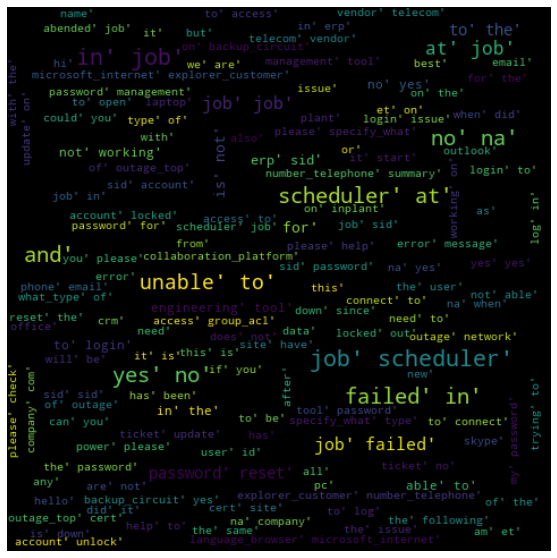

In [75]:
wordcloud = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10).generate(wordclouds)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

#### 5.5. Plotting wordcloud with top 100 words

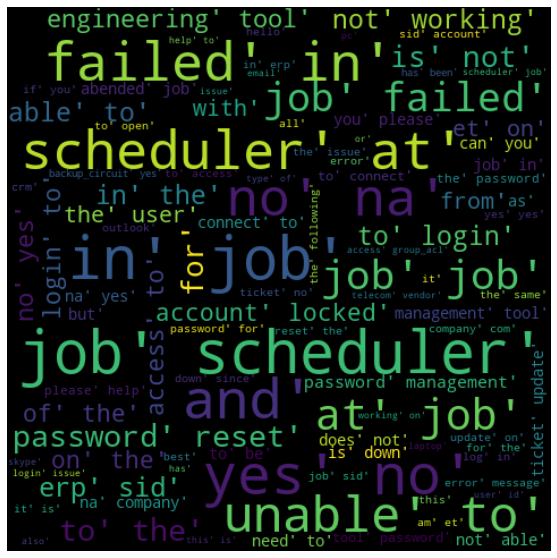

In [76]:
#check for the word count 100)
wordcloud_2 = WordCloud(width=480, height=480, max_words=100).generate(wordclouds)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud_2, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

#### 5.6. Wordclouds for each assignment group

In [77]:
#Copying to new dataframe to create wordclouds on target class

new_df = Datafinal.copy()
new_df['words'] = data_words_bigrams
new_df

,Short description,Description,Caller,Assignment group,merged,word_count,processed_text,words
0,login issue,verified user details employee and manager nam...,spxjnwir pjlcoqds,GRP_0,login issue verified user details employee and...,40,"[login, issue, verified, user, detail, employe...","[login, issue, verified, user, details, employ..."
1,outlook,hello team my meetings skype meetings etc ar...,hmjdrvpb komuaywn,GRP_0,outlook hello team my meetings skype meeting...,28,"[outlook, hello, team, meeting, skype, meeting...","[outlook, hello, team, my, meetings, skype, me..."
2,cant log in to a vpn,hi ne can log on to a vpn best,eylqgodm ybqkwiam,GRP_0,cant log in to a vpn hi ne can log on to a vpn...,17,"[cant, log, vpn, hi, ne, log, vpn, best]","[cant, log, in, to, vpn, hi, ne, can, log, on,..."
3,unable to access hr tool page,unable to access hr tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr tool page unable to access...,12,"[unable, access, hr, tool, page, unable, acces...","[unable, to, access, hr, tool, page, unable, t..."
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,4,"[skype, error, skype, error]","[skype, error, skype, error]"
...,...,...,...,...,...,...,...,...
8443,emails not coming in from zz mail,xd xd xd good afternoon xd am not receiving th...,avglmrts vhqmtiua,GRP_29,emails not coming in from zz mail xd xd xd goo...,28,"[email, coming, zz, mail, xd, xd, xd, good, af...","[emails, not, coming, in, from, zz, mail, xd_x..."
8444,telephony software issue,telephony software issue,rbozivdq gmlhrtvp,GRP_0,telephony software issue telephony software issue,6,"[telephony, software, issue, telephony, softwa...","[telephony_software, issue, telephony_software..."
8445,vip windows password reset for tifpdchb pedxruyf,vip windows password reset for tifpdchb pedxruyf,oybwdsgx oxyhwrfz,GRP_0,vip windows password reset for tifpdchb pedxru...,14,"[vip, window, password, reset, tifpdchb, pedxr...","[vip, windows, password, reset, for, tifpdchb,..."
8446,machine o est funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine o est funcionando i am unable to acces...,22,"[machine, est, funcionando, unable, access, ma...","[machine, est, funcionando, am, unable, to, ac..."


In [78]:
#Sorting based on frequency of target class Assignment group

value = new_df['Assignment group'].value_counts().sort_values(ascending=False).index
value

Index(['GRP_0', 'GRP_8', 'GRP_24', 'GRP_12', 'GRP_9', 'GRP_2', 'GRP_19',
       'GRP_3', 'GRP_6', 'GRP_13', 'GRP_10', 'GRP_5', 'GRP_14', 'GRP_25',
       'GRP_33', 'GRP_4', 'GRP_29', 'GRP_18', 'GRP_16', 'GRP_17', 'GRP_7',
       'GRP_34', 'GRP_31', 'GRP_26', 'GRP_40', 'GRP_28', 'GRP_41', 'GRP_15',
       'GRP_42', 'GRP_20', 'GRP_45', 'GRP_22', 'GRP_1', 'GRP_11', 'GRP_21',
       'GRP_47', 'GRP_23', 'GRP_62', 'GRP_30', 'GRP_60', 'GRP_39', 'GRP_27',
       'GRP_37', 'GRP_36', 'GRP_44', 'GRP_50', 'GRP_53', 'GRP_65', 'GRP_52',
       'GRP_55', 'GRP_51', 'GRP_49', 'GRP_48', 'GRP_46', 'GRP_59', 'GRP_43',
       'GRP_32', 'GRP_66', 'GRP_63', 'GRP_68', 'GRP_38', 'GRP_58', 'GRP_56',
       'GRP_72', 'GRP_71', 'GRP_69', 'GRP_54', 'GRP_57', 'GRP_61', 'GRP_64',
       'GRP_67', 'GRP_35', 'GRP_70', 'GRP_73'],
      dtype='object')

In [79]:

# Creating a function for wordcloud
def wordcloud_grp(f, x):
    wordclouds_0=' '.join(map(str, f))

    wc = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10, max_words=50).generate(wordclouds_0)
    plt.figure(figsize=(20,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Most common 50 words of {}".format(x))
    plt.margins(x=0, y=0)
    plt.show()

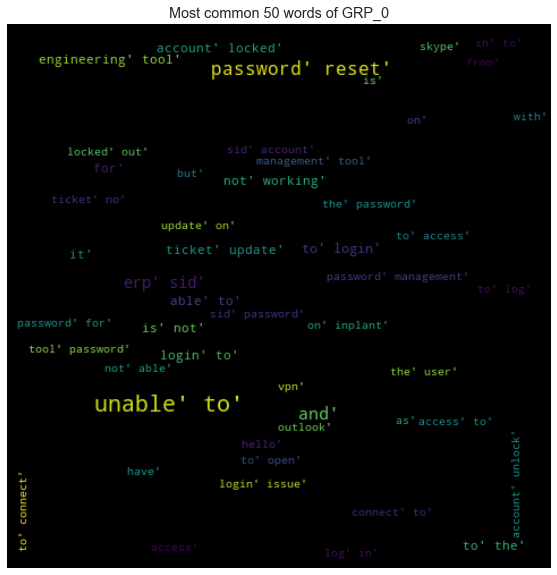

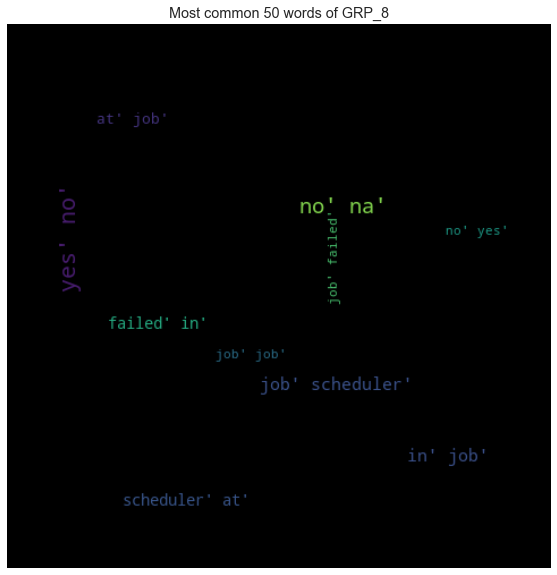

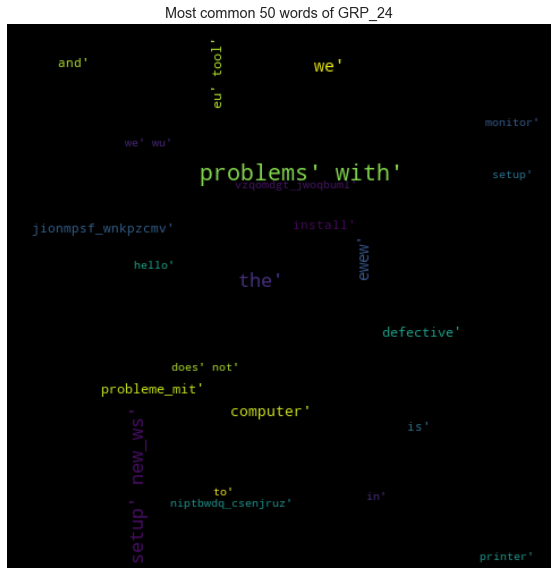

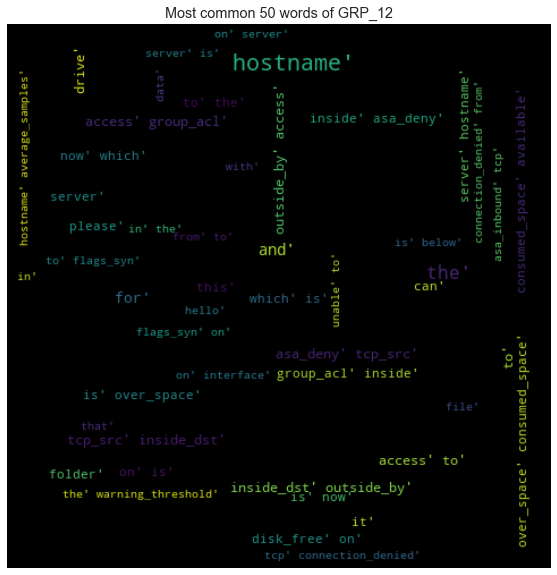

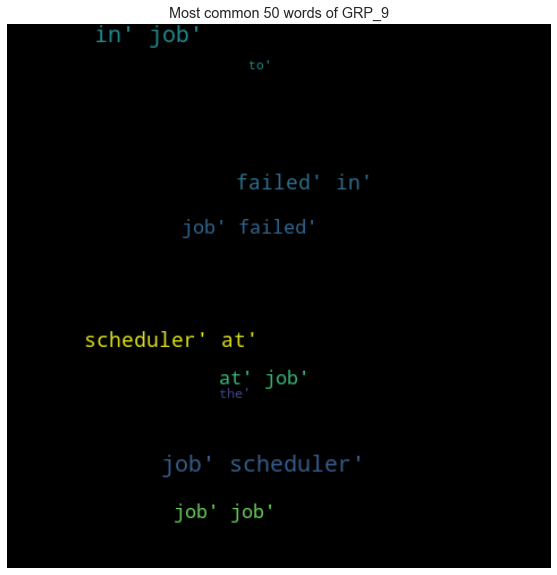

...

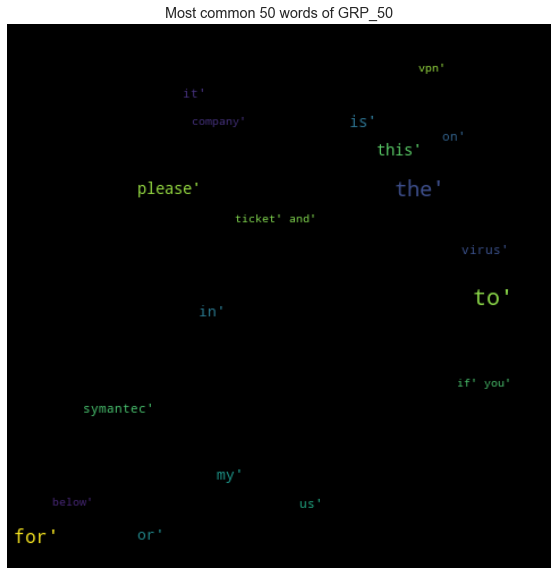

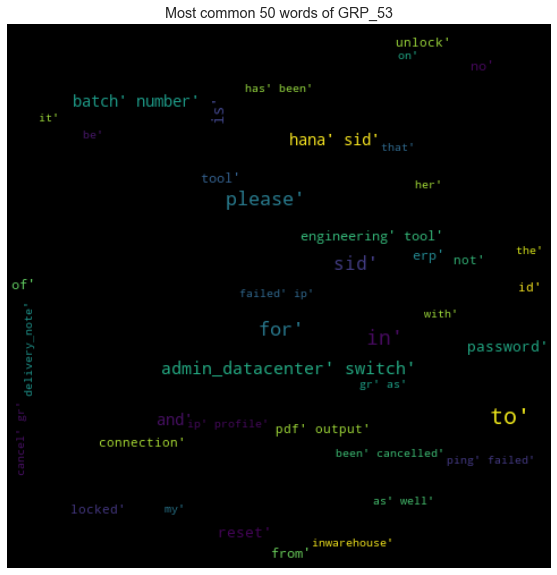

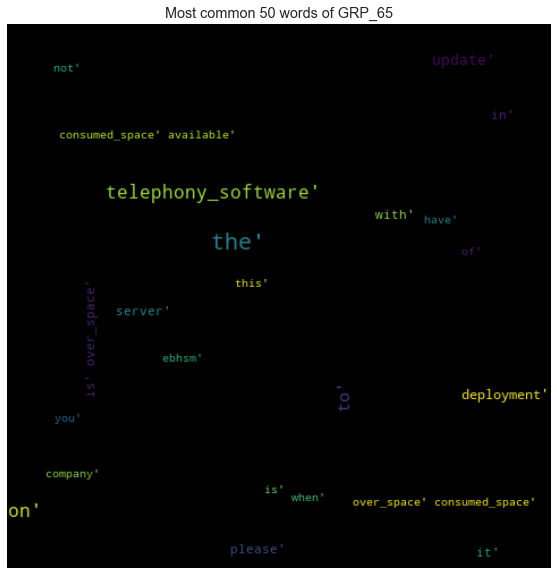

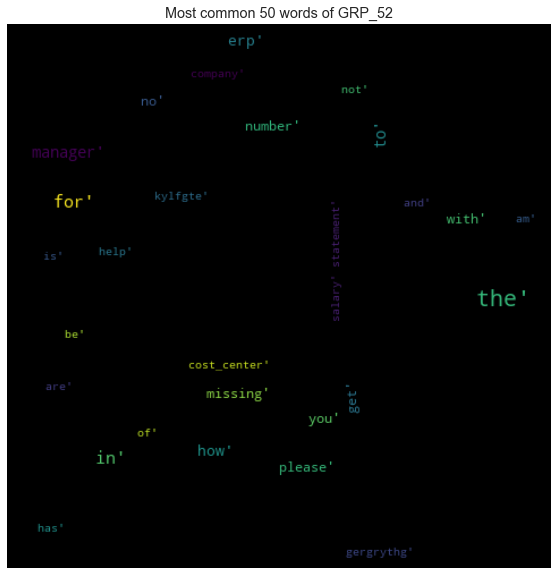

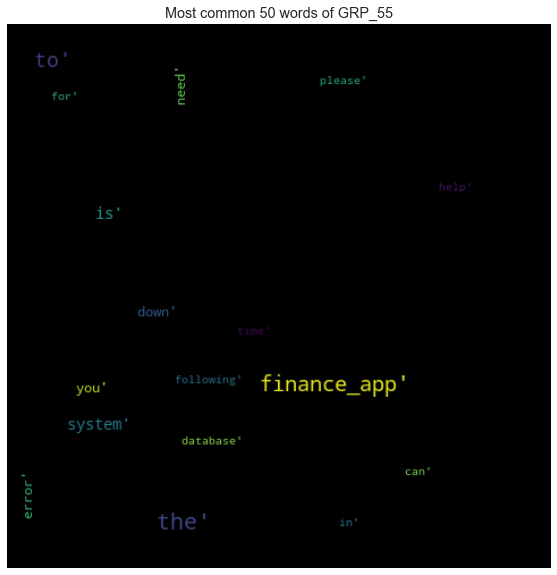

In [80]:
#for loop to pass the top 50 Assignment groups

for i in range(50):

    Grp = new_df[new_df ['Assignment group'] == value[i]]
    Grp = Grp['words']
    wordcloud_grp(Grp,value[i])

### 6. Vectorization of text data

In [81]:
!pip install glove-python-binary

You should consider upgrading via the 'c:\users\p0s041d\anaconda3\python.exe -m pip install --upgrade pip' command.


In [82]:
len(corpus)

8448

#### 6.1. Creating a column 'list_processed_text' to store all the processed texts in form of lists

In [83]:
Datafinal['list_processed_text']=''
for k in range(len(Datafinal['processed_text'])):
  new_list=[]
  print("k:",k)
  print("len:",type(Datafinal['processed_text'][k]))
  print("Data:",Datafinal['processed_text'][k])
  for i in range(len(Datafinal['processed_text'][k])):
        new_list.append([Datafinal['processed_text'][k][i]])
  #Datafinal.iloc[[k],['list_processed_text']]=new_list
  
  print("processed_text:",Datafinal.iloc[k]['processed_text'])
  Datafinal.at[k, 'list_processed_text'] = new_list
  print("list_processed_text:",Datafinal.iloc[k]['list_processed_text'])

k: 0
len: <class 'list'>
Data: ['login', 'issue', 'verified', 'user', 'detail', 'employee', 'manager', 'name', 'checked', 'user', 'name', 'ad', 'reset', 'password', 'advised', 'user', 'login', 'check', 'caller', 'confirmed', 'able', 'login', 'issue', 'resolved']
processed_text: ['login', 'issue', 'verified', 'user', 'detail', 'employee', 'manager', 'name', 'checked', 'user', 'name', 'ad', 'reset', 'password', 'advised', 'user', 'login', 'check', 'caller', 'confirmed', 'able', 'login', 'issue', 'resolved']
list_processed_text: [['login'], ['issue'], ['verified'], ['user'], ['detail'], ['employee'], ['manager'], ['name'], ['checked'], ['user'], ['name'], ['ad'], ['reset'], ['password'], ['advised'], ['user'], ['login'], ['check'], ['caller'], ['confirmed'], ['able'], ['login'], ['issue'], ['resolved']]
k: 1
len: <class 'list'>
Data: ['outlook', 'hello', 'team', 'meeting', 'skype', 'meeting', 'etc', 'appearing', 'outlook', 'calendar', 'somebody', 'please', 'advise', 'correct', 'kind']
pro

processed_text: ['engineering', 'tool', 'drawing', 'original', 'pdf', 'format', 'shown', 'hello', 'service', 'need', 'monitor', 'manufacturing', 'drawing', 'approve', 'manufacturing', 'engineering', 'tool', 'stopped', 'showing', 'pdf', 'original', 'process', 'erp', 'production', 'order', 'interface', 'vendor', 'ba', 'cr', 'rfc', 'destination', 'production', 'order', 'interface', 'vendor', 'view', 'accessible', 'file', 'cannot', 'stamped', 'bapireturnederrorexception', 'stack', 'trace', 'cadagent', 'erp', 'conn', 'jco', 'tm', 'jcoerpmanager', 'handlereturnstructureorreturntableline', 'jcoerpmanager', 'java', 'id', 'jcoerpmanager', 'java', 'wt', 'cadagent', 'erp', 'conn', 'jco', 'tm', 'jcoerpmanager', 'handlereturnstructure', 'jcoerpmanager', 'java', 'id', 'jcoerpmanager', 'java', 'wt', 'cadagent', 'erp', 'conn', 'jco', 'tm', 'jcoerpmanager', 'generirtcfunction', 'jcoerpmanager', 'java', 'id', 'jcoerpmanager', 'java', 'wt', 'cadagent', 'objmod', 'plmfile', 'checkoutview', 'plmfile', 'jav

processed_text: ['apply', 'mobile', 'phone', 'access', 'mail', 'box', 'apply', 'mobile', 'phone', 'access', 'mail', 'box']
list_processed_text: [['apply'], ['mobile'], ['phone'], ['access'], ['mail'], ['box'], ['apply'], ['mobile'], ['phone'], ['access'], ['mail'], ['box']]
k: 185
len: <class 'list'>
Data: ['data', 'correctly', 'pulled', 'employee', 'travel', 'tool', 'attendee', 'interface', 'data', 'correctly', 'pulled', 'employee', 'travel', 'tool', 'attendee', 'interface']
processed_text: ['data', 'correctly', 'pulled', 'employee', 'travel', 'tool', 'attendee', 'interface', 'data', 'correctly', 'pulled', 'employee', 'travel', 'tool', 'attendee', 'interface']
list_processed_text: [['data'], ['correctly'], ['pulled'], ['employee'], ['travel'], ['tool'], ['attendee'], ['interface'], ['data'], ['correctly'], ['pulled'], ['employee'], ['travel'], ['tool'], ['attendee'], ['interface']]
k: 186
len: <class 'list'>
Data: ['shipment', 'notification', 'nwfodmhc', 'exurcwkm', 'shipment', 'notif

processed_text: ['unable', 'log', 'es', 'unable', 'log', 'es']
list_processed_text: [['unable'], ['log'], ['es'], ['unable'], ['log'], ['es']]
k: 285
len: <class 'list'>
Data: ['skype', 'error', 'logging', 'skype', 'error', 'logging']
processed_text: ['skype', 'error', 'logging', 'skype', 'error', 'logging']
list_processed_text: [['skype'], ['error'], ['logging'], ['skype'], ['error'], ['logging']]
k: 286
len: <class 'list'>
Data: ['vitalyst', 'transfer', 'crm', 'installation', 'vitalyst', 'transfer', 'crm', 'installation']
processed_text: ['vitalyst', 'transfer', 'crm', 'installation', 'vitalyst', 'transfer', 'crm', 'installation']
list_processed_text: [['vitalyst'], ['transfer'], ['crm'], ['installation'], ['vitalyst'], ['transfer'], ['crm'], ['installation']]
k: 287
len: <class 'list'>
Data: ['unable', 'access', 'benefit', 'tab', 'unable', 'access', 'benefit', 'tab']
processed_text: ['unable', 'access', 'benefit', 'tab', 'unable', 'access', 'benefit', 'tab']
list_processed_text: [['

Data: ['engineering', 'tool', 'upload', 'issue', 'ufgkybsh', 'ijswtdve', 'pm', 'nwfodmhc', 'exurcwkm', 'tgryds', 'fw', 'engineering', 'tool', 'upload', 'issue', 'dear', 'sir', 'mam', 'please', 'find', 'screenshot', 'engineering', 'tool', 'issue', 'faced', 'upload', 'please', 'help', 'resolve']
processed_text: ['engineering', 'tool', 'upload', 'issue', 'ufgkybsh', 'ijswtdve', 'pm', 'nwfodmhc', 'exurcwkm', 'tgryds', 'fw', 'engineering', 'tool', 'upload', 'issue', 'dear', 'sir', 'mam', 'please', 'find', 'screenshot', 'engineering', 'tool', 'issue', 'faced', 'upload', 'please', 'help', 'resolve']
list_processed_text: [['engineering'], ['tool'], ['upload'], ['issue'], ['ufgkybsh'], ['ijswtdve'], ['pm'], ['nwfodmhc'], ['exurcwkm'], ['tgryds'], ['fw'], ['engineering'], ['tool'], ['upload'], ['issue'], ['dear'], ['sir'], ['mam'], ['please'], ['find'], ['screenshot'], ['engineering'], ['tool'], ['issue'], ['faced'], ['upload'], ['please'], ['help'], ['resolve']]
k: 385
len: <class 'list'>
Data:

Data: ['reach', 'password', 'management', 'tool', 'password', 'manager', 'change', 'password', 'name', 'mitgckqf', 'ewourgcx', 'language', 'browser', 'microsoft', 'internet', 'explorer', 'customer', 'number', 'summary', 'reach', 'password', 'management', 'tool', 'password', 'manager', 'change', 'password']
processed_text: ['reach', 'password', 'management', 'tool', 'password', 'manager', 'change', 'password', 'name', 'mitgckqf', 'ewourgcx', 'language', 'browser', 'microsoft', 'internet', 'explorer', 'customer', 'number', 'summary', 'reach', 'password', 'management', 'tool', 'password', 'manager', 'change', 'password']
list_processed_text: [['reach'], ['password'], ['management'], ['tool'], ['password'], ['manager'], ['change'], ['password'], ['name'], ['mitgckqf'], ['ewourgcx'], ['language'], ['browser'], ['microsoft'], ['internet'], ['explorer'], ['customer'], ['number'], ['summary'], ['reach'], ['password'], ['management'], ['tool'], ['password'], ['manager'], ['change'], ['password'

Data: ['problem', 'lan', 'r', 'computer', 'erosion', 'machine', 'dtlmbcrx', 'mwuateyx', 'problem', 'lan', 'r', 'computer', 'erosion', 'machine', 'dtlmbcrx', 'mwuateyx']
processed_text: ['problem', 'lan', 'r', 'computer', 'erosion', 'machine', 'dtlmbcrx', 'mwuateyx', 'problem', 'lan', 'r', 'computer', 'erosion', 'machine', 'dtlmbcrx', 'mwuateyx']
list_processed_text: [['problem'], ['lan'], ['r'], ['computer'], ['erosion'], ['machine'], ['dtlmbcrx'], ['mwuateyx'], ['problem'], ['lan'], ['r'], ['computer'], ['erosion'], ['machine'], ['dtlmbcrx'], ['mwuateyx']]
k: 590
len: <class 'list'>
Data: ['network', 'outage', 'south', 'amerirtca', 'rrc', 'network', 'company', 'sa', 'south', 'amerirtca', 'dmvpn', 'router', 'since', 'backup', 'circuit', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'yes', 'na', 'start', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', '

Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 685
len: <class 'list'>
Data: ['power', 'outage', 'engineering', 'toolkuznetsk', 'warehouse', 'russia', 'company', 'network', 'since', 'et', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'yes', 'na', 'start', 'et', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', 'network', 'yes', 'na', 'company', 'maint', 'yes', 'provider', 'maint', 'ticket', 'site', 'backup', 'circuit', 'yes', 'na', 'backup', 'circuit', 'active', 'yes', 'na', 'site', 'contact', 'notified', 'phone', 'email', 'yes', 'na', 'remote', 'dial', 'na', 'yes', 'na', '

len: <class 'list'>
Data: ['reincker', 'wzs', 'department', 'kentip', 'pc', 'doesn’t', 'start', 'restarting', 'stop', 'start-up', 'sequence,', 'please', 'check,', 'thank']
processed_text: ['reincker', 'wzs', 'department', 'kentip', 'pc', 'doesn’t', 'start', 'restarting', 'stop', 'start-up', 'sequence,', 'please', 'check,', 'thank']
list_processed_text: [['reincker'], ['wzs'], ['department'], ['kentip'], ['pc'], ['doesn’t'], ['start'], ['restarting'], ['stop'], ['start-up'], ['sequence,'], ['please'], ['check,'], ['thank']]
k: 785
len: <class 'list'>
Data: ['erp', 'slow', 'name', 'zheqafyo', 'bqirpxag', 'language', 'browser', 'microsoft', 'internet', 'explorer', 'customer', 'number', 'telephone', 'summary', 'erp', 'slow']
processed_text: ['erp', 'slow', 'name', 'zheqafyo', 'bqirpxag', 'language', 'browser', 'microsoft', 'internet', 'explorer', 'customer', 'number', 'telephone', 'summary', 'erp', 'slow']
list_processed_text: [['erp'], ['slow'], ['name'], ['zheqafyo'], ['bqirpxag'], ['lan

len: <class 'list'>
Data: ['please', 'set', 'user', 'gogtyektdgwo', 'correctly', 'login', 'network', 'drive', 'missing', 'please', 'set', 'user', 'gogtyektdgwo', 'correctly', 'login', 'network', 'drive', 'missing']
processed_text: ['please', 'set', 'user', 'gogtyektdgwo', 'correctly', 'login', 'network', 'drive', 'missing', 'please', 'set', 'user', 'gogtyektdgwo', 'correctly', 'login', 'network', 'drive', 'missing']
list_processed_text: [['please'], ['set'], ['user'], ['gogtyektdgwo'], ['correctly'], ['login'], ['network'], ['drive'], ['missing'], ['please'], ['set'], ['user'], ['gogtyektdgwo'], ['correctly'], ['login'], ['network'], ['drive'], ['missing']]
k: 885
len: <class 'list'>
Data: ['called', 'get', 'touch', 'ecwtrjnq', 'jpecxuty', 'called', 'get', 'touch', 'ecwtrjnq', 'jpecxuty']
processed_text: ['called', 'get', 'touch', 'ecwtrjnq', 'jpecxuty', 'called', 'get', 'touch', 'ecwtrjnq', 'jpecxuty']
list_processed_text: [['called'], ['get'], ['touch'], ['ecwtrjnq'], ['jpecxuty'], [

processed_text: ['unable', 'open', 'netweaver', 'unable', 'open', 'netweaver']
list_processed_text: [['unable'], ['open'], ['netweaver'], ['unable'], ['open'], ['netweaver']]
k: 979
len: <class 'list'>
Data: ['skype', 'functioning', 'trying', 'use', 'skype', 'responding', 'working', 'earlier']
processed_text: ['skype', 'functioning', 'trying', 'use', 'skype', 'responding', 'working', 'earlier']
list_processed_text: [['skype'], ['functioning'], ['trying'], ['use'], ['skype'], ['responding'], ['working'], ['earlier']]
k: 980
len: <class 'list'>
Data: ['vip', 'user', 'unable', 'login', 'pc', 'vip', 'user', 'unable', 'login', 'pc', 'advised', 'user', 'restart', 'pc', 'try', 'login', 'new', 'password', 'go', 'reset', 'help', 'user', 'login', 'pc', 'connected', 'user', 'system', 'using', 'teamviewer', 'help', 'user', 'login', 'password', 'manager', 'tool', 'password', 'tool', 'change', 'password', 'help', 'user', 'sync', 'psswords', 'company', 'network', 'caller', 'confirmed', 'able', 'login

list_processed_text: [['termination'], ['brthryian'], ['lsgthhuart'], ['termination'], ['brthryian'], ['lsgthhuart'], ['hello'], ['termination'], ['brthryian'], ['lsgthhuart'], ['effective'], ['approved'], ['click'], ['link'], ['view']]
k: 1078
len: <class 'list'>
Data: ['unable', 'sync', 'mail', 'iphone', 'unable', 'sync', 'mail', 'iphone']
processed_text: ['unable', 'sync', 'mail', 'iphone', 'unable', 'sync', 'mail', 'iphone']
list_processed_text: [['unable'], ['sync'], ['mail'], ['iphone'], ['unable'], ['sync'], ['mail'], ['iphone']]
k: 1079
len: <class 'list'>
Data: ['exchange', 'phone', 'hello', 'please', 'login', 'phone', 'server', 'changed', 'phone', 'old', 'iphone', 'new', 'want', 'connect', 'get', 'mail', 'exchange', 'outlook', 'iphone', 'iphone', 'phone', 'number', 'imei']
processed_text: ['exchange', 'phone', 'hello', 'please', 'login', 'phone', 'server', 'changed', 'phone', 'old', 'iphone', 'new', 'want', 'connect', 'get', 'mail', 'exchange', 'outlook', 'iphone', 'iphone', 

processed_text: ['network', 'outage', 'company', 'na', 'usa', 'usa', 'township', 'dmvpn', 'rtr', 'since', 'et', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'yes', 'na', 'start', 'et', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', 'network', 'yes', 'na', 'company', 'maint', 'yes', 'provider', 'maint', 'ticket', 'site', 'backup', 'circuit', 'yes', 'na', 'backup', 'circuit', 'active', 'yes', 'na', 'site', 'contact', 'notified', 'phone', 'email', 'yes', 'na', 'remote', 'dial', 'na', 'yes', 'na', 'equipment', 'reset', 'na', 'yes', 'na', 'verified', 'site', 'working', 'backup', 'circuit', 'yes', 'na', 'vendor', 'ticket', 'global', 'telecom', 'verizon', 'telecom', 'vendor', 'telecom', 'vendor', 'notified', 'gsc', 'yes', 'na', 'cert', 'started', 'yes', 'na', 'additional', 'diagnostics']
list_processed_text: [['network'], ['outage'], ['company'], ['na'], ['

processed_text: ['bobj', 'working', 'dear', 'report', 'bob', 'information', 'space', 'like', 'product', 'management', 'report', 'quota', 'report', 'others', 'missing', 'simply', 'get', 'empty', 'screen', 'user', 'report', 'problem', 'please', 'fix', 'issue']
list_processed_text: [['bobj'], ['working'], ['dear'], ['report'], ['bob'], ['information'], ['space'], ['like'], ['product'], ['management'], ['report'], ['quota'], ['report'], ['others'], ['missing'], ['simply'], ['get'], ['empty'], ['screen'], ['user'], ['report'], ['problem'], ['please'], ['fix'], ['issue']]
k: 1262
len: <class 'list'>
Data: ['volume', 'label', 'sys', 'amssm', 'ef', 'server', 'consumed', 'volume', 'label', 'sys', 'amssm', 'ef', 'server', 'space', 'consumed', 'space', 'available', 'g']
processed_text: ['volume', 'label', 'sys', 'amssm', 'ef', 'server', 'consumed', 'volume', 'label', 'sys', 'amssm', 'ef', 'server', 'space', 'consumed', 'space', 'available', 'g']
list_processed_text: [['volume'], ['label'], ['sys'

list_processed_text: [['network'], ['outage'], ['vogelfontein'], ['south'], ['africa'], ['sa'], ['network'], ['since'], ['et'], ['type'], ['outage'], ['network'], ['circuit'], ['power'], ['please'], ['specify'], ['type'], ['outage'], ['top'], ['cert'], ['site'], ['yes'], ['na'], ['start'], ['et'], ['scheduled'], ['maintenance'], ['power'], ['yes'], ['na'], ['company'], ['power'], ['provider'], ['power'], ['scheduled'], ['maintenance'], ['network'], ['yes'], ['na'], ['company'], ['maint'], ['yes'], ['provider'], ['maint'], ['ticket'], ['site'], ['backup'], ['circuit'], ['yes'], ['yes'], ['na'], ['backup'], ['circuit'], ['active'], ['yes'], ['na'], ['site'], ['contact'], ['notified'], ['phone'], ['email'], ['yes'], ['na'], ['remote'], ['dial'], ['na'], ['yes'], ['na'], ['equipment'], ['reset'], ['na'], ['yes'], ['na'], ['verified'], ['site'], ['working'], ['backup'], ['circuit'], ['yes'], ['na'], ['vendor'], ['ticket'], ['global'], ['telecom'], ['verizon'], ['telecom'], ['vendor'], ['tel

k: 1434
len: <class 'list'>
Data: ['unable', 'login', 'ethic', 'hello', 'company', 'apac', 'company', 'location', 'many', 'user', 'receive', 'email', 'ethic', 'training', 'fy', 'completed', 'ethic', 'training', 'fy', 'found', 'log', 'ethic', 'displayed', 'hint', 'please', 'help', 'u', 'change', 'user', 'ethic', 'status', 'back', 'correct', 'setting']
processed_text: ['unable', 'login', 'ethic', 'hello', 'company', 'apac', 'company', 'location', 'many', 'user', 'receive', 'email', 'ethic', 'training', 'fy', 'completed', 'ethic', 'training', 'fy', 'found', 'log', 'ethic', 'displayed', 'hint', 'please', 'help', 'u', 'change', 'user', 'ethic', 'status', 'back', 'correct', 'setting']
list_processed_text: [['unable'], ['login'], ['ethic'], ['hello'], ['company'], ['apac'], ['company'], ['location'], ['many'], ['user'], ['receive'], ['email'], ['ethic'], ['training'], ['fy'], ['completed'], ['ethic'], ['training'], ['fy'], ['found'], ['log'], ['ethic'], ['displayed'], ['hint'], ['please'], ['

list_processed_text: [['telephony'], ['software'], ['phone'], ['benelthyux'], ['team'], ['bad'], ['phone'], ['connection'], ['incomming'], ['call'], ['lot'], ['crackling'], ['interruption']]
k: 1534
len: <class 'list'>
Data: ['problem', 'lan', 'computer', 'wu', 'essa', 'wrcktgbd', 'wzrgyunp', 'problem', 'lan', 'computer', 'wu', 'essa', 'wrcktgbd', 'wzrgyunp']
processed_text: ['problem', 'lan', 'computer', 'wu', 'essa', 'wrcktgbd', 'wzrgyunp', 'problem', 'lan', 'computer', 'wu', 'essa', 'wrcktgbd', 'wzrgyunp']
list_processed_text: [['problem'], ['lan'], ['computer'], ['wu'], ['essa'], ['wrcktgbd'], ['wzrgyunp'], ['problem'], ['lan'], ['computer'], ['wu'], ['essa'], ['wrcktgbd'], ['wzrgyunp']]
k: 1535
len: <class 'list'>
Data: ['pdf', 'file', 'open', 'pdf', 'file', 'open']
processed_text: ['pdf', 'file', 'open', 'pdf', 'file', 'open']
list_processed_text: [['pdf'], ['file'], ['open'], ['pdf'], ['file'], ['open']]
k: 1536
len: <class 'list'>
Data: ['unable', 'print', 'inwarehouse', 'tool'

processed_text: ['application', 'erp', 'mii', 'node', 'hostname', 'hostname', 'application', 'erp', 'mii', 'node', 'hostname', 'hostname']
list_processed_text: [['application'], ['erp'], ['mii'], ['node'], ['hostname'], ['hostname'], ['application'], ['erp'], ['mii'], ['node'], ['hostname'], ['hostname']]
k: 1599
len: <class 'list'>
Data: ['m', 'office', 'word', 'issue', 'm', 'office', 'word', 'issue']
processed_text: ['m', 'office', 'word', 'issue', 'm', 'office', 'word', 'issue']
list_processed_text: [['m'], ['office'], ['word'], ['issue'], ['m'], ['office'], ['word'], ['issue']]
k: 1600
len: <class 'list'>
Data: ['access', 'sid', 'good', 'afternoon', 'would', 'please', 'check', 'error', 'sid', 'user', 'revelj', 'erp', 'sid', 'also', 'need', 'reset', 'password', 'sid', 'error', 'best']
processed_text: ['access', 'sid', 'good', 'afternoon', 'would', 'please', 'check', 'error', 'sid', 'user', 'revelj', 'erp', 'sid', 'also', 'need', 'reset', 'password', 'sid', 'error', 'best']
list_proc

len: <class 'list'>
Data: ['job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler', 'job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler']
processed_text: ['job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler', 'job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['bkwin'], ['hostname'], ['inc'], ['failed'], ['job'], ['scheduler'], ['job'], ['bkwin'], ['hostname'], ['inc'], ['failed'], ['job'], ['scheduler']]
k: 1700
len: <class 'list'>
Data: ['ticket', 'update', 'inc', 'ticket', 'update', 'inplant']
processed_text: ['ticket', 'update', 'inc', 'ticket', 'update', 'inplant']
list_processed_text: [['ticket'], ['update'], ['inc'], ['ticket'], ['update'], ['inplant']]
k: 1701
len: <class 'list'>
Data: ['power', 'laptop', 'power', 'laptop']
processed_text: ['power', 'laptop', 'power', 'laptop']
list_processed_text: [['power'], ['laptop'], ['power'], ['laptop']]
k: 1702
len: <class 'list'>
Data: ['erp', 'logon', 'changed'

k: 1811
len: <class 'list'>
Data: ['customer', 'able', 'call', 'company', 'toll', 'free', 'number', 'received', 'call', 'sale', 'person', 'badgknqs', 'xwelumfz', 'st', 'louis', 'mo', 'stating', 'tried', 'call', 'toll', 'free', 'number', 'time', 'received', 'message', 'number', 'service', 'checked', 'number', 'dialing', 'dialing', 'correct', 'number', 'urgent']
processed_text: ['customer', 'able', 'call', 'company', 'toll', 'free', 'number', 'received', 'call', 'sale', 'person', 'badgknqs', 'xwelumfz', 'st', 'louis', 'mo', 'stating', 'tried', 'call', 'toll', 'free', 'number', 'time', 'received', 'message', 'number', 'service', 'checked', 'number', 'dialing', 'dialing', 'correct', 'number', 'urgent']
list_processed_text: [['customer'], ['able'], ['call'], ['company'], ['toll'], ['free'], ['number'], ['received'], ['call'], ['sale'], ['person'], ['badgknqs'], ['xwelumfz'], ['st'], ['louis'], ['mo'], ['stating'], ['tried'], ['call'], ['toll'], ['free'], ['number'], ['time'], ['received'], 

list_processed_text: [['skype'], ['work'], ['dear'], ['team'], ['skype'], ['work'], ['best']]
k: 1908
len: <class 'list'>
Data: ['vpn', 'access', 'pls', 'help', 'hi', 'helpdesk', 'trying', 'access', 'vpn', 'following', 'message', 'appears', 'unable', 'get', 'clicking', 'click', 'pls', 'help', 'ppm', 'review', 'outside', 'company', 'office', 'team', 'today', 'need', 'access', 'data', 'company', 'folder', 'thx', 'micheyi', 'gyhus', 'vice', 'president', 'company', 'inc', 'www', 'company', 'com']
processed_text: ['vpn', 'access', 'pls', 'help', 'hi', 'helpdesk', 'trying', 'access', 'vpn', 'following', 'message', 'appears', 'unable', 'get', 'clicking', 'click', 'pls', 'help', 'ppm', 'review', 'outside', 'company', 'office', 'team', 'today', 'need', 'access', 'data', 'company', 'folder', 'thx', 'micheyi', 'gyhus', 'vice', 'president', 'company', 'inc', 'www', 'company', 'com']
list_processed_text: [['vpn'], ['access'], ['pls'], ['help'], ['hi'], ['helpdesk'], ['trying'], ['access'], ['vpn'],

list_processed_text: [['jabra'], ['headset'], ['issue'], ['needed'], ['hand'], ['setting'], ['jabra'], ['pro'], ['headset'], ['skype'], ['call'], ['installed'], ['driver'], ['sure'], ['else'], ['need'], ['done'], ['contact']]
k: 2006
len: <class 'list'>
Data: ['unlock', 'account', 'email', 'cell', 'phone', 'user', 'vhjkdqop', 'tkhafgrc', 'id', 'sanchrtyn', 'hello', 'team', 'could', 'please', 'unlock', 'account', 'email', 'cell', 'phone', 'user', 'vhjkdqop', 'tkhafgrc', 'id', 'sanchrtyn']
processed_text: ['unlock', 'account', 'email', 'cell', 'phone', 'user', 'vhjkdqop', 'tkhafgrc', 'id', 'sanchrtyn', 'hello', 'team', 'could', 'please', 'unlock', 'account', 'email', 'cell', 'phone', 'user', 'vhjkdqop', 'tkhafgrc', 'id', 'sanchrtyn']
list_processed_text: [['unlock'], ['account'], ['email'], ['cell'], ['phone'], ['user'], ['vhjkdqop'], ['tkhafgrc'], ['id'], ['sanchrtyn'], ['hello'], ['team'], ['could'], ['please'], ['unlock'], ['account'], ['email'], ['cell'], ['phone'], ['user'], ['vhjkd

k: 2070
len: <class 'list'>
Data: ['kindly', 'install', 'software', 'paint', 'shop', 'winzip', 'kindly', 'install', 'software', 'paint', 'shop', 'winzip']
processed_text: ['kindly', 'install', 'software', 'paint', 'shop', 'winzip', 'kindly', 'install', 'software', 'paint', 'shop', 'winzip']
list_processed_text: [['kindly'], ['install'], ['software'], ['paint'], ['shop'], ['winzip'], ['kindly'], ['install'], ['software'], ['paint'], ['shop'], ['winzip']]
k: 2071
len: <class 'list'>
Data: ['install', 'printer', 'oziflwma', 'nhgvmqdl', 'install', 'printer', 'oziflwma', 'nhgvmqdl']
processed_text: ['install', 'printer', 'oziflwma', 'nhgvmqdl', 'install', 'printer', 'oziflwma', 'nhgvmqdl']
list_processed_text: [['install'], ['printer'], ['oziflwma'], ['nhgvmqdl'], ['install'], ['printer'], ['oziflwma'], ['nhgvmqdl']]
k: 2072
len: <class 'list'>
Data: ['need', 'numeric', 'keypad', 'r', 'left', 'hand', 'hello', 'need', 'numeric', 'keypad', 'r', 'left', 'hand']
processed_text: ['need', 'numeri

list_processed_text: [['probleme'], ['mit'], ['wlan'], ['laptop'], ['weszfyok'], ['fbadnjhu'], ['probleme'], ['mit'], ['wlan'], ['laptop'], ['weszfyok'], ['fbadnjhu']]
k: 2170
len: <class 'list'>
Data: ['account', 'unlock', 'wu', 'account', 'unlock', 'wu']
processed_text: ['account', 'unlock', 'wu', 'account', 'unlock', 'wu']
list_processed_text: [['account'], ['unlock'], ['wu'], ['account'], ['unlock'], ['wu']]
k: 2171
len: <class 'list'>
Data: ['crm', 'screen', 'advanced', 'find', 'create', 'view', 'dear', 'select', 'crm', 'advanced', 'find', 'next', 'screen', 'scrolled', 'symbol', 'moved', 'query', 'nearly', 'impossible', 'create', 'view']
processed_text: ['crm', 'screen', 'advanced', 'find', 'create', 'view', 'dear', 'select', 'crm', 'advanced', 'find', 'next', 'screen', 'scrolled', 'symbol', 'moved', 'query', 'nearly', 'impossible', 'create', 'view']
list_processed_text: [['crm'], ['screen'], ['advanced'], ['find'], ['create'], ['view'], ['dear'], ['select'], ['crm'], ['advanced']

len: <class 'list'>
Data: ['name', 'issue', 'engineering', 'tool', 'system', 'hello', 'feel', 'sorry', 'say', 'late', 'facing', 'lot', 'issue', 'engineering', 'tool', 'system', 'please', 'note', 'name', 'appearing', 'ascending', 'order', 'alphabet', 'looking', 'particular', 'name', 'become', 'nightmare', 'best']
processed_text: ['name', 'issue', 'engineering', 'tool', 'system', 'hello', 'feel', 'sorry', 'say', 'late', 'facing', 'lot', 'issue', 'engineering', 'tool', 'system', 'please', 'note', 'name', 'appearing', 'ascending', 'order', 'alphabet', 'looking', 'particular', 'name', 'become', 'nightmare', 'best']
list_processed_text: [['name'], ['issue'], ['engineering'], ['tool'], ['system'], ['hello'], ['feel'], ['sorry'], ['say'], ['late'], ['facing'], ['lot'], ['issue'], ['engineering'], ['tool'], ['system'], ['please'], ['note'], ['name'], ['appearing'], ['ascending'], ['order'], ['alphabet'], ['looking'], ['particular'], ['name'], ['become'], ['nightmare'], ['best']]
k: 2267
len: <c

processed_text: ['circuit', 'outage', 'south', 'amerirtca', 'south', 'amerirtca', 'vpn', 'router', 'pm', 'et', 'site', 'primary', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'yes', 'na', 'start', 'pm', 'et', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', 'network', 'yes', 'na', 'company', 'maint', 'yes', 'provider', 'maint', 'ticket', 'site', 'backup', 'circuit', 'yes', 'yes', 'na', 'backup', 'circuit', 'active', 'yes', 'yes', 'na', 'site', 'contact', 'notified', 'phone', 'email', 'yes', 'na', 'remote', 'dial', 'na', 'yes', 'na', 'equipment', 'reset', 'na', 'yes', 'na', 'verified', 'site', 'working', 'backup', 'circuit', 'yes', 'yes', 'na', 'vendor', 'ticket', 'global', 'telecom', 'verizon', 'telecom', 'vendor', 'telecom', 'vendor', 'notified', 'gsc', 'yes', 'na', 'cert', 'started', 'yes', 'na', 'additional', 'diagnostics']
list_processed_text: [['c

processed_text: ['issue', 'bobj', 'dear', 'please', 'fix', 'bobj', 'problem', 'mjvfxnka', 'zvjxuahe', 'see', 'error', 'message']
list_processed_text: [['issue'], ['bobj'], ['dear'], ['please'], ['fix'], ['bobj'], ['problem'], ['mjvfxnka'], ['zvjxuahe'], ['see'], ['error'], ['message']]
k: 2419
len: <class 'list'>
Data: ['problem', 'wifi', 'good', 'morning', 'use', 'dell', 'latitude', 'home', 'office', 'using', 'wifi', 'network', 'internet', 'access', 'often', 'wake', 'powersave', 'mode', 'still', 'connected', 'local', 'wifi', 'network', 'identified', 'network', 'internet', 'connection', 'private', 'owned', 'device', 'pc', 'smartphone', 'tablet', 'still', 'work', 'fine', 'shut', 'restart', 'dell', 'get', 'proper', 'connection', 'please', 'advise', 'restarting', 'dell', 'couple', 'time', 'day', 'annoying', 'time', 'kirtyling', 'best']
processed_text: ['problem', 'wifi', 'good', 'morning', 'use', 'dell', 'latitude', 'home', 'office', 'using', 'wifi', 'network', 'internet', 'access', 'ofte

processed_text: ['vpn', 'issue', 'hello', 'team', 'vpn', 'accept', 'username', 'password', 'please', 'contact', 'earliest', 'convenience', 'best']
list_processed_text: [['vpn'], ['issue'], ['hello'], ['team'], ['vpn'], ['accept'], ['username'], ['password'], ['please'], ['contact'], ['earliest'], ['convenience'], ['best']]
k: 2503
len: <class 'list'>
Data: ['password', 'reset', 'password', 'management', 'tool', 'password', 'reset', 'password', 'management', 'tool']
processed_text: ['password', 'reset', 'password', 'management', 'tool', 'password', 'reset', 'password', 'management', 'tool']
list_processed_text: [['password'], ['reset'], ['password'], ['management'], ['tool'], ['password'], ['reset'], ['password'], ['management'], ['tool']]
k: 2504
len: <class 'list'>
Data: ['vip', 'ie', 'crash', 'opening', 'mii', 'es', 'portal', 'vip', 'ie', 'crash', 'opening', 'mii', 'es', 'portal', 'phone']
processed_text: ['vip', 'ie', 'crash', 'opening', 'mii', 'es', 'portal', 'vip', 'ie', 'crash', 

processed_text: ['cannot', 'access', 'mail', 'device', 'using', 'owa', 'outlook', 'lost', 'access', 'mail', 'went', 'checked', 'setting', 'account', 'found', 'error', 'attached', 'error', 'account', 'removed', 'license', 'applied', 'see', 'would', 'resolve', 'issue', 'still', 'get', 'email', 'try', 'accessing', 'account', 'via', 'owa', 'get', 'attrachment', 'error', 'issue', 'license', 'expired', 'cannot', 'receive', 'email', 'receive', 'reply', 'email', 'concerning', 'ticket']
list_processed_text: [['cannot'], ['access'], ['mail'], ['device'], ['using'], ['owa'], ['outlook'], ['lost'], ['access'], ['mail'], ['went'], ['checked'], ['setting'], ['account'], ['found'], ['error'], ['attached'], ['error'], ['account'], ['removed'], ['license'], ['applied'], ['see'], ['would'], ['resolve'], ['issue'], ['still'], ['get'], ['email'], ['try'], ['accessing'], ['account'], ['via'], ['owa'], ['get'], ['attrachment'], ['error'], ['issue'], ['license'], ['expired'], ['cannot'], ['receive'], ['email

len: <class 'list'>
Data: ['solution', 'needed', 'find', 'permanent', 'fix', 'able', 'use', 'memotech', 'solution', 'needed', 'find', 'permanent', 'fix', 'able', 'use', 'memotech', 'add', 'ken', 'mstipsolutions', 'com', 'compatibility', 'list']
processed_text: ['solution', 'needed', 'find', 'permanent', 'fix', 'able', 'use', 'memotech', 'solution', 'needed', 'find', 'permanent', 'fix', 'able', 'use', 'memotech', 'add', 'ken', 'mstipsolutions', 'com', 'compatibility', 'list']
list_processed_text: [['solution'], ['needed'], ['find'], ['permanent'], ['fix'], ['able'], ['use'], ['memotech'], ['solution'], ['needed'], ['find'], ['permanent'], ['fix'], ['able'], ['use'], ['memotech'], ['add'], ['ken'], ['mstipsolutions'], ['com'], ['compatibility'], ['list']]
k: 2634
len: <class 'list'>
Data: ['reset', 'password', 'constance', 'wgtyillsford', 'erp', 'production', 'bw', 'reset', 'password', 'constance', 'wgtyillsford', 'erp', 'production', 'bw']
processed_text: ['reset', 'password', 'constanc

len: <class 'list'>
Data: ['need', 'developer', 'display', 'access', 'user', 'uacyltoe', 'hxgayczecp', 'sid', 'system', 'need', 'developer', 'display', 'access', 'user', 'uacyltoe', 'hxgayczecp', 'sid', 'system']
processed_text: ['need', 'developer', 'display', 'access', 'user', 'uacyltoe', 'hxgayczecp', 'sid', 'system', 'need', 'developer', 'display', 'access', 'user', 'uacyltoe', 'hxgayczecp', 'sid', 'system']
list_processed_text: [['need'], ['developer'], ['display'], ['access'], ['user'], ['uacyltoe'], ['hxgayczecp'], ['sid'], ['system'], ['need'], ['developer'], ['display'], ['access'], ['user'], ['uacyltoe'], ['hxgayczecp'], ['sid'], ['system']]
k: 2734
len: <class 'list'>
Data: ['outlook', 'issue', 'encountring', 'outlook', 'issue', 'cannot', 'open', 'pc', 'urgent']
processed_text: ['outlook', 'issue', 'encountring', 'outlook', 'issue', 'cannot', 'open', 'pc', 'urgent']
list_processed_text: [['outlook'], ['issue'], ['encountring'], ['outlook'], ['issue'], ['cannot'], ['open'], [

len: <class 'list'>
Data: ['telephony', 'software', 'problem', 'connection', 'problem', 'calling', 'sr', 'sr', 'get', 'silent', 'line', 'get', 'connected', 'warehouse', 'toolmail', 'immediately']
processed_text: ['telephony', 'software', 'problem', 'connection', 'problem', 'calling', 'sr', 'sr', 'get', 'silent', 'line', 'get', 'connected', 'warehouse', 'toolmail', 'immediately']
list_processed_text: [['telephony'], ['software'], ['problem'], ['connection'], ['problem'], ['calling'], ['sr'], ['sr'], ['get'], ['silent'], ['line'], ['get'], ['connected'], ['warehouse'], ['toolmail'], ['immediately']]
k: 2834
len: <class 'list'>
Data: ['eu', 'tool', 'get', 'transfer', 'time', 'employee', 'since', 'today', 'please', 'see', 'attached', 'email']
processed_text: ['eu', 'tool', 'get', 'transfer', 'time', 'employee', 'since', 'today', 'please', 'see', 'attached', 'email']
list_processed_text: [['eu'], ['tool'], ['get'], ['transfer'], ['time'], ['employee'], ['since'], ['today'], ['please'], ['se

k: 2933
len: <class 'list'>
Data: ['read', 'write', 'authorization', 'r', 'hostname', 'production', 'read', 'write', 'authorization', 'r', 'hostname', 'production']
processed_text: ['read', 'write', 'authorization', 'r', 'hostname', 'production', 'read', 'write', 'authorization', 'r', 'hostname', 'production']
list_processed_text: [['read'], ['write'], ['authorization'], ['r'], ['hostname'], ['production'], ['read'], ['write'], ['authorization'], ['r'], ['hostname'], ['production']]
k: 2934
len: <class 'list'>
Data: ['modify', 'quote', 'performance', 'model', 'model', 'field', 'pk', 'publish', 'pk', 'otc', 'quote', 'zcae', 'quote', 'performance', 'value', 'raw', 'doc', 'curr', 'qt', 'see', 'rounding', 'see', 'attached', 'screenshot', 'converted', 'usd', 'sample', 'quote', 'value', 'lc', 'currency', 'document', 'usd', 'two', 'field', 'match']
processed_text: ['modify', 'quote', 'performance', 'model', 'model', 'field', 'pk', 'publish', 'pk', 'otc', 'quote', 'zcae', 'quote', 'performance

k: 3033
len: <class 'list'>
Data: ['job', 'job', 'conf', 'failed', 'job', 'scheduler', 'job', 'job', 'conf', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'conf', 'failed', 'job', 'scheduler', 'job', 'job', 'conf', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['conf'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['conf'], ['failed'], ['job'], ['scheduler']]
k: 3034
len: <class 'list'>
Data: ['vpn', 'connectivity', 'slow', 'vpn', 'connectivity', 'slow']
processed_text: ['vpn', 'connectivity', 'slow', 'vpn', 'connectivity', 'slow']
list_processed_text: [['vpn'], ['connectivity'], ['slow'], ['vpn'], ['connectivity'], ['slow']]
k: 3035
len: <class 'list'>
Data: ['vpn', 'disconnect', 'vpn', 'disconnect']
processed_text: ['vpn', 'disconnect', 'vpn', 'disconnect']
list_processed_text: [['vpn'], ['disconnect'], ['vpn'], ['disconnect']]
k: 3036
len: <class 'list'>
Data: ['erp', 'mae', 'id', 'seems', 'locked', 'hana', 'sid', 'erp', 'mae', 'id', '

k: 3133
len: <class 'list'>
Data: ['alrthyu', 'lowe', 'ee', 'need', 'show', 'financial', 'report', 'mikhghytr', 'robhyertyjs', 'receives', 'nicrhty', 'pi', 'scthyott', 'lortwe', 'pm', 'nwfodmhc', 'exurcwkm', 'trup', 'ti', 'fw', 'recode', 'acct', 'importance', 'high', 'team', 'please', 'see', 'email', 'chain', 'please', 'assign', 'alrthyu', 'lowe', 'ee', 'need', 'show', 'financial', 'report', 'mikhghytr', 'robhyertyjs', 'receives', 'nicrhty', 'piper', 'scthyott', 'lortwe', 'sale', 'manager', 'southeast', 'industrial', 'segment', 'christgry', 'financial', 'toolher', 'mikhghytr', 'robhyertyjs', 'scthyott', 'lortwe', 'recode', 'acct', 'hi', 'mikhghytr', 'account', 'erp', 'new', 'customer', 'quota', 'loaded', 'financial', 'reporting', 'per', 'direction', 'cpmaidhj', 'elbaqmtp', 'unfortunately', 'need', 'submit', 'ticket', 'reassigned', 'kindest']
processed_text: ['alrthyu', 'lowe', 'ee', 'need', 'show', 'financial', 'report', 'mikhghytr', 'robhyertyjs', 'receives', 'nicrhty', 'pi', 'scthyot

k: 3233
len: <class 'list'>
Data: ['network', 'printer', 'wy', 'issue', 'print', 'network', 'printer', 'wy', 'issue', 'print', 'warm']
processed_text: ['network', 'printer', 'wy', 'issue', 'print', 'network', 'printer', 'wy', 'issue', 'print', 'warm']
list_processed_text: [['network'], ['printer'], ['wy'], ['issue'], ['print'], ['network'], ['printer'], ['wy'], ['issue'], ['print'], ['warm']]
k: 3234
len: <class 'list'>
Data: ['error', 'message', 'document', 'release', 'hello', 'releasing', 'word', 'file', 'drawing', 'route', 'card', 'showing', 'error', 'message', 'server', 'offline', 'document', 'get', 'printed', 'required', 'help', 'resolving', 'issue', 'please', 'print', 'email', 'unless', 'absolutely', 'necessary', 'spread', 'environmental', 'awareness', 'confidentiality', 'caution', 'communication', 'including', 'accompanying', 'document', 'intended', 'sole', 'use', 'person', 'addressed', 'contain', 'information', 'privileged', 'confidential', 'exempt', 'disclosure', 'unauthorised

list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 3333
len: <class 'list'>
Data: ['m', 'crmdynamics', 'deployment', 'query', 'm', 'crm', 'dynamic', 'deployment', 'query']
processed_text: ['m', 'crmdynamics', 'deployment', 'query', 'm', 'crm', 'dynamic', 'deployment', 'query']
list_processed_text: [['m'], ['crmdynamics'], ['deployment'], ['query'], ['m'], ['crm'], ['dynamic'], ['deployment'], ['query']]
k: 3334
len: <class 'list'>
Data: ['uacyltoe', 'hxgaycze', 'message', 'email', 'efbwiadp', 'dicafxhv', 'pm', 'shesyhur', 'posrt', 'inc', 'uacyltoe', 'hxgaycze', 'message', 'hello', 'shesyhur', 'checked', 'issue', 'reported', 'previously', 'upgrade', 'user', 'getting', 'email', 'uacyltoe', 'hxgayczeing', 'email', 'configuration', 'please', 'aware', 'part', 'upgrade', 'safely', 'deleted']
processed_text: ['uacyltoe', 'hxgaycze', 'message', 'email', 'efbwiadp', 'dicafxhv', 'pm', 'shesyhur', 'posrt', 'inc', 'u

list_processed_text: [['access'], ['printer'], ['wy'], ['trainee'], ['hi'], ['please'], ['provide'], ['access'], ['wy'], ['printer'], ['machine'], ['tool'], ['business'], ['trainee'], ['trainee'], ['name'], ['blapmcwk'], ['dgrkbnua'], ['login'], ['id'], ['vvkusgtms'], ['computer'], ['awyw']]
k: 3433
len: <class 'list'>
Data: ['error', 'pgi', 'tandd', 'delivery', 'gso', 'please', 'open', 'ticket', 'erp', 'co', 'group', 'review', 'issue', 'tandd', 'delivery', 'pgi', 'work', 'co', 'assignment', 'different', 'profit', 'center']
processed_text: ['error', 'pgi', 'tandd', 'delivery', 'gso', 'please', 'open', 'ticket', 'erp', 'co', 'group', 'review', 'issue', 'tandd', 'delivery', 'pgi', 'work', 'co', 'assignment', 'different', 'profit', 'center']
list_processed_text: [['error'], ['pgi'], ['tandd'], ['delivery'], ['gso'], ['please'], ['open'], ['ticket'], ['erp'], ['co'], ['group'], ['review'], ['issue'], ['tandd'], ['delivery'], ['pgi'], ['work'], ['co'], ['assignment'], ['different'], ['profi

list_processed_text: [['printer'], ['problem'], ['issue'], ['information'], ['please'], ['complete'], ['required'], ['question'], ['returned'], ['back'], ['gsc'], ['requester'], ['provide'], ['required'], ['information'], ['printer'], ['name'], ['make'], ['model'], ['wy'], ['detailed'], ['description'], ['problem'], ['wy'], ['printer'], ['added'], ['pc'], ['type'], ['document'], ['printing'], ['email'], ['excel'], ['word'], ['etc']]
k: 3533
len: <class 'list'>
Data: ['need', 'reset', 'password', 'erp', 'sid', 'system', 'need', 'reset', 'password', 'erp', 'sid', 'system']
processed_text: ['need', 'reset', 'password', 'erp', 'sid', 'system', 'need', 'reset', 'password', 'erp', 'sid', 'system']
list_processed_text: [['need'], ['reset'], ['password'], ['erp'], ['sid'], ['system'], ['need'], ['reset'], ['password'], ['erp'], ['sid'], ['system']]
k: 3534
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 

len: <class 'list'>
Data: ['unable', 'update', 'password', 'unable', 'update', 'password']
processed_text: ['unable', 'update', 'password', 'unable', 'update', 'password']
list_processed_text: [['unable'], ['update'], ['password'], ['unable'], ['update'], ['password']]
k: 3636
len: <class 'list'>
Data: ['vip', 'erp', 'sid', 'account', 'unlock', 'vip', 'erp', 'sid', 'account', 'unlock']
processed_text: ['vip', 'erp', 'sid', 'account', 'unlock', 'vip', 'erp', 'sid', 'account', 'unlock']
list_processed_text: [['vip'], ['erp'], ['sid'], ['account'], ['unlock'], ['vip'], ['erp'], ['sid'], ['account'], ['unlock']]
k: 3637
len: <class 'list'>
Data: ['crm', 'configuration', 'password', 'reset', 'crm', 'configuration', 'password', 'reset']
processed_text: ['crm', 'configuration', 'password', 'reset', 'crm', 'configuration', 'password', 'reset']
list_processed_text: [['crm'], ['configuration'], ['password'], ['reset'], ['crm'], ['configuration'], ['password'], ['reset']]
k: 3638
len: <class 'lis

len: <class 'list'>
Data: ['password', 'reset', 'mii', 'password', 'reset', 'mii']
processed_text: ['password', 'reset', 'mii', 'password', 'reset', 'mii']
list_processed_text: [['password'], ['reset'], ['mii'], ['password'], ['reset'], ['mii']]
k: 3732
len: <class 'list'>
Data: ['phone', 'erp', 'name', 'password', 'incorrect', 'repeat', 'logon', 'cannot', 'log', 'erp', 'system', 'access', 'system', 'erp', 'able', 'log', 'system', 'entered', 'wynhtydf', 'username', 'password', 'enter', 'password', 'successfully', 'log', 'password', 'management', 'tool', 'password', 'manager', 'unlocked', 'system', 'access', 'password', 'management', 'tool', 'password', 'manager', 'still', 'cannot', 'log', 'please', 'see', 'screenshot', 'erp', 'error', 'screenshot', 'error', 'message', 'password', 'management', 'tool', 'password', 'unlock', 'list', 'erp', 'system', 'cannot', 'access']
processed_text: ['phone', 'erp', 'name', 'password', 'incorrect', 'repeat', 'logon', 'cannot', 'log', 'erp', 'system', '

processed_text: ['erp', 'internet', 'service', 'slow', 'user', 'erp', 'internet', 'service', 'slow', 'user']
list_processed_text: [['erp'], ['internet'], ['service'], ['slow'], ['user'], ['erp'], ['internet'], ['service'], ['slow'], ['user']]
k: 3833
len: <class 'list'>
Data: ['ainw', 'new', 'india', 'patching', 'antivirus', 'sw', 'desktop', 'server', 'pc', 'offline', 'since']
processed_text: ['ainw', 'new', 'india', 'patching', 'antivirus', 'sw', 'desktop', 'server', 'pc', 'offline', 'since']
list_processed_text: [['ainw'], ['new'], ['india'], ['patching'], ['antivirus'], ['sw'], ['desktop'], ['server'], ['pc'], ['offline'], ['since']]
k: 3834
len: <class 'list'>
Data: ['unable', 'download', 'engineering', 'tool', 'kindly', 'look', 'unable', 'extract', 'open', 'engineering', 'tool', 'file', 'please', 'revert', 'back', 'top', 'priority', 'case', 'study', 'required', 'discussed', 'get', 'error', 'best']
processed_text: ['unable', 'download', 'engineering', 'tool', 'kindly', 'look', 'una

processed_text: ['connection', 'issue', 'secomea', 'site', 'manager', 'well', 'fighting', 'week', 'supplier', 'technical', 'department', 'helping', 'also', 'refresh', 'memory', 'trouble', 'connecting', 'secomea', 'site', 'manager', 'secomea', 'cloud', 'history', 'configured', 'total', 'five', 'secomea', 'site', 'manger', 'uacyltoe', 'hxgaycze', 'one', 'complete', 'first', 'two', 'worked', 'still', 'work', 'fine', 'third', 'one', 'started', 'dropping', 'cloud', 'wont', 'connect', 'unit', 'four', 'five', 'wont', 'connect', 'never', 'tried', 'unit', 'three', 'building', 'one', 'two', 'luck', 'took', 'unit', 'three', 'home', 'connected', 'router', 'connects', 'see', 'gate', 'manager', 'use', 'every', 'machine', 'build', 'asking', 'help', 'company', 'department', 'direction', 'realize', 'might', 'familiar', 'product', 'attached', 'simple', 'troubleshooting', 'guide', 'secomea']
list_processed_text: [['connection'], ['issue'], ['secomea'], ['site'], ['manager'], ['well'], ['fighting'], ['wee

list_processed_text: [['skype'], ['personal'], ['certificate'], ['issue'], ['skype'], ['personal'], ['certificate'], ['issue']]
k: 4045
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 4046
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 4047
len: <class 'list'>
Data: ['use', 'outlook', 'group', 'best']
processed_text: ['use', 'outlook', 'group', 'best']
list_processed_text: [['use'], ['o

list_processed_text: [['unable'], ['login'], ['ethic'], ['trying'], ['login'], ['ethic'], ['user'], ['get'], ['following'], ['error'], ['welcome'], ['company'], ['business'], ['ethic'], ['conduct'], ['center'], ['ethic'], ['training'], ['site'], ['record'], ['indicate'], ['log'], ['credential'], ['used'], ['access'], ['site'], ['company'], ['collaboration'], ['platform'], ['match'], ['record'], ['file'], ['within'], ['active'], ['directory'], ['please'], ['submit'], ['ticket'], ['global'], ['support'], ['center'], ['ensure'], ['network'], ['log'], ['id'], ['correctly'], ['entered']]
k: 4139
len: <class 'list'>
Data: ['install', 'aiqjxhuv', 'dceghpwn', 'viewer', 'install', 'aiqjxhuv', 'dceghpwn', 'viewer', 'software', 'available', 'drive', 'temporary', 'aiqjxhuv', 'dceghpwn', 'viewer', 'subdirectory']
processed_text: ['install', 'aiqjxhuv', 'dceghpwn', 'viewer', 'install', 'aiqjxhuv', 'dceghpwn', 'viewer', 'software', 'available', 'drive', 'temporary', 'aiqjxhuv', 'dceghpwn', 'viewer', 

Data: ['stood', 'notion', 'order', 'mm', 'stood', 'notion', 'order', 'mm']
processed_text: ['stood', 'notion', 'order', 'mm', 'stood', 'notion', 'order', 'mm']
list_processed_text: [['stood'], ['notion'], ['order'], ['mm'], ['stood'], ['notion'], ['order'], ['mm']]
k: 4237
len: <class 'list'>
Data: ['ticket', 'update', 'inplant', 'ticket', 'update', 'inplant']
processed_text: ['ticket', 'update', 'inplant', 'ticket', 'update', 'inplant']
list_processed_text: [['ticket'], ['update'], ['inplant'], ['ticket'], ['update'], ['inplant']]
k: 4238
len: <class 'list'>
Data: ['cant', 'connect', 'erp', 'vpn', 'issue', 'cant', 'connect', 'erp', 'vpn', 'issue']
processed_text: ['cant', 'connect', 'erp', 'vpn', 'issue', 'cant', 'connect', 'erp', 'vpn', 'issue']
list_processed_text: [['cant'], ['connect'], ['erp'], ['vpn'], ['issue'], ['cant'], ['connect'], ['erp'], ['vpn'], ['issue']]
k: 4239
len: <class 'list'>
Data: ['getting', 'error', 'trying', 'open', 'hana', 'file', 'help', 'erp', 'excel', 'ad

k: 4338
len: <class 'list'>
Data: ['delete', 'charm', 'since', 'longer', 'required', 'request', 'delete', 'charm', 'since', 'longer', 'required']
processed_text: ['delete', 'charm', 'since', 'longer', 'required', 'request', 'delete', 'charm', 'since', 'longer', 'required']
list_processed_text: [['delete'], ['charm'], ['since'], ['longer'], ['required'], ['request'], ['delete'], ['charm'], ['since'], ['longer'], ['required']]
k: 4339
len: <class 'list'>
Data: ['job', 'pp', 'eu', 'tool', 'netch', 'ap', 'failed', 'job', 'scheduler', 'job', 'pp', 'eu', 'tool', 'netch', 'ap', 'failed', 'job', 'scheduler']
processed_text: ['job', 'pp', 'eu', 'tool', 'netch', 'ap', 'failed', 'job', 'scheduler', 'job', 'pp', 'eu', 'tool', 'netch', 'ap', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['pp'], ['eu'], ['tool'], ['netch'], ['ap'], ['failed'], ['job'], ['scheduler'], ['job'], ['pp'], ['eu'], ['tool'], ['netch'], ['ap'], ['failed'], ['job'], ['scheduler']]
k: 4340
len: <class 'list'>
D

processed_text: ['wl', 'scanner', 'working', 'wl', 'scanner', 'working', 'printer', 'working', 'fine', 'scanner', 'working', 'phone']
list_processed_text: [['wl'], ['scanner'], ['working'], ['wl'], ['scanner'], ['working'], ['printer'], ['working'], ['fine'], ['scanner'], ['working'], ['phone']]
k: 4407
len: <class 'list'>
Data: ['file', 'server', 'functioning', 'light', 'back', 'one', 'file', 'server', 'site', 'blinking', 'part', 'plant', 'access', 'network', 'resource', 'please', 'help', 'check', 'local', 'file', 'server', 'hostname', 'lrrsm', 'hostname', 'contact']
processed_text: ['file', 'server', 'functioning', 'light', 'back', 'one', 'file', 'server', 'site', 'blinking', 'part', 'plant', 'access', 'network', 'resource', 'please', 'help', 'check', 'local', 'file', 'server', 'hostname', 'lrrsm', 'hostname', 'contact']
list_processed_text: [['file'], ['server'], ['functioning'], ['light'], ['back'], ['one'], ['file'], ['server'], ['site'], ['blinking'], ['part'], ['plant'], ['acces

len: <class 'list'>
Data: ['auto', 'output', 'inwarehouse', 'tool', 'auto', 'output', 'inwarehouse', 'tool', 'siemens', 'cm', 'set', 'auto', 'output', 'inwarehouse', 'tool', 'however', 'received', 'email', 'trigger', 'line', 'invoicing', 'customer', 'website']
processed_text: ['auto', 'output', 'inwarehouse', 'tool', 'auto', 'output', 'inwarehouse', 'tool', 'siemens', 'cm', 'set', 'auto', 'output', 'inwarehouse', 'tool', 'however', 'received', 'email', 'trigger', 'line', 'invoicing', 'customer', 'website']
list_processed_text: [['auto'], ['output'], ['inwarehouse'], ['tool'], ['auto'], ['output'], ['inwarehouse'], ['tool'], ['siemens'], ['cm'], ['set'], ['auto'], ['output'], ['inwarehouse'], ['tool'], ['however'], ['received'], ['email'], ['trigger'], ['line'], ['invoicing'], ['customer'], ['website']]
k: 4533
len: <class 'list'>
Data: ['printer', 'problem', 'issue', 'information', 'recurring', 'problem', 'please', 'complete', 'required', 'question', 'returned', 'back', 'gsc', 'request

processed_text: ['unable', 'connect', 'wireless', 'laptop', 'unable', 'connect', 'wireless', 'laptop']
list_processed_text: [['unable'], ['connect'], ['wireless'], ['laptop'], ['unable'], ['connect'], ['wireless'], ['laptop']]
k: 4622
len: <class 'list'>
Data: ['urgent', 'reference', 'ticket', 'inc', 'uyjlodhq', 'ymedkatw', 'lghuiezj', 'mapped', 'unit', 'department', 'public', 'team', 'hostname', 'incorrectly', 'helped', 'mapping', 'network', 'drive', 'correctly', 'inc', 'reboot', 'computer', 'connecting', 'back', 'kkbsm', 'instead', 'hostname', 'access', 'drive', 'drive', 'drive', 'server', 'hostname', 'pc', 'name', 'ekxw', 'please', 'help', 'update', 'login', 'script', 'user', 'sica', 'pez', 'rufo', 'also', 'user', 'requested', 'process', 'request', 'soon', 'possible', 'daily', 'work', 'getting', 'hampered', 'urgent']
processed_text: ['urgent', 'reference', 'ticket', 'inc', 'uyjlodhq', 'ymedkatw', 'lghuiezj', 'mapped', 'unit', 'department', 'public', 'team', 'hostname', 'incorrectly'

list_processed_text: [['recall'], ['send'], ['message'], ['outlook'], ['recall'], ['send'], ['message'], ['outlook']]
k: 4707
len: <class 'list'>
Data: ['reset', 'password', 'mobaidfx', 'gviwlsrm', 'erp', 'production', 'hcm', 'reset', 'password']
processed_text: ['reset', 'password', 'mobaidfx', 'gviwlsrm', 'erp', 'production', 'hcm', 'reset', 'password']
list_processed_text: [['reset'], ['password'], ['mobaidfx'], ['gviwlsrm'], ['erp'], ['production'], ['hcm'], ['reset'], ['password']]
k: 4708
len: <class 'list'>
Data: ['hand', 'scanner', 'ckmeldeterminal', 'defective', 'hand', 'scanner', 'ckmeldeterminal', 'defective', 'kln']
processed_text: ['hand', 'scanner', 'ckmeldeterminal', 'defective', 'hand', 'scanner', 'ckmeldeterminal', 'defective', 'kln']
list_processed_text: [['hand'], ['scanner'], ['ckmeldeterminal'], ['defective'], ['hand'], ['scanner'], ['ckmeldeterminal'], ['defective'], ['kln']]
k: 4709
len: <class 'list'>
Data: ['netweaver', 'folgender', 'fehler', 'microsoft', 'net'

Data: ['kicked', 'vpn', 'reconnected', 'vpn', 'stopped', 'working', 'able', 'reconnected', 'minute']
processed_text: ['kicked', 'vpn', 'reconnected', 'vpn', 'stopped', 'working', 'able', 'reconnected', 'minute']
list_processed_text: [['kicked'], ['vpn'], ['reconnected'], ['vpn'], ['stopped'], ['working'], ['able'], ['reconnected'], ['minute']]
k: 4810
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 4811
len: <class 'list'>
Data: ['error', 'logging', 'hana', 'please', 'see', 'attached', 'error', 'receive', 'trying', 'log', 'hana']
processed_text: ['error', 'logging', 'hana', 'please', 'see', 'attached', 'error', 'receive', 'trying', 'log', 'hana']
list_processed_text: [['error'], ['loggi

k: 4901
len: <class 'list'>
Data: ['unable', 'connect', 'vpn', 'unable', 'connect', 'vpn']
processed_text: ['unable', 'connect', 'vpn', 'unable', 'connect', 'vpn']
list_processed_text: [['unable'], ['connect'], ['vpn'], ['unable'], ['connect'], ['vpn']]
k: 4902
len: <class 'list'>
Data: ['snagit', 'company', 'corporate', 'license', 'snagit', 'editor', 'qmglkaru', 'qiwhfkdv', 'manager', 'business', 'system', 'crm', 'news', 'final', 'release', 'fy', 'dynamic', 'crm', 'project', 'microsoft', 'dynamic', 'crm', 'mobile', 'app', 'available', 'download', 'crm', 'user', 'app', 'installed', 'io', 'android', 'window', 'phone', 'tablet', 'including', 'dell', 'window', 'tablet', 'laptop', 'detail', 'app', 'watch', 'launch', 'video', 'need', 'help', 'dynamic', 'crm', 'click', 'chat', 'live', 'agent', 'dynamic', 'crm', 'click']
processed_text: ['snagit', 'company', 'corporate', 'license', 'snagit', 'editor', 'qmglkaru', 'qiwhfkdv', 'manager', 'business', 'system', 'crm', 'news', 'final', 'release', 

k: 4987
len: <class 'list'>
Data: ['circuit', 'outage', 'primary', 'circuit', 'company', 'eu', 'deu', 'koenigsee', 'mpls', 'rtr', 'company', 'com', 'since', 'pm', 'et', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'yes', 'na', 'start', 'pm', 'et', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', 'network', 'yes', 'na', 'company', 'maint', 'yes', 'provider', 'maint', 'ticket', 'site', 'backup', 'circuit', 'yes', 'yes', 'na', 'backup', 'circuit', 'active', 'yes', 'yes', 'na', 'site', 'contact', 'notified', 'phone', 'email', 'yes', 'na', 'remote', 'dial', 'yes', 'na', 'equipment', 'reset', 'yes', 'na', 'verified', 'site', 'working', 'backup', 'circuit', 'yes', 'na', 'vendor', 'ticket', 'global', 'telecom', 'verizon', 'telecom', 'vendor', 'telecom', 'vendor', 'notified', 'gsc', 'yes', 'na', 'cert', 'started', 'yes', 'na', 'additional', 'diagnostics']
proce

processed_text: ['pls', 'unlock', 'reset', 'window', 'erp', 'account', 'user', 'vvtghjscha', 'pls', 'unlock', 'reset', 'window', 'erp', 'account', 'user', 'vvtghjscha']
list_processed_text: [['pls'], ['unlock'], ['reset'], ['window'], ['erp'], ['account'], ['user'], ['vvtghjscha'], ['pls'], ['unlock'], ['reset'], ['window'], ['erp'], ['account'], ['user'], ['vvtghjscha']]
k: 5089
len: <class 'list'>
Data: ['install', 'win', 'ewew', 'sgnubadl', 'gpkovbah', 'install', 'win', 'ewew', 'sgnubadl', 'gpkovbah']
processed_text: ['install', 'win', 'ewew', 'sgnubadl', 'gpkovbah', 'install', 'win', 'ewew', 'sgnubadl', 'gpkovbah']
list_processed_text: [['install'], ['win'], ['ewew'], ['sgnubadl'], ['gpkovbah'], ['install'], ['win'], ['ewew'], ['sgnubadl'], ['gpkovbah']]
k: 5090
len: <class 'list'>
Data: ['install', 'win', 'ewew', 'sgnubadl', 'gpkovbah', 'install', 'win', 'ewew', 'sgnubadl', 'gpkovbah']
processed_text: ['install', 'win', 'ewew', 'sgnubadl', 'gpkovbah', 'install', 'win', 'ewew', 'sg

k: 5182
len: <class 'list'>
Data: ['circuit', 'outage', 'circuit', 'outage', 'company', 'vpn', 'circuit', 'et', 'site', 'primary', 'circuit', 'type', 'outage', 'network', 'circuit', 'power', 'please', 'specify', 'type', 'outage', 'top', 'cert', 'site', 'slo', 'site', 'yes', 'na', 'start', 'et', 'scheduled', 'maintenance', 'power', 'yes', 'na', 'company', 'power', 'provider', 'power', 'scheduled', 'maintenance', 'network', 'yes', 'na', 'company', 'maint', 'yes', 'provider', 'maint', 'ticket', 'site', 'backup', 'circuit', 'yes', 'yes', 'na', 'backup', 'circuit', 'active', 'yes', 'yes', 'na', 'site', 'contact', 'notified', 'phone', 'email', 'yes', 'na', 'remote', 'dial', 'na', 'yes', 'na', 'equipment', 'reset', 'na', 'yes', 'na', 'verified', 'site', 'working', 'backup', 'circuit', 'yes', 'yes', 'na', 'vendor', 'ticket', 'global', 'telecom', 'verizon', 'telecom', 'vendor', 'telecom', 'vendor', 'notified', 'gsc', 'yes', 'na', 'cert', 'started', 'yes', 'na', 'additional', 'diagnostics']
proc

list_processed_text: [['account'], ['locked'], ['account'], ['locked']]
k: 5282
len: <class 'list'>
Data: ['changing', 'new', 'group', 'several', 'workflow', 'item', 'old', 'group', 'still', 'visible', 'new', 'group', 'workflow', 'phone', 'changed', 'milling', 'team', 'csd', 'holemaking', 'team', 'csd', 'still', 'several', 'workflow', 'item', 'old', 'group', 'visible', 'new', 'group', 'workflow', 'erp', 'substitution', 'ended', 'old', 'team', 'far', 'informed']
processed_text: ['changing', 'new', 'group', 'several', 'workflow', 'item', 'old', 'group', 'still', 'visible', 'new', 'group', 'workflow', 'phone', 'changed', 'milling', 'team', 'csd', 'holemaking', 'team', 'csd', 'still', 'several', 'workflow', 'item', 'old', 'group', 'visible', 'new', 'group', 'workflow', 'erp', 'substitution', 'ended', 'old', 'team', 'far', 'informed']
list_processed_text: [['changing'], ['new'], ['group'], ['several'], ['workflow'], ['item'], ['old'], ['group'], ['still'], ['visible'], ['new'], ['group'], [

list_processed_text: [['unable'], ['connect'], ['network'], ['usa'], ['michigan'], ['unable'], ['connect'], ['network'], ['usa'], ['michigan']]
k: 5382
len: <class 'list'>
Data: ['mapping', 'printer', 'mapping', 'printer']
processed_text: ['mapping', 'printer', 'mapping', 'printer']
list_processed_text: [['mapping'], ['printer'], ['mapping'], ['printer']]
k: 5383
len: <class 'list'>
Data: ['india', 'company', 'tcl', 'circuit', 'packet', 'drop', 'since', 'est', 'site', 'active', 'primary', 'packet', 'drop', 'internet', 'link', 'tcloc']
processed_text: ['india', 'company', 'tcl', 'circuit', 'packet', 'drop', 'since', 'est', 'site', 'active', 'primary', 'packet', 'drop', 'internet', 'link', 'tcloc']
list_processed_text: [['india'], ['company'], ['tcl'], ['circuit'], ['packet'], ['drop'], ['since'], ['est'], ['site'], ['active'], ['primary'], ['packet'], ['drop'], ['internet'], ['link'], ['tcloc']]
k: 5384
len: <class 'list'>
Data: ['ft', 'mill', 'cec', 'outlook', 'connectivity', 'majority

len: <class 'list'>
Data: ['unable', 'log', 'hub', 'es', 'portal', 'unable', 'log', 'hub', 'es', 'portal']
processed_text: ['unable', 'log', 'hub', 'es', 'portal', 'unable', 'log', 'hub', 'es', 'portal']
list_processed_text: [['unable'], ['log'], ['hub'], ['es'], ['portal'], ['unable'], ['log'], ['hub'], ['es'], ['portal']]
k: 5482
len: <class 'list'>
Data: ['engineering', 'tool', 'issue', 'engineering', 'tool', 'issue']
processed_text: ['engineering', 'tool', 'issue', 'engineering', 'tool', 'issue']
list_processed_text: [['engineering'], ['tool'], ['issue'], ['engineering'], ['tool'], ['issue']]
k: 5483
len: <class 'list'>
Data: ['erp', 'account', 'haunm', 'keep', 'locking', 'unlock', 'please', 'sid', 'erp', 'account', 'haunm', 'keep', 'locking', 'unlock', 'please', 'sid']
processed_text: ['erp', 'account', 'haunm', 'keep', 'locking', 'unlock', 'please', 'sid', 'erp', 'account', 'haunm', 'keep', 'locking', 'unlock', 'please', 'sid']
list_processed_text: [['erp'], ['account'], ['haunm'

processed_text: ['unable', 'open', 'outlook', 'unable', 'open', 'outlook']
list_processed_text: [['unable'], ['open'], ['outlook'], ['unable'], ['open'], ['outlook']]
k: 5582
len: <class 'list'>
Data: ['work', 'center', 'list', 'production', 'order', 'crtd', 'showing', 'work', 'center', 'list', 'production', 'order', 'crtd', 'showing', 'please', 'look', 'work', 'center', 'plant', 'stefdgthyo', 'kahrthyeui', 'vinhytry', 'discussed', 'hana', 'model', 'filtering', 'information', 'need', 'add', 'filter', 'mii']
processed_text: ['work', 'center', 'list', 'production', 'order', 'crtd', 'showing', 'work', 'center', 'list', 'production', 'order', 'crtd', 'showing', 'please', 'look', 'work', 'center', 'plant', 'stefdgthyo', 'kahrthyeui', 'vinhytry', 'discussed', 'hana', 'model', 'filtering', 'information', 'need', 'add', 'filter', 'mii']
list_processed_text: [['work'], ['center'], ['list'], ['production'], ['order'], ['crtd'], ['showing'], ['work'], ['center'], ['list'], ['production'], ['order

list_processed_text: [['window'], ['user'], ['id'], ['help'], ['desk'], ['please'], ['provide'], ['window'], ['user'], ['id'], ['user'], ['user'], ['id'], ['gbytu'], ['name'], ['bfghabu']]
k: 5679
len: <class 'list'>
Data: ['wifi', 'working', 'wifi', 'working']
processed_text: ['wifi', 'working', 'wifi', 'working']
list_processed_text: [['wifi'], ['working'], ['wifi'], ['working']]
k: 5680
len: <class 'list'>
Data: ['window', 'account', 'locked', 'window', 'account', 'locked']
processed_text: ['window', 'account', 'locked', 'window', 'account', 'locked']
list_processed_text: [['window'], ['account'], ['locked'], ['window'], ['account'], ['locked']]
k: 5681
len: <class 'list'>
Data: ['access', 'skpye', 'business', 'contact', 'phone', 'access', 'skpye', 'business', 'user', 'name', 'password', 'wrong']
processed_text: ['access', 'skpye', 'business', 'contact', 'phone', 'access', 'skpye', 'business', 'user', 'name', 'password', 'wrong']
list_processed_text: [['access'], ['skpye'], ['busine

Data: ['email', 'delegation', 'email', 'delegation']
processed_text: ['email', 'delegation', 'email', 'delegation']
list_processed_text: [['email'], ['delegation'], ['email'], ['delegation']]
k: 5774
len: <class 'list'>
Data: ['rqxmaindept', 'ad', 'account', 'keep', 'getting', 'locked', 'please', 'unlock', 'rqxmaindept', 'ad', 'account', 'keep', 'getting', 'locked', 'please', 'unlock']
processed_text: ['rqxmaindept', 'ad', 'account', 'keep', 'getting', 'locked', 'please', 'unlock', 'rqxmaindept', 'ad', 'account', 'keep', 'getting', 'locked', 'please', 'unlock']
list_processed_text: [['rqxmaindept'], ['ad'], ['account'], ['keep'], ['getting'], ['locked'], ['please'], ['unlock'], ['rqxmaindept'], ['ad'], ['account'], ['keep'], ['getting'], ['locked'], ['please'], ['unlock']]
k: 5775
len: <class 'list'>
Data: ['skype', 'login', 'issue', 'summary', 'unable', 'log', 'skype', 'password', 'change', 'yesterday']
processed_text: ['skype', 'login', 'issue', 'summary', 'unable', 'log', 'skype', '

processed_text: ['job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler', 'job', 'bkwin', 'hostname', 'inc', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['bkwin'], ['hostname'], ['inc'], ['failed'], ['job'], ['scheduler'], ['job'], ['bkwin'], ['hostname'], ['inc'], ['failed'], ['job'], ['scheduler']]
k: 5861
len: <class 'list'>
Data: ['changed', 'password', 'yesterday', 'outlook', 'connect', 'enter', 'login', 'data', 'window', 'keep', 'coming', 'back', 'login', 'work', 'changed', 'password', 'today', 'problem', 'cannot', 'use', 'outlook', 'cannot', 'process', 'mail']
processed_text: ['changed', 'password', 'yesterday', 'outlook', 'connect', 'enter', 'login', 'data', 'window', 'keep', 'coming', 'back', 'login', 'work', 'changed', 'password', 'today', 'problem', 'cannot', 'use', 'outlook', 'cannot', 'process', 'mail']
list_processed_text: [['changed'], ['password'], ['yesterday'], ['outlook'], ['connect'], ['enter'], ['login'], ['data'], ['window'], ['keep'], ['c

processed_text: ['failed', 'skype', 'mtg', 'dear', 'tried', 'join', 'sandop', 'forecasting', 'training', 'session', 'today', 'could', 'see', 'presenter', 'screen', 'link', 'training', 'rescheduled', 'coming', 'anything', 'check', 'insure', 'problem']
list_processed_text: [['failed'], ['skype'], ['mtg'], ['dear'], ['tried'], ['join'], ['sandop'], ['forecasting'], ['training'], ['session'], ['today'], ['could'], ['see'], ['presenter'], ['screen'], ['link'], ['training'], ['rescheduled'], ['coming'], ['anything'], ['check'], ['insure'], ['problem']]
k: 5950
len: <class 'list'>
Data: ['adding', 'member', 'shared', 'mailbox', 'group', 'adding', 'member', 'shared', 'mailbox', 'group']
processed_text: ['adding', 'member', 'shared', 'mailbox', 'group', 'adding', 'member', 'shared', 'mailbox', 'group']
list_processed_text: [['adding'], ['member'], ['shared'], ['mailbox'], ['group'], ['adding'], ['member'], ['shared'], ['mailbox'], ['group']]
k: 5951
len: <class 'list'>
Data: ['prtgghjk', 'sid',

processed_text: ['account', 'locked', 'password', 'reset', 'account', 'locked', 'password', 'reset']
list_processed_text: [['account'], ['locked'], ['password'], ['reset'], ['account'], ['locked'], ['password'], ['reset']]
k: 6049
len: <class 'list'>
Data: ['request', 'reset', 'microsoft', 'online', 'service', 'password', 'microsoft', 'behalf', 'company', 'inc', 'mail', 'nwfodmhc', 'exurcwkm', 'tiyhum', 'kuyiomar', 'rad', 'request', 'reset', 'microsoft', 'online', 'service', 'password', 'importance', 'high', 'request', 'reset', 'user', 'password', 'following', 'user', 'organization', 'requested', 'password', 'reset', 'performed', 'account', 'first', 'name', 'nehtjuavathi', 'last', 'name', 'patirjy', 'consider', 'contacting', 'user', 'validate', 'request', 'authentic', 'continuing', 'determined', 'valid', 'request', 'use', 'service', 'admin', 'portal', 'office', 'window', 'intune', 'window', 'azure', 'etc', 'reset', 'password', 'user', 'want', 'let', 'user', 'reset', 'password', 'check'

len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 6085
len: <class 'list'>
Data: ['please', 'reset', 'telephony', 'software', 'password', 'username', 'ticket', 'please', 'reset', 'telephony', 'software', 'password', 'name', 'full', 'name', 'cajdwtgq', 'breqgycv', 'username', 'pogredrty', 'extension', 'site', 'israel']
processed_text: ['please', 'reset', 'telephony', 'software', 'password', 'username', 'ticket', 'please', 'reset', 'telephony', 'software', 'password', 'name', 'full', 'name', 'cajdwtgq', 'breqgycv', 'username', 'pogredrty', 'extension', 'site', 'israel']
list_processed_text: [['please'], ['reset'], ['telephony'], ['software'], ['password'], ['username'], ['ticket'], ['please

Data: ['problem', 'erp', 'logon', 'sincerely,', 'best']
processed_text: ['problem', 'erp', 'logon', 'sincerely,', 'best']
list_processed_text: [['problem'], ['erp'], ['logon'], ['sincerely,'], ['best']]
k: 6182
len: <class 'list'>
Data: ['job', 'hostname', 'fail', 'failed', 'job', 'scheduler', 'job', 'hostname', 'fail', 'failed', 'job', 'scheduler']
processed_text: ['job', 'hostname', 'fail', 'failed', 'job', 'scheduler', 'job', 'hostname', 'fail', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['hostname'], ['fail'], ['failed'], ['job'], ['scheduler'], ['job'], ['hostname'], ['fail'], ['failed'], ['job'], ['scheduler']]
k: 6183
len: <class 'list'>
Data: ['job', 'hostname', 'fail', 'failed', 'job', 'scheduler', 'job', 'hostname', 'fail', 'failed', 'job', 'scheduler']
processed_text: ['job', 'hostname', 'fail', 'failed', 'job', 'scheduler', 'job', 'hostname', 'fail', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['hostname'], ['fail'], ['failed'], ['job'], [

processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 6288
len: <class 'list'>
Data: ['please', 'reset', 'password', 'hr', 'tool', 'globalview', 'sid', 'please', 'reset', 'password', 'hr', 'tool', 'globalview', 'sid']
processed_text: ['please', 'reset', 'password', 'hr', 'tool', 'globalview', 'sid', 'please', 'reset', 'password', 'hr', 'tool', 'globalview', 'sid']
list_processed_text: [['please'], ['reset'], ['password'], ['hr'], ['tool'], ['globalview'], ['sid'], ['please'], ['reset'], ['password'], ['hr'], ['tool'], ['globalview'], ['sid']]
k: 6289
len: <class 'list'>
Data: ['need', 'help', 'reset', 'password', 'need', 'help', 'reset', 'password']
processed_text: ['need', 'help', 'reset', 'password', 'need', 'help', 'reset', 'password']
list_processed_text: [['need'], ['help'], ['reset'], ['password'], 

Data: ['currently', 'unable', 'post', 'inwarehouse', 'tool', 'doc', 'po', 'please', 'advice', 'proceed', 'currently', 'unable', 'post', 'inwarehouse', 'tool', 'doc', 'po', 'please', 'advice', 'proceed']
processed_text: ['currently', 'unable', 'post', 'inwarehouse', 'tool', 'doc', 'po', 'please', 'advice', 'proceed', 'currently', 'unable', 'post', 'inwarehouse', 'tool', 'doc', 'po', 'please', 'advice', 'proceed']
list_processed_text: [['currently'], ['unable'], ['post'], ['inwarehouse'], ['tool'], ['doc'], ['po'], ['please'], ['advice'], ['proceed'], ['currently'], ['unable'], ['post'], ['inwarehouse'], ['tool'], ['doc'], ['po'], ['please'], ['advice'], ['proceed']]
k: 6384
len: <class 'list'>
Data: ['job', 'hostname', 'failagain', 'failed', 'job', 'scheduler', 'job', 'hostname', 'failagain', 'failed', 'job', 'scheduler']
processed_text: ['job', 'hostname', 'failagain', 'failed', 'job', 'scheduler', 'job', 'hostname', 'failagain', 'failed', 'job', 'scheduler']
list_processed_text: [['jo

Data: ['response', 'side', 'response', 'side']
processed_text: ['response', 'side', 'response', 'side']
list_processed_text: [['response'], ['side'], ['response'], ['side']]
k: 6488
len: <class 'list'>
Data: ['erp', 'login', 'account', 'locked', 'requesting', 'unlock', 'erp', 'login', 'account']
processed_text: ['erp', 'login', 'account', 'locked', 'requesting', 'unlock', 'erp', 'login', 'account']
list_processed_text: [['erp'], ['login'], ['account'], ['locked'], ['requesting'], ['unlock'], ['erp'], ['login'], ['account']]
k: 6489
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 6490
len: <class 'list'>
Data: ['email', 'address', 'picking', 'automatic', 'email', 'address', 'picking', 'a

Data: ['job', 'sid', 'arc', 'failed', 'job', 'scheduler', 'job', 'sid', 'arc', 'failed', 'job', 'scheduler']
processed_text: ['job', 'sid', 'arc', 'failed', 'job', 'scheduler', 'job', 'sid', 'arc', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['sid'], ['arc'], ['failed'], ['job'], ['scheduler'], ['job'], ['sid'], ['arc'], ['failed'], ['job'], ['scheduler']]
k: 6574
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job'], ['failed'], ['job'], ['scheduler'], ['job'], ['job'], ['failed'], ['job'], ['scheduler']]
k: 6575
len: <class 'list'>
Data: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
processed_text: ['job', 'job', 'failed', 'job', 'scheduler', 'job', 'job', 'failed', 'job', 'scheduler']
list_processed_text: [['job'], ['job']

k: 6678
len: <class 'list'>
Data: ['require', 'access', 'canadian', 'legal', 'reporting', 'website', 'thank', 'advance', 'wznkpjis', 'rantlypb', 'sc', 'tsrp', 'sr', 'ehs', 'analyst']
processed_text: ['require', 'access', 'canadian', 'legal', 'reporting', 'website', 'thank', 'advance', 'wznkpjis', 'rantlypb', 'sc', 'tsrp', 'sr', 'ehs', 'analyst']
list_processed_text: [['require'], ['access'], ['canadian'], ['legal'], ['reporting'], ['website'], ['thank'], ['advance'], ['wznkpjis'], ['rantlypb'], ['sc'], ['tsrp'], ['sr'], ['ehs'], ['analyst']]
k: 6679
len: <class 'list'>
Data: ['user', 'able', 'connect', 'drive', 'user', 'able', 'connect', 'drive']
processed_text: ['user', 'able', 'connect', 'drive', 'user', 'able', 'connect', 'drive']
list_processed_text: [['user'], ['able'], ['connect'], ['drive'], ['user'], ['able'], ['connect'], ['drive']]
k: 6680
len: <class 'list'>
Data: ['request', 'reset', 'microsoft', 'online', 'service', 'password', 'nwfodmhc', 'exurcwkm', 'pm', 'bmhxwvys', 'td

k: 6781
len: <class 'list'>
Data: ['setup', 'new', 'w', 'sqlmtixr', 'urhbvfgd', 'setup', 'new', 'w', 'sqlmtixr', 'urhbvfgd']
processed_text: ['setup', 'new', 'w', 'sqlmtixr', 'urhbvfgd', 'setup', 'new', 'w', 'sqlmtixr', 'urhbvfgd']
list_processed_text: [['setup'], ['new'], ['w'], ['sqlmtixr'], ['urhbvfgd'], ['setup'], ['new'], ['w'], ['sqlmtixr'], ['urhbvfgd']]
k: 6782
len: <class 'list'>
Data: ['awysv', 'esxi', 'host', 'user', 'virakv', 'ping', 'awysv', 'pinging', 'awysv', 'company', 'com', 'byte', 'data', 'request', 'timed', 'request', 'timed', 'request', 'timed', 'request', 'timed', 'ping', 'statistic', 'packet', 'sent', 'received', 'lost', 'loss']
processed_text: ['awysv', 'esxi', 'host', 'user', 'virakv', 'ping', 'awysv', 'pinging', 'awysv', 'company', 'com', 'byte', 'data', 'request', 'timed', 'request', 'timed', 'request', 'timed', 'request', 'timed', 'ping', 'statistic', 'packet', 'sent', 'received', 'lost', 'loss']
list_processed_text: [['awysv'], ['esxi'], ['host'], ['user'],

k: 6881
len: <class 'list'>
Data: ['vip', 'pls', 'usa', 'access', 'rus', 'hall', 'site', 'referenced', 'vip', 'pls', 'usa', 'access', 'rus', 'hall', 'site', 'referenced', 'aero', 'collaboration', 'platform', 'found']
processed_text: ['vip', 'pls', 'usa', 'access', 'rus', 'hall', 'site', 'referenced', 'vip', 'pls', 'usa', 'access', 'rus', 'hall', 'site', 'referenced', 'aero', 'collaboration', 'platform', 'found']
list_processed_text: [['vip'], ['pls'], ['usa'], ['access'], ['rus'], ['hall'], ['site'], ['referenced'], ['vip'], ['pls'], ['usa'], ['access'], ['rus'], ['hall'], ['site'], ['referenced'], ['aero'], ['collaboration'], ['platform'], ['found']]
k: 6882
len: <class 'list'>
Data: ['account', 'lock', 'password', 'reset', 'instruction', 'account', 'lock', 'password', 'reset', 'instruction']
processed_text: ['account', 'lock', 'password', 'reset', 'instruction', 'account', 'lock', 'password', 'reset', 'instruction']
list_processed_text: [['account'], ['lock'], ['password'], ['reset']

k: 6981
len: <class 'list'>
Data: ['external', 'complaint', 'status', 'assigned', 'hello', 'team', 'add', 'receiving', 'address', 'contact', 'person', 'tel', 'number', 'return', 'form', 'letgyo', 'jiftg', 'logistics', 'manager', 'johthryugftyson', 'hu', 'letgyo', 'jiftg', 'east', 'service', 'simfghon', 'wanrtyg', 'external', 'complaint', 'status', 'assigned', 'leo', 'please', 'check', 'possible', 'add', 'warehouse', 'person', 'receiving', 'return', 'plant', 'judthti', 'zhu', 'office', 'tel', 'return', 'form', 'attached']
processed_text: ['external', 'complaint', 'status', 'assigned', 'hello', 'team', 'add', 'receiving', 'address', 'contact', 'person', 'tel', 'number', 'return', 'form', 'letgyo', 'jiftg', 'logistics', 'manager', 'johthryugftyson', 'hu', 'letgyo', 'jiftg', 'east', 'service', 'simfghon', 'wanrtyg', 'external', 'complaint', 'status', 'assigned', 'leo', 'please', 'check', 'possible', 'add', 'warehouse', 'person', 'receiving', 'return', 'plant', 'judthti', 'zhu', 'office', '

k: 7081
len: <class 'list'>
Data: ['vnc', 'access', 'empwx', 'sk', 'presserei', 'germany', 'longer', 'work', 'error', 'message', 'failed', 'connect', 'server', 'lt', 'colleague', 'sk', 'press', 'shop', 'pc', 'number', 'correct', 'pc', 'replaced', 'renewed', 'thank']
processed_text: ['vnc', 'access', 'empwx', 'sk', 'presserei', 'germany', 'longer', 'work', 'error', 'message', 'failed', 'connect', 'server', 'lt', 'colleague', 'sk', 'press', 'shop', 'pc', 'number', 'correct', 'pc', 'replaced', 'renewed', 'thank']
list_processed_text: [['vnc'], ['access'], ['empwx'], ['sk'], ['presserei'], ['germany'], ['longer'], ['work'], ['error'], ['message'], ['failed'], ['connect'], ['server'], ['lt'], ['colleague'], ['sk'], ['press'], ['shop'], ['pc'], ['number'], ['correct'], ['pc'], ['replaced'], ['renewed'], ['thank']]
k: 7082
len: <class 'list'>
Data: ['good', 'movement', 'mb', 'hello', 'please', 'let', 'know', 'conduct', 'good', 'movement', 'mb', 'mm', 'accepted', 'iwazgesl', 'ydgqtpbo', 'proje

list_processed_text: [['please'], ['activate'], ['precimat'], ['please'], ['activate'], ['machine'], ['precimat'], ['no.'], ['yes'], ['azm']]
k: 7181
len: <class 'list'>
Data: ['password', 'reset', 'login', 'erp', 'hcm', 'able', 'use', 'apply', 'job', 'company', 'password', 'reset', 'login', 'erp', 'hcm', 'able', 'use', 'apply', 'job', 'company']
processed_text: ['password', 'reset', 'login', 'erp', 'hcm', 'able', 'use', 'apply', 'job', 'company', 'password', 'reset', 'login', 'erp', 'hcm', 'able', 'use', 'apply', 'job', 'company']
list_processed_text: [['password'], ['reset'], ['login'], ['erp'], ['hcm'], ['able'], ['use'], ['apply'], ['job'], ['company'], ['password'], ['reset'], ['login'], ['erp'], ['hcm'], ['able'], ['use'], ['apply'], ['job'], ['company']]
k: 7182
len: <class 'list'>
Data: ['erp', 'working', 'error', 'log', 'balancing', 'error', 'inc', 'cert', 'opened', 'work', 'around']
processed_text: ['erp', 'working', 'error', 'log', 'balancing', 'error', 'inc', 'cert', 'opene

list_processed_text: [['power'], ['outage'], ['usa'], ['company'], ['inc'], ['vpn'], ['circuit'], ['pm'], ['et'], ['site'], ['primary'], ['type'], ['outage'], ['network'], ['circuit'], ['power'], ['please'], ['specify'], ['type'], ['outage'], ['top'], ['cert'], ['site'], ['slo'], ['site'], ['yes'], ['na'], ['start'], ['pm'], ['et'], ['scheduled'], ['maintenance'], ['power'], ['yes'], ['na'], ['company'], ['power'], ['provider'], ['power'], ['scheduled'], ['maintenance'], ['network'], ['yes'], ['na'], ['company'], ['maint'], ['yes'], ['provider'], ['maint'], ['ticket'], ['site'], ['backup'], ['circuit'], ['yes'], ['yes'], ['na'], ['backup'], ['circuit'], ['active'], ['yes'], ['yes'], ['na'], ['site'], ['contact'], ['notified'], ['phone'], ['email'], ['yes'], ['na'], ['remote'], ['dial'], ['na'], ['yes'], ['na'], ['equipment'], ['reset'], ['na'], ['yes'], ['na'], ['verified'], ['site'], ['working'], ['backup'], ['circuit'], ['yes'], ['yes'], ['na'], ['vendor'], ['ticket'], ['global'], ['

list_processed_text: [['ad'], ['account'], ['lock'], ['ad'], ['account'], ['lock']]
k: 7381
len: <class 'list'>
Data: ['new', 'order', 'mm', 'dmhpm', 'mm', 'mb', 'crysyhtal', 'xithya', 'pm', 'nwfodmhc', 'exurcwkm', 'cindy', 'wanrtyg', 'marftgytin', 'xia', 'tfw', 'new', 'order', 'mm', 'dmhpm', 'mm', 'mb', 'importance', 'high', 'hi', 'please', 'advise', 'group', 'cost', 'mm', 'plant', 'plant', 'different', 'taking', 'mm', 'example', 'group', 'cost', 'group', 'cost']
processed_text: ['new', 'order', 'mm', 'dmhpm', 'mm', 'mb', 'crysyhtal', 'xithya', 'pm', 'nwfodmhc', 'exurcwkm', 'cindy', 'wanrtyg', 'marftgytin', 'xia', 'tfw', 'new', 'order', 'mm', 'dmhpm', 'mm', 'mb', 'importance', 'high', 'hi', 'please', 'advise', 'group', 'cost', 'mm', 'plant', 'plant', 'different', 'taking', 'mm', 'example', 'group', 'cost', 'group', 'cost']
list_processed_text: [['new'], ['order'], ['mm'], ['dmhpm'], ['mm'], ['mb'], ['crysyhtal'], ['xithya'], ['pm'], ['nwfodmhc'], ['exurcwkm'], ['cindy'], ['wanrtyg'], 

list_processed_text: [['cant'], ['complete'], ['quote'], ['number'], ['cant'], ['complete'], ['quote'], ['number'], ['get'], ['error'], ['massage'], ['line'], ['item'], ['entered'], ['brand'], ['listed'], ['enter'], ['valid'], ['brand'], ['line'], ['item']]
k: 7481
len: <class 'list'>
Data: ['unable', 'launch', 'netweaver', 'unable', 'launch', 'netweaver']
processed_text: ['unable', 'launch', 'netweaver', 'unable', 'launch', 'netweaver']
list_processed_text: [['unable'], ['launch'], ['netweaver'], ['unable'], ['launch'], ['netweaver']]
k: 7482
len: <class 'list'>
Data: ['netweaver', 'bussiness', 'client', 'open', 'netweaver', 'bussiness', 'client', 'open']
processed_text: ['netweaver', 'bussiness', 'client', 'open', 'netweaver', 'bussiness', 'client', 'open']
list_processed_text: [['netweaver'], ['bussiness'], ['client'], ['open'], ['netweaver'], ['bussiness'], ['client'], ['open']]
k: 7483
len: <class 'list'>
Data: ['hr', 'tool', 'portal', 'working', 'hr', 'tool', 'portal', 'working']

processed_text: ['abended', 'job', 'job', 'scheduler', 'job', 'abended', 'job', 'job', 'scheduler', 'job']
list_processed_text: [['abended'], ['job'], ['job'], ['scheduler'], ['job'], ['abended'], ['job'], ['job'], ['scheduler'], ['job']]
k: 7581
len: <class 'list'>
Data: ['abended', 'job', 'job', 'scheduler', 'job', 'abended', 'job', 'job', 'scheduler', 'job']
processed_text: ['abended', 'job', 'job', 'scheduler', 'job', 'abended', 'job', 'job', 'scheduler', 'job']
list_processed_text: [['abended'], ['job'], ['job'], ['scheduler'], ['job'], ['abended'], ['job'], ['job'], ['scheduler'], ['job']]
k: 7582
len: <class 'list'>
Data: ['reset', 'password', 'jcmxerol', 'nbfyczqr', 'using', 'password', 'management', 'tool', 'password', 'reset']
processed_text: ['reset', 'password', 'jcmxerol', 'nbfyczqr', 'using', 'password', 'management', 'tool', 'password', 'reset']
list_processed_text: [['reset'], ['password'], ['jcmxerol'], ['nbfyczqr'], ['using'], ['password'], ['management'], ['tool'], [

processed_text: ['unable', 'upload', 'engineering', 'tool', 'dear', 'sir', 'unable', 'upload', 'engineering', 'tool', 'error', 'showing', 'connected', 'server', 'application', 'show', 'connected', 'status', 'please', 'see', 'screen', 'shot', 'ref', 'best']
list_processed_text: [['unable'], ['upload'], ['engineering'], ['tool'], ['dear'], ['sir'], ['unable'], ['upload'], ['engineering'], ['tool'], ['error'], ['showing'], ['connected'], ['server'], ['application'], ['show'], ['connected'], ['status'], ['please'], ['see'], ['screen'], ['shot'], ['ref'], ['best']]
k: 7673
len: <class 'list'>
Data: ['password', 'work', 'say', 'account', 'disabled', 'password', 'work', 'say', 'account', 'disabled']
processed_text: ['password', 'work', 'say', 'account', 'disabled', 'password', 'work', 'say', 'account', 'disabled']
list_processed_text: [['password'], ['work'], ['say'], ['account'], ['disabled'], ['password'], ['work'], ['say'], ['account'], ['disabled']]
k: 7674
len: <class 'list'>
Data: ['abe

processed_text: ['unable', 'log', 'window', 'unable', 'log', 'window']
list_processed_text: [['unable'], ['log'], ['window'], ['unable'], ['log'], ['window']]
k: 7731
len: <class 'list'>
Data: ['usa', 'ar', 'pbx', 'rqxaudix', 'company', 'com', 'since', 'usa', 'ar', 'pbx', 'rqxaudix', 'company', 'com', 'since']
processed_text: ['usa', 'ar', 'pbx', 'rqxaudix', 'company', 'com', 'since', 'usa', 'ar', 'pbx', 'rqxaudix', 'company', 'com', 'since']
list_processed_text: [['usa'], ['ar'], ['pbx'], ['rqxaudix'], ['company'], ['com'], ['since'], ['usa'], ['ar'], ['pbx'], ['rqxaudix'], ['company'], ['com'], ['since']]
k: 7732
len: <class 'list'>
Data: ['access', 'security', 'group', 'gshn', 'summary', 'please', 'add', 'gshn', 'mail', 'group']
processed_text: ['access', 'security', 'group', 'gshn', 'summary', 'please', 'add', 'gshn', 'mail', 'group']
list_processed_text: [['access'], ['security'], ['group'], ['gshn'], ['summary'], ['please'], ['add'], ['gshn'], ['mail'], ['group']]
k: 7733
len: <c

list_processed_text: [['erp'], ['sid'], ['password'], ['reset'], ['user'], ['mertut'], ['erp'], ['sid'], ['password'], ['reset'], ['user'], ['mertut']]
k: 7776
len: <class 'list'>
Data: ['account', 'locked', 'account', 'locked']
processed_text: ['account', 'locked', 'account', 'locked']
list_processed_text: [['account'], ['locked'], ['account'], ['locked']]
k: 7777
len: <class 'list'>
Data: ['please', 'reset', 'erp', 'sid', 'password', 'user', 'peilerk', 'thank', 'dv', 'note', 'kind', 'regard']
processed_text: ['please', 'reset', 'erp', 'sid', 'password', 'user', 'peilerk', 'thank', 'dv', 'note', 'kind', 'regard']
list_processed_text: [['please'], ['reset'], ['erp'], ['sid'], ['password'], ['user'], ['peilerk'], ['thank'], ['dv'], ['note'], ['kind'], ['regard']]
k: 7778
len: <class 'list'>
Data: ['printing', 'hello', 'news', 'issue', 'printing', 'drawing', 'production', 'paper', 'issue', 'solved']
processed_text: ['printing', 'hello', 'news', 'issue', 'printing', 'drawing', 'production

processed_text: ['password', 'reset', 'expired', 'name', 'ivxybewh', 'ykhsqvnu', 'language', 'browser', 'microsoft', 'internet', 'explorer', 'customer', 'number', 'telephone', 'summary', 'need', 'password', 'reset', 'log', 'computer', 'erp']
list_processed_text: [['password'], ['reset'], ['expired'], ['name'], ['ivxybewh'], ['ykhsqvnu'], ['language'], ['browser'], ['microsoft'], ['internet'], ['explorer'], ['customer'], ['number'], ['telephone'], ['summary'], ['need'], ['password'], ['reset'], ['log'], ['computer'], ['erp']]
k: 7840
len: <class 'list'>
Data: ['unable', 'launch', 'outlook', 'unable', 'launch', 'outlook']
processed_text: ['unable', 'launch', 'outlook', 'unable', 'launch', 'outlook']
list_processed_text: [['unable'], ['launch'], ['outlook'], ['unable'], ['launch'], ['outlook']]
k: 7841
len: <class 'list'>
Data: ['vitalyst', 'transfer', 'service', 'unavailable', 'crm', 'online', 'vitalyst', 'transfer', 'service', 'unavailable', 'crm', 'online']
processed_text: ['vitalyst',

len: <class 'list'>
Data: ['client', 'pc', 'making', 'buzzing', 'noise', 'wont', 'turn', 'client', 'pc', 'making', 'buzzing', 'noise', 'wont', 'turn']
processed_text: ['client', 'pc', 'making', 'buzzing', 'noise', 'wont', 'turn', 'client', 'pc', 'making', 'buzzing', 'noise', 'wont', 'turn']
list_processed_text: [['client'], ['pc'], ['making'], ['buzzing'], ['noise'], ['wont'], ['turn'], ['client'], ['pc'], ['making'], ['buzzing'], ['noise'], ['wont'], ['turn']]
k: 7944
len: <class 'list'>
Data: ['activation', 'valid', 'microsoft', 'project', 'activation', 'valid', 'microsoft', 'project']
processed_text: ['activation', 'valid', 'microsoft', 'project', 'activation', 'valid', 'microsoft', 'project']
list_processed_text: [['activation'], ['valid'], ['microsoft'], ['project'], ['activation'], ['valid'], ['microsoft'], ['project']]
k: 7945
len: <class 'list'>
Data: ['security', 'incident', 'dsw', 'traffic', 'sinkhole', 'domain', 'lpawxsf', 'source', 'ip', 'system', 'name', 'lpawxsf', 'user',

processed_text: ['job', 'running', 'longer', 'minute', 'kirtyled', 'rerun', 'abended', 'job', 'job', 'scheduler', 'job']
list_processed_text: [['job'], ['running'], ['longer'], ['minute'], ['kirtyled'], ['rerun'], ['abended'], ['job'], ['job'], ['scheduler'], ['job']]
k: 8071
len: <class 'list'>
Data: ['delete', 'sto', 'johthryugftyson', 'hu', 'nwfodmhc', 'exurcwkm', 'qgrbnjiu', 'hidzlfma', 'fw', 'delete', 'sto', 'help', 'need', 'delete', 'sto', 'get', 'error', 'message', 'screen', 'block', 'avoid', 'unnessary', 'dn', 'created', 'please', 'help', 'check', 'delete']
processed_text: ['delete', 'sto', 'johthryugftyson', 'hu', 'nwfodmhc', 'exurcwkm', 'qgrbnjiu', 'hidzlfma', 'fw', 'delete', 'sto', 'help', 'need', 'delete', 'sto', 'get', 'error', 'message', 'screen', 'block', 'avoid', 'unnessary', 'dn', 'created', 'please', 'help', 'check', 'delete']
list_processed_text: [['delete'], ['sto'], ['johthryugftyson'], ['hu'], ['nwfodmhc'], ['exurcwkm'], ['qgrbnjiu'], ['hidzlfma'], ['fw'], ['delet

processed_text: ['time', 'recording', 'working', 'eu', 'tool', 'unable', 'connect', 'server', 'time', 'recording', 'eu', 'tool', 'work', 'eu', 'tool', 'installed', 'user', 'pc', 'telefon']
list_processed_text: [['time'], ['recording'], ['working'], ['eu'], ['tool'], ['unable'], ['connect'], ['server'], ['time'], ['recording'], ['eu'], ['tool'], ['work'], ['eu'], ['tool'], ['installed'], ['user'], ['pc'], ['telefon']]
k: 8146
len: <class 'list'>
Data: ['network', 'problem', 'multiple', 'application', 'running', 'slow', 'home', 'location', 'usa', 'whenever', 'come', 'u', 'plant', 'connect', 'network', 'pc', 'run', 'estorage', 'productly', 'slow', 'programdntys', 'slow', 'determine', 'network', 'problem', 'erp', 'slow', 'please', 'use', 'quick', 'ticket', 'within', 'erp', 'folder', 'erp', 'running', 'slow', 'one', 'transaction', 'impacted', 'erp', 'server', 'server', 'name', 'located', 'status', 'bar', 'bottom', 'right', 'screen', 'co', 'worker', 'also', 'notice', 'slow', 'response', 'tim

k: 8246
len: <class 'list'>
Data: ['recall', 'chg', 'approve', 'vkezwolt', 'fgnqzeai', 'would', 'like', 'recall', 'message', 'chg', 'approve']
processed_text: ['recall', 'chg', 'approve', 'vkezwolt', 'fgnqzeai', 'would', 'like', 'recall', 'message', 'chg', 'approve']
list_processed_text: [['recall'], ['chg'], ['approve'], ['vkezwolt'], ['fgnqzeai'], ['would'], ['like'], ['recall'], ['message'], ['chg'], ['approve']]
k: 8247
len: <class 'list'>
Data: ['abended', 'job', 'job', 'scheduler', 'sid', 'start', 'abended', 'job', 'job', 'scheduler', 'sid', 'start']
processed_text: ['abended', 'job', 'job', 'scheduler', 'sid', 'start', 'abended', 'job', 'job', 'scheduler', 'sid', 'start']
list_processed_text: [['abended'], ['job'], ['job'], ['scheduler'], ['sid'], ['start'], ['abended'], ['job'], ['job'], ['scheduler'], ['sid'], ['start']]
k: 8248
len: <class 'list'>
Data: ['abended', 'job', 'job', 'scheduler', 'sid', 'cold', 'abended', 'job', 'job', 'scheduler', 'sid', 'cold']
processed_text: [

processed_text: ['ticket', 'ticket', 'update', 'anftgup', 'nftgyair', 'ticket', 'ticket', 'update', 'anftgup', 'nftgyair']
list_processed_text: [['ticket'], ['ticket'], ['update'], ['anftgup'], ['nftgyair'], ['ticket'], ['ticket'], ['update'], ['anftgup'], ['nftgyair']]
k: 8337
len: <class 'list'>
Data: ['outlook', 'issue', 'crm', 'giving', 'error', 'message', 'outlook', 'issue', 'crm', 'giving', 'error', 'message']
processed_text: ['outlook', 'issue', 'crm', 'giving', 'error', 'message', 'outlook', 'issue', 'crm', 'giving', 'error', 'message']
list_processed_text: [['outlook'], ['issue'], ['crm'], ['giving'], ['error'], ['message'], ['outlook'], ['issue'], ['crm'], ['giving'], ['error'], ['message']]
k: 8338
len: <class 'list'>
Data: ['outlook', 'open', 'stuck', 'screen', 'showing', 'processing', 'outlook', 'open', 'stuck', 'screen', 'showing', 'processing']
processed_text: ['outlook', 'open', 'stuck', 'screen', 'showing', 'processing', 'outlook', 'open', 'stuck', 'screen', 'showing',

len: <class 'list'>
Data: ['ticket', 'update', 'ticket', 'ticket', 'update', 'ticket']
processed_text: ['ticket', 'update', 'ticket', 'ticket', 'update', 'ticket']
list_processed_text: [['ticket'], ['update'], ['ticket'], ['ticket'], ['update'], ['ticket']]
k: 8435
len: <class 'list'>
Data: ['telephony', 'software', 'missing', 'pc', 'pc', 'received', 'multiple', 'window', 'security', 'update', 'earlier', 'telephony', 'software', 'software', 'missing', 'screen', 'xd', 'ran', 'requirement', 'check', 'software', 'see', 'dotnet', 'framdntyework', 'installed', 'pc', 'xd', 'telephony', 'software', 'fails', 'install', 'absence', 'dotnet', 'xd', 'used', 'dotnet', 'uninstaller', 'remove', 'version', 'restarted', 'pc', 'dotnet', 'still', 'fails', 'install', 'xd', 'ran', 'repair', 'tool', 'see', 'pc', 'still', 'dot', 'net', 'installed', 'xd', 'xd', 'need', 'help', 'setup', 'compatible', 'version', 'dotnet', 'pc', 'help', 'install', 'telephony', 'software', 'xd', 'xd', 'checked', 'previous', 'case

In [84]:
from glove import Corpus, Glove
# creating a corpus object
corpus_glv = Corpus() 

#### 6.2. Creating word vectors from list of processed texts

In [85]:
Datafinal['word_vec']=''
for i in range(len(Datafinal['list_processed_text'])):
    print("i:",i)
#training the corpus to generate the co occurence matrix which is used in GloVe
    corpus_glv.fit(Datafinal.iloc[i]['list_processed_text'], window=10)
#creating a Glove object which will use the matrix created in the above lines to create embeddings
#We can set the learning rate as it uses Gradient Descent and number of components
    glove = Glove(no_components=5, learning_rate=0.05)
    glove.fit(corpus_glv.matrix, epochs=30, no_threads=4, verbose=True)
    glove.add_dictionary(corpus_glv.dictionary)
    Datafinal['word_vec'][i]=glove.word_vectors

i: 0
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoc

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 40
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 41
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 42
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoc

Epoch 29
i: 70
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 71
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 72
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 73
Performing 30 training epochs with 4 threads
Epoch 0

Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 98
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 99
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 100
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 101
Perfo

i: 130
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 131
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 132
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 133
Performing 30 training epochs with 4 threads
Epoch 0
Epoc

Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 181
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 182
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 183
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
E

Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 222
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 223
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 224
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 225
Performing 3

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 268
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 269
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 270
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epo

Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 311
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 312
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 313
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
E

i: 342
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 343
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 344
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 345
Performing 30 training epochs with 4 threads
Epoch 0
Epoc

i: 380
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 381
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 382
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 383
Performing 30 training epochs with 4 threads
Epoch 0
Epoc

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 419
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 420
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 421
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epo

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 453
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 454
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 455
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i

Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 494
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 495
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 496
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
E

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 521
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 522
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 523
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epo

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 559
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 560
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 561
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epo

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 586
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 587
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 588
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8


Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 625
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 626
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 627
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 628
Performing 3

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 667
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 668
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 669
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 694
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 695
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 696
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epo

Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 729
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 730
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 731
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9


i: 760
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 761
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 762
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 763
Performing 30 training epochs with 4 threads
Epoch 0
Epoc

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 792
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 793
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 794
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
E

i: 828
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 829
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 830
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 831
Performing 30 training epochs with 4 threads
Epoch 0
Epoc

Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 867
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 868
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 869
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epo

Epoch 29
i: 908
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 909
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 910
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 911
Performing 30 training epochs with 4 threads
Epo

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 950
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 951
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 952
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
E

Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 990
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 991
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 992
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
E

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1017
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1018
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1019
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1059
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1060
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1061
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
E

Epoch 29
i: 1096
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1097
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1098
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1099
Performing 30 training epochs with 4 threads

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1133
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1134
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1135
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1167
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1168
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1169
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1196
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1197
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1198
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1234
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1235
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1236
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1273
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1274
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1275
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 2

i: 1306
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1307
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1308
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1309
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1345
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1346
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1347
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 1384
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1385
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1386
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1387
Performing 30 training epochs with 4 threads
Epoch 0


i: 1423
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1424
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1425
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1426
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1461
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1462
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1463
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1464

Epoch 28
Epoch 29
i: 1501
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1502
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1503
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1504
Performing 30 training epochs with 

i: 1540
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1541
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1542
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1543
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1578
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1579
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1580
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1581
Performi

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1617
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1618
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1619
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1656
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1657
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1658
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1696
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1697
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1698
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epo

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1732
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1733
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1734
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1770
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1771
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1772
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 28
Epoch 29
i: 1805
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1806
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1807
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1808
Performing 30 training epochs with 

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1844
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1845
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1846
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1882
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1883
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1884
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1919
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1920
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1921
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1959
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1960
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1961
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1994
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1995
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 1996
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2029
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2030
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2031
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 1

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2056
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2057
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2058
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2089
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2090
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2091
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 1

Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2124
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2125
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2126
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2162
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2163
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2164
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2195
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2196
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2197
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
E

i: 2231
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2232
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2233
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2234
Performing 30 training epochs with 4 threads
Epoch 0


i: 2269
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2270
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2271
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2272
Performing 30 training epochs with 4 threads
Epoch 0


i: 2297
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2298
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2299
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2300
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2332
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2333
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2334
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2370
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2371
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2372
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2408
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2409
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2410
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2445
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2446
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2447
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 2478
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2479
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2480
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2481
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2511
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2512
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2513
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2545
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2546
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2547
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2581
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2582
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2583
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2612
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2613
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2614
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 1

Epoch 29
i: 2638
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2639
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2640
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2641
Performing 30 training epochs with 4 threads

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2670
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2671
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2672
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2708
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2709
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2710
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2739
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2740
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2741
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2777
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2778
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2779
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2808
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2809
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2810
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2836
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2837
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2838
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 2

Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2869
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2870
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2871
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epo

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2903
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2904
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2905
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2930
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2931
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2932
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 2963
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2964
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2965
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2966
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2990
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2991
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 2992
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14


Epoch 27
Epoch 28
Epoch 29
i: 3017
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3018
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3019
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3020
Performing 30 training epo

Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3045
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3046
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3047
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14


Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3075
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3076
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3077
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 2

Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3108
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3109
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3110
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14


Epoch 29
i: 3137
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3138
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3139
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3140
Performing 30 training epochs with 4 threads

i: 3173
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3174
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3175
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3176
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3209
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3210
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3211
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3245
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3246
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3247
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 2

Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3279
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3280
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3281
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3282
Performi

i: 3312
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3313
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3314
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3315
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3346
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3347
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3348
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3379
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3380
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3381
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3412
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3413
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3414
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15

i: 3443
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3444
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3445
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3446
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3477
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3478
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3479
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3510
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3511
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3512
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch

i: 3542
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3543
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3544
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3545
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3571
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3572
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3573
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 2

Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3607
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3608
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3609
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
E

i: 3634
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3635
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3636
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3637
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3662
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3663
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3664
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3691
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3692
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3693
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

i: 3723
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3724
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3725
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3726
Performing 30 training epochs with 4 threads
Epoch 0


i: 3752
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3753
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3754
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3755
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3790
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3791
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3792
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3819
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3820
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3821
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3848
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3849
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3850
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3879
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3880
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3881
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3915
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3916
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3917
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3951
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3952
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3953
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 27
Epoch 28
Epoch 29
i: 3980
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3981
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3982
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 3983
Performing 30 training epo

i: 4017
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4018
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4019
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4020
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4055
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4056
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4057
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4089
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4090
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4091
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4118
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4119
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4120
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4147
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4148
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4149
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch

Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4173
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4174
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4175
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4209
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4210
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4211
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 28
Epoch 29
i: 4235
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4236
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4237
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4238
Performing 30 training epochs with 

Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4273
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4274
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4275
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

i: 4301
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4302
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4303
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4304
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4333
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4334
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4335
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4363
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4364
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4365
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4389
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4390
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4391
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4421
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4422
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4423
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4451
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4452
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4453
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4478
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4479
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4480
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4513
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4514
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4515
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 2

Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4541
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4542
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4543
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4570
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4571
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4572
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4600
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4601
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4602
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4631
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4632
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4633
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

i: 4657
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4658
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4659
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4660
Performing 30 training epochs with 4 threads
Epoch 0


i: 4684
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4685
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4686
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4687
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4712
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4713
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4714
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Epoch 28
Epoch 29
i: 4739
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4740
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4741
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4742
Performing 30 training epochs with 

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4768
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4769
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4770
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4796
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4797
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4798
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4825
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4826
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4827
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4854
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4855
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4856
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4881
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4882
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4883
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4911
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4912
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4913
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4942
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4943
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4944
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4971
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4972
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 4973
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5002
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5003
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5004
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5029
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5030
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5031
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5057
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5058
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5059
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch

Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5083
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5084
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5085
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5086
Performi

Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5111
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5112
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5113
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 2

Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5138
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5139
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5140
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5141
Performing 30 tra

Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5175
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5176
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5177
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 2

Epoch 27
Epoch 28
Epoch 29
i: 5205
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5206
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5207
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5208
Performing 30 training epo

i: 5237
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5238
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5239
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5240
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5266
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5267
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5268
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 1

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5299
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5300
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5301
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5330
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5331
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5332
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5358
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5359
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5360
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5387
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5388
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5389
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5419
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5420
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5421
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

i: 5445
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5446
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5447
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5448
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5472
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5473
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5474
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5500
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5501
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5502
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 2

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5528
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5529
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5530
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5556
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5557
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5558
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5584
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5585
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5586
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5611
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5612
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5613
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5639
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5640
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5641
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5669
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5670
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5671
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5702
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5703
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5704
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5731
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5732
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5733
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5758
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5759
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5760
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epo

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5786
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5787
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5788
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5812
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5813
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5814
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 2

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5842
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5843
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5844
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5873
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5874
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5875
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5901
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5902
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5903
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5929
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5930
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5931
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5955
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5956
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5957
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 2

Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5982
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5983
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 5984
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 1

Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6019
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6020
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6021
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch

i: 6046
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6047
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6048
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6049
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6084
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6085
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6086
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6111
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6112
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6113
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

i: 6138
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6139
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6140
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6141
Performing 30 training epochs with 4 threads
Epoch 0


i: 6170
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6171
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6172
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6173
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6204
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6205
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6206
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6234
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6235
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6236
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6263
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6264
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6265
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6292
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6293
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6294
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6295
Performi

i: 6320
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6321
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6322
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6323
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6347
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6348
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6349
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 2

i: 6381
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6382
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6383
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6384
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6418
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6419
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6420
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 2

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6446
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6447
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6448
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6474
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6475
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6476
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6502
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6503
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6504
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6541
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6542
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6543
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6568
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6569
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6570
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 2

Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6596
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6597
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6598
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6623
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6624
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6625
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6652
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6653
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6654
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6688
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6689
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6690
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6691
Performing 30 tra

Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6716
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6717
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6718
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 2

Epoch 29
i: 6742
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6743
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6744
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6745
Performing 30 training epochs with 4 threads

i: 6769
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6770
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6771
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6772
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 28
Epoch 29
i: 6797
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6798
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6799
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6800
Performing 30 training epochs with 

i: 6825
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6826
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6827
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6828
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6853
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6854
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6855
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 1

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6888
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6889
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6890
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6917
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6918
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6919
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6945
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6946
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6947
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6973
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6974
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 6975
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7000
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7001
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7002
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 2

i: 7029
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7030
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7031
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7032
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7064
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7065
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7066
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 7090
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7091
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7092
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7093
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7126
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7127
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7128
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 2

i: 7153
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7154
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7155
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7156
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 27
Epoch 28
Epoch 29
i: 7190
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7191
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7192
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7193
Performing 30 training epo

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7217
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7218
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7219
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

i: 7252
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7253
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7254
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7255
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7280
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7281
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7282
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7307
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7308
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7309
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch

Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7334
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7335
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7336
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 1

i: 7360
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7361
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7362
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7363
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7389
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7390
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7391
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7426
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7427
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7428
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

i: 7453
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7454
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7455
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7456
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7489
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7490
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7491
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 7516
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7517
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7518
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7519
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7548
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7549
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7550
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 7582
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7583
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7584
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7585
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7612
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7613
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7614
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7646
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7647
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7648
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7681
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7682
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7683
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


i: 7716
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7717
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7718
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7719
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7752
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7753
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7754
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7778
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7779
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7780
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch

Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7805
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7806
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7807
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch

i: 7840
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7841
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7842
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7843
Performing 30 training epochs with 4 threads
Epoch 0


i: 7877
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7878
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7879
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7880
Performing 30 training epochs with 4 threads
Epoch 0


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7905
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7906
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7907
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7933
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7934
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7935
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7966
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7967
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7968
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7992
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7993
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 7994
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Ep

i: 8027
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8028
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8029
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8030
Performing 30 training epochs with 4 threads
Epoch 0


Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8061
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8062
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8063
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8092
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8093
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8094
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 1

Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8119
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8120
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8121
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 1

Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8155
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8156
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8157
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 2

Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8189
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8190
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8191
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 2

Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8224
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8225
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8226
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8227
Performi

Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8252
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8253
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8254
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8280
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8281
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8282
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoc

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8312
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8313
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8314
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8340
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8341
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8342
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch

Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8372
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8373
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8374
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 2

Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8405
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8406
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8407
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 2

Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8433
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8434
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
Epoch 10
Epoch 11
Epoch 12
Epoch 13
Epoch 14
Epoch 15
Epoch 16
Epoch 17
Epoch 18
Epoch 19
Epoch 20
Epoch 21
Epoch 22
Epoch 23
Epoch 24
Epoch 25
Epoch 26
Epoch 27
Epoch 28
Epoch 29
i: 8435
Performing 30 training epochs with 4 threads
Epoch 0
Epoch 1


In [86]:
Datafinal.tail()

,Short description,Description,Caller,Assignment group,merged,word_count,processed_text,list_processed_text,word_vec
8443,emails not coming in from zz mail,xd xd xd good afternoon xd am not receiving th...,avglmrts vhqmtiua,GRP_29,emails not coming in from zz mail xd xd xd goo...,28,"[email, coming, zz, mail, xd, xd, xd, good, af...","[[email], [coming], [zz], [mail], [xd], [xd], ...","[[-0.006496316957370652, -0.04355142234954381,..."
8444,telephony software issue,telephony software issue,rbozivdq gmlhrtvp,GRP_0,telephony software issue telephony software issue,6,"[telephony, software, issue, telephony, softwa...","[[telephony], [software], [issue], [telephony]...","[[-0.025354350442686014, -0.09863872418375459,..."
8445,vip windows password reset for tifpdchb pedxruyf,vip windows password reset for tifpdchb pedxruyf,oybwdsgx oxyhwrfz,GRP_0,vip windows password reset for tifpdchb pedxru...,14,"[vip, window, password, reset, tifpdchb, pedxr...","[[vip], [window], [password], [reset], [tifpdc...","[[-0.09434601449272581, -0.025272390936102805,..."
8446,machine o est funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine o est funcionando i am unable to acces...,22,"[machine, est, funcionando, unable, access, ma...","[[machine], [est], [funcionando], [unable], [a...","[[0.06912633505367909, -0.08868088911197955, 0..."
8447,Different programs cannot be opened on several...,Different program types cannot be opened on mo...,kqvbrspl jyzoklfx,GRP_49,Different programs cannot be opened on several...,21,"[different, program, cannot, opened, several, ...","[[different], [program], [cannot], [opened], [...","[[0.013590233325680368, 0.002386402562885204, ..."


#### 6.3 Tokenizing the data

In [87]:
sentences = [line.split(' ') for line in Datafinal['merged']]
#word2vec = Word2Vec(sentences=sentences,min_count=1)
#word2vec.wv.save_word2vec_format(project_path+ '\word2vec_vector.txt')

In [88]:
Datafinal.shape

(8448, 9)

In [89]:
len(sentences)

8448

In [90]:
sentences

[['login',
  'issue',
  'verified',
  'user',
  'details',
  'employee',
  'and',
  'manager',
  'name',
  '',
  'checked',
  'the',
  'user',
  'name',
  'in',
  'ad',
  'and',
  'reset',
  'the',
  'password',
  '',
  'advised',
  'the',
  'user',
  'to',
  'login',
  'and',
  'check',
  '',
  'caller',
  'confirmed',
  'that',
  'he',
  'was',
  'able',
  'to',
  'login',
  '',
  'issue',
  'resolved'],
 ['outlook',
  'hello',
  'team',
  '',
  '',
  'my',
  'meetings',
  'skype',
  'meetings',
  'etc',
  'are',
  'not',
  'appearing',
  'in',
  'my',
  'outlook',
  'calendar',
  'can',
  'somebody',
  'please',
  'advise',
  'how',
  'to',
  'correct',
  'this',
  '',
  '',
  'kind'],
 ['cant',
  'log',
  'in',
  'to',
  'a',
  'vpn',
  'hi',
  'ne',
  'can',
  'log',
  'on',
  'to',
  'a',
  'vpn',
  '',
  '',
  'best'],
 ['unable',
  'to',
  'access',
  'hr',
  'tool',
  'page',
  'unable',
  'to',
  'access',
  'hr',
  'tool',
  'page'],
 ['skype', 'error', 'skype', 'error'],
 [

In [91]:
from keras.preprocessing.text import Tokenizer
t = Tokenizer()
t.fit_on_texts(sentences)
vocab_size = len(t.word_index) + 1
# integer encode the documents
encoded_docs = t.texts_to_sequences(sentences)
print(encoded_docs)

[[46, 31, 231, 28, 222, 223, 7, 121, 56, 1, 425, 3, 28, 56, 4, 226, 7, 25, 3, 13, 1, 633, 3, 28, 2, 46, 7, 114, 1, 397, 329, 44, 180, 63, 84, 2, 46, 1, 31, 321], [41, 55, 101, 1, 1, 33, 962, 87, 962, 449, 42, 8, 1178, 4, 33, 41, 673, 39, 4953, 14, 386, 288, 2, 391, 23, 1, 1, 461], [1031, 95, 4, 2, 174, 76, 111, 4041, 39, 95, 10, 2, 174, 76, 1, 1, 135], [27, 2, 29, 162, 20, 347, 27, 2, 29, 162, 20, 347], [87, 37, 87, 37], [27, 2, 95, 4, 2, 82, 20, 7, 87, 27, 2, 95, 4, 2, 82, 20, 7, 87], [93, 804, 40, 24, 143, 3, 761, 18, 4954, 618, 11, 1179, 26, 3397, 93, 804, 40, 24, 143, 3, 761, 18, 4954, 618, 11, 1179, 26, 3397, 4955, 4955, 131, 7671, 6], [34, 9, 2108, 233, 73, 931, 223, 322, 28, 56, 34, 9, 2108, 233, 73, 931, 223, 322, 28, 56], [27, 2, 1798, 206, 4042, 10, 41, 27, 2, 1798, 206, 4042, 10, 41], [34, 70, 10, 258, 34, 70, 10, 258], [82, 20, 530, 8, 267, 7, 27, 2, 435, 440, 82, 20, 530, 8, 267, 7, 27, 2, 435, 440], [162, 20, 48, 8, 591, 347, 547, 162, 20, 48, 8, 591, 347, 547], [27, 2, 4

In [92]:
len(encoded_docs)

8448

In [93]:
len(encoded_docs[100])

66

#### encoded_docs matrix is the tokenized data for the processed text data which will be used later for model building 

### 7. NN Modeling for Classification

#### 7.1 Padding the tokenized data to a max length of 4 for using in the model building later

In [94]:
from keras.preprocessing.sequence import pad_sequences
max_length = 4
padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
print(padded_docs)

[[  46    1   31  321]
 [  23    1    1  461]
 [  76    1    1  135]
 ...
 [  25   11 7669 7670]
 [ 360    6    9   58]
 [ 197 5726 3056  595]]


In [95]:
len(padded_docs)

8448

#### Creation of word embedding using pre-trained file "glove.6B.100d.txt"

In [96]:
from numpy import array
from numpy import asarray
embeddings_index = dict()
f = open(r'C:\Users\p0s041d\Documents\Program\Learning\AIML\AIML\AIML\Projects\Capstone\glove.6B.100d.txt', encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))

Loaded 400000 word vectors.


#### 7.2 Creating a weight matrix for words in training docs

In [97]:
vocab_size

12901

In [98]:
from numpy import zeros
embedding_matrix = zeros((vocab_size, 100))
for word, i in t.word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector


In [99]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.18970001,  0.050024  ,  0.19084001, ..., -0.39804   ,
         0.47646999, -0.15983   ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.098617  ,  0.30335   ,  0.42662001, ..., -0.027689  ,
         0.64256001, -0.16596   ],
       [-0.18623   ,  0.8556    ,  0.23913001, ..., -0.29189   ,
         0.20461001,  0.11364   ]])

In [100]:
len(embedding_matrix)

12901

In [101]:
len(embedding_vector)

100

In [102]:
embedding_vector

array([-0.18623  ,  0.8556   ,  0.23913  , -0.28364  ,  0.42644  ,
        0.53413  , -0.20933  ,  0.62036  ,  0.42669  ,  0.12441  ,
        0.70042  ,  0.29595  ,  0.11292  ,  1.0007   ,  0.44742  ,
        0.2462   , -0.13847  ,  0.44831  , -0.31438  , -1.5512   ,
       -0.65495  ,  0.88447  , -0.18315  , -0.41552  ,  0.37614  ,
       -0.20903  , -0.15741  , -0.30897  , -0.27333  , -0.98919  ,
        1.1202   , -0.81974  , -0.16259  ,  0.025915 ,  0.12655  ,
        0.4407   ,  0.050202 , -1.112    ,  0.4189   , -0.64667  ,
        0.83372  , -0.13188  , -0.22297  , -0.57159  , -0.50911  ,
        0.36209  , -0.55448  ,  0.36452  ,  0.54012  ,  0.18349  ,
       -0.17795  , -0.2767   ,  0.0094245,  0.17373  , -0.23509  ,
        0.25633  ,  0.56227  , -0.65154  ,  0.22734  ,  0.69082  ,
       -0.38881  ,  0.38857  , -0.33709  ,  1.495    ,  0.13485  ,
       -0.10135  ,  1.1894   ,  0.29158  ,  0.1388   , -0.51022  ,
        0.52696  ,  0.46785  ,  0.44245  , -0.69217  , -0.1163

#### 7.3 Compliling the NLP model

In [103]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from tensorflow.keras.optimizers import SGD
import random

In [104]:
len(embedding_matrix)

12901

In [105]:
len(embedding_matrix[1])

100

In [106]:
vocab_size

12901

In [107]:
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding
# define model
model = Sequential()
e = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=4, trainable=False)
model.add(e)
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))
# compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# summarize the model
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 4, 100)            1290100   
_________________________________________________________________
flatten (Flatten)            (None, 400)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 401       
Total params: 1,290,501
Trainable params: 401
Non-trainable params: 1,290,100
_________________________________________________________________
None


#### 7.4. Creating a target column by label encoding

In [108]:
Datafinal['target'] = Datafinal['Assignment group'].astype('category').cat.codes
Datafinal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8448 entries, 0 to 8447
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Short description    8448 non-null   object
 1   Description          8448 non-null   object
 2   Caller               8448 non-null   object
 3   Assignment group     8448 non-null   object
 4   merged               8448 non-null   object
 5   word_count           8448 non-null   int64 
 6   processed_text       8448 non-null   object
 7   list_processed_text  8448 non-null   object
 8   word_vec             8448 non-null   object
 9   target               8448 non-null   int8  
dtypes: int64(1), int8(1), object(8)
memory usage: 602.4+ KB


#### Label encoding the target column

In [109]:
from sklearn import preprocessing
encoder = preprocessing.LabelEncoder()
# encoding train labels 
encoder.fit(Datafinal['target'])
Datafinal['target'] = encoder.transform(Datafinal['target'])

In [110]:
len(Datafinal['word_vec'][2])

37

In [111]:
Datafinal.tail()

,Short description,Description,Caller,Assignment group,merged,word_count,processed_text,list_processed_text,word_vec,target
8443,emails not coming in from zz mail,xd xd xd good afternoon xd am not receiving th...,avglmrts vhqmtiua,GRP_29,emails not coming in from zz mail xd xd xd goo...,28,"[email, coming, zz, mail, xd, xd, xd, good, af...","[[email], [coming], [zz], [mail], [xd], [xd], ...","[[-0.006496316957370652, -0.04355142234954381,...",22
8444,telephony software issue,telephony software issue,rbozivdq gmlhrtvp,GRP_0,telephony software issue telephony software issue,6,"[telephony, software, issue, telephony, softwa...","[[telephony], [software], [issue], [telephony]...","[[-0.025354350442686014, -0.09863872418375459,...",0
8445,vip windows password reset for tifpdchb pedxruyf,vip windows password reset for tifpdchb pedxruyf,oybwdsgx oxyhwrfz,GRP_0,vip windows password reset for tifpdchb pedxru...,14,"[vip, window, password, reset, tifpdchb, pedxr...","[[vip], [window], [password], [reset], [tifpdc...","[[-0.09434601449272581, -0.025272390936102805,...",0
8446,machine o est funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine o est funcionando i am unable to acces...,22,"[machine, est, funcionando, unable, access, ma...","[[machine], [est], [funcionando], [unable], [a...","[[0.06912633505367909, -0.08868088911197955, 0...",59
8447,Different programs cannot be opened on several...,Different program types cannot be opened on mo...,kqvbrspl jyzoklfx,GRP_49,Different programs cannot be opened on several...,21,"[different, program, cannot, opened, several, ...","[[different], [program], [cannot], [opened], [...","[[0.013590233325680368, 0.002386402562885204, ...",44


#### 7.5 Fitting the model with data obtained through pre-trained glove embedding model

In [112]:
# fit the model
model.fit(padded_docs, Datafinal['target'], epochs=30, verbose=1)


Epoch 1/30
264/264 [==============================] - 1s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0200
Epoch 2/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0050
Epoch 3/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0050
Epoch 4/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0050
Epoch 5/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0050
Epoch 6/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0051
Epoch 7/30
264/264 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 0.0051
Epoch 8/30
264/264 [==============================] - 1s 2ms/step - loss: 0.0000e+00 - accuracy: 0.0051
Epoch 9/30
264/264 [==============================] - 0s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0051
Epoch 10/30
264/264 [==============================] - 0s 1ms/st

In [113]:
# evaluate the model
loss, accuracy = model.evaluate(padded_docs, Datafinal['target'], verbose=0)
print('Accuracy: %f' % (accuracy*100))

Accuracy: 0.497159


#### Conclusion: Accuracy of the model trained using NN was found around 50%

### 8. Applying Suprevised Learning Classification techniques with normal count vectorized data

#### 8.1. Splitting data into Train and test sets

In [114]:
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(Datafinal['merged'], Datafinal['Assignment group'], test_size=0.2, random_state=10)

In [115]:
len(X_tr)

6758

In [116]:
X_tr

1372    request unlock user account sekarfts hello ple...
4299    job sid hotf failed in job scheduler at job si...
1049    reset passwords for soldfnbq uhnbsvqd using pa...
1772    job job failed in job scheduler at job job fai...
5233    ctrl alt and delete keys are not working ctrl ...
                              ...                        
4829        erp sid password reset erp sid password reset
7291    security incidents in repeat outbound connecti...
1344    jobs are getting fail due to dbif rsql sql err...
7293          unable to access site unable to access site
1289    computer will not turn on the computer lthyqzn...
Name: merged, Length: 6758, dtype: object

We have sucessfully split the dataset into training and test sets in the ratio of 80:20

#### 8.2 Multinomial Naïve Bayes Classifier  -- Using Default hyperparamters

In [117]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_tr, y_tr)


from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.metrics import classification_report
y_pred = nb.predict(X_te)

predictions = nb.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred, y_te)) 
print('f1 score %s' % f1_score(y_pred, y_te,average='weighted')) 

print(classification_report(y_te, y_pred))

print(confusion_matrix(y_te,y_pred))


accuracy 0.5295857988165681
f1 score 0.6773002870821977
              precision    recall  f1-score   support

       GRP_0       0.53      1.00      0.69       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.80      0.18      0.29        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       1.00      0.07      0.13        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

#### 8.3 KNeighborsClassifier Classifier  -- Using Default hyperparamters

In [118]:
nb2 = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', KNeighborsClassifier()),
              ])
nb2.fit(X_tr, y_tr)
y_pred2 = nb2.predict(X_te)

predictions2 = nb2.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred2, y_te)) 
print('f1 score %s' % f1_score(y_pred2, y_te,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_te, y_pred2))

print(confusion_matrix(y_te,y_pred2))

accuracy 0.6189349112426036
f1 score 0.6873671766521624
              precision    recall  f1-score   support

       GRP_0       0.62      0.97      0.76       750
       GRP_1       1.00      0.25      0.40         4
      GRP_10       0.58      0.39      0.47        28
      GRP_11       1.00      0.33      0.50         6
      GRP_12       0.47      0.38      0.42        45
      GRP_13       0.59      0.34      0.43        38
      GRP_14       0.69      0.27      0.39        33
      GRP_15       0.50      0.12      0.20         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       1.00      0.81      0.89        21
      GRP_18       0.20      0.15      0.17        13
      GRP_19       0.60      0.13      0.21        46
       GRP_2       0.74      0.35      0.48        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       1.00      0.40      0.57         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

In [119]:
nb11 = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', KNeighborsClassifier()),
              ])
nb2.fit(X_tr, y_tr)
y_pred2 = nb2.predict(X_te)

predictions2 = nb2.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred2, y_te)) 
print('f1 score %s' % f1_score(y_pred2, y_te,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_te, y_pred2))

print(confusion_matrix(y_te,y_pred2))

encoded_docs

accuracy 0.6189349112426036
f1 score 0.6873671766521624
              precision    recall  f1-score   support

       GRP_0       0.62      0.97      0.76       750
       GRP_1       1.00      0.25      0.40         4
      GRP_10       0.58      0.39      0.47        28
      GRP_11       1.00      0.33      0.50         6
      GRP_12       0.47      0.38      0.42        45
      GRP_13       0.59      0.34      0.43        38
      GRP_14       0.69      0.27      0.39        33
      GRP_15       0.50      0.12      0.20         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       1.00      0.81      0.89        21
      GRP_18       0.20      0.15      0.17        13
      GRP_19       0.60      0.13      0.21        46
       GRP_2       0.74      0.35      0.48        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       1.00      0.40      0.57         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

[[46,
  31,
  231,
  28,
  222,
  223,
  7,
  121,
  56,
  1,
  425,
  3,
  28,
  56,
  4,
  226,
  7,
  25,
  3,
  13,
  1,
  633,
  3,
  28,
  2,
  46,
  7,
  114,
  1,
  397,
  329,
  44,
  180,
  63,
  84,
  2,
  46,
  1,
  31,
  321],
 [41,
  55,
  101,
  1,
  1,
  33,
  962,
  87,
  962,
  449,
  42,
  8,
  1178,
  4,
  33,
  41,
  673,
  39,
  4953,
  14,
  386,
  288,
  2,
  391,
  23,
  1,
  1,
  461],
 [1031, 95, 4, 2, 174, 76, 111, 4041, 39, 95, 10, 2, 174, 76, 1, 1, 135],
 [27, 2, 29, 162, 20, 347, 27, 2, 29, 162, 20, 347],
 [87, 37, 87, 37],
 [27, 2, 95, 4, 2, 82, 20, 7, 87, 27, 2, 95, 4, 2, 82, 20, 7, 87],
 [93,
  804,
  40,
  24,
  143,
  3,
  761,
  18,
  4954,
  618,
  11,
  1179,
  26,
  3397,
  93,
  804,
  40,
  24,
  143,
  3,
  761,
  18,
  4954,
  618,
  11,
  1179,
  26,
  3397,
  4955,
  4955,
  131,
  7671,
  6],
 [34,
  9,
  2108,
  233,
  73,
  931,
  223,
  322,
  28,
  56,
  34,
  9,
  2108,
  233,
  73,
  931,
  223,
  322,
  28,
  56],
 [27, 2, 1798, 206

run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test)

#### 8.4. DecisionTreeClassifier  -- Using Default hyperparamters

In [120]:
from sklearn.tree import DecisionTreeClassifier
nb3 = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', DecisionTreeClassifier()),
              ])
nb3.fit(X_tr, y_tr)
y_pred3 = nb3.predict(X_te)

predictions3 = nb3.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred3, y_te)) 
print('f1 score %s' % f1_score(y_pred3, y_te,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_te, y_pred3))

print(confusion_matrix(y_te,y_pred3))

accuracy 0.5532544378698225
f1 score 0.5730393400492942
              precision    recall  f1-score   support

       GRP_0       0.72      0.81      0.77       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.41      0.32      0.36        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.37      0.44      0.40        45
      GRP_13       0.26      0.24      0.25        38
      GRP_14       0.46      0.36      0.41        33
      GRP_15       0.29      0.25      0.27         8
      GRP_16       0.40      0.30      0.34        20
      GRP_17       1.00      1.00      1.00        21
      GRP_18       0.06      0.08      0.07        13
      GRP_19       0.08      0.07      0.07        46
       GRP_2       0.42      0.35      0.38        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.50      0.20      0.29         5
      GRP_22       0.11      0.17      0.13         6
      GRP_23       0.50  

#### 8.5. Random Forest Classifier  -- Using Default hyperparamters

In [121]:
from sklearn.ensemble import RandomForestClassifier
nb4 = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', RandomForestClassifier()),
              ])
nb4.fit(X_tr, y_tr)
y_pred4 = nb4.predict(X_te)

predictions4 = nb4.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred4, y_te)) 
print('f1 score %s' % f1_score(y_pred4, y_te,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_te, y_pred4))

print(confusion_matrix(y_te,y_pred4))

accuracy 0.6124260355029586
f1 score 0.7005884265054664
              precision    recall  f1-score   support

       GRP_0       0.59      0.99      0.74       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.90      0.32      0.47        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.49      0.38      0.42        45
      GRP_13       0.64      0.18      0.29        38
      GRP_14       0.64      0.21      0.32        33
      GRP_15       1.00      0.12      0.22         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       1.00      0.90      0.95        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.75      0.07      0.12        46
       GRP_2       0.86      0.33      0.48        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       1.00      0.20      0.33         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

#### 8.6. XG Boost Classifier  -- Using Default hyperparamters

In [122]:
pip install xgboost

You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [123]:
from xgboost import XGBClassifier
nb5 = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', XGBClassifier()),
              ])
nb5.fit(X_tr, y_tr)
y_pred5 = nb5.predict(X_te)

predictions5 = nb5.predict_proba(X_te)

print('accuracy %s' % accuracy_score(y_pred5, y_te)) 
print('f1 score %s' % f1_score(y_pred5, y_te,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_te, y_pred5))

print(confusion_matrix(y_te,y_pred5))

[19:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy 0.6171597633136094
f1 score 0.6672561649408889
              precision    recall  f1-score   support

       GRP_0       0.67      0.92      0.78       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.61      0.39      0.48        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.42      0.47      0.44        45
      GRP_13       0.48      0.29      0.36        38
      GRP_14       0.40      0.18      0.25        33
      GRP_15       0.50      0.25      0.33         8
      GRP_16       0.44      0.20      0.28        20
      GRP_17       0.93      0.62      0.74        21
      GRP_18       0.25      0.31     

### 9. Generating input datasets for modelling and classification

#### Generating several sets of training and testing datasets based on padding length for each text row entry

#### 9.1. Padding the sequences with length of 28 to accomodate the context for each row

In [124]:
#from keras.preprocessing.sequence import pad_sequences
padded_docs3 = pad_sequences(encoded_docs, maxlen=28, padding='post')
print(padded_docs3)

[[  28   56    4 ...    1   31  321]
 [  41   55  101 ...    1    1  461]
 [1031   95    4 ...    0    0    0]
 ...
 [ 378   79   13 ...    0    0    0]
 [ 348  655  988 ...    0    0    0]
 [ 663 7006   97 ...    0    0    0]]


In [125]:
## Splitting the data into train and test sets to build the classifiers

In [126]:
from sklearn.model_selection import train_test_split
X_tr2, X_te2, y_tr2, y_te2 = train_test_split(padded_docs3, Datafinal['Assignment group'], test_size=0.2, random_state=10)

#### 9.2. Padding with the maximum row length in the dataset

In [127]:
max(map(len, encoded_docs))

1261

Maximum length was found = 1261 words

In [128]:
#from keras.preprocessing.sequence import pad_sequences
padded_docs4 = pad_sequences(encoded_docs, maxlen=1261, padding='post')
print(padded_docs4)

[[  46   31  231 ...    0    0    0]
 [  41   55  101 ...    0    0    0]
 [1031   95    4 ...    0    0    0]
 ...
 [ 378   79   13 ...    0    0    0]
 [ 348  655  988 ...    0    0    0]
 [ 663 7006   97 ...    0    0    0]]


In [129]:
## Splitting the data into train and test sets to build the classifiers

In [130]:
from sklearn.model_selection import train_test_split
X_tr3, X_te3, y_tr3, y_te3 = train_test_split(padded_docs4, Datafinal['Assignment group'], test_size=0.2, random_state=10)

#### 9.3. Padding with the median row length in the dataset

In [131]:
import statistics
statistics.median(map(len, encoded_docs))

19.0

In [132]:
#from keras.preprocessing.sequence import pad_sequences
padded_docs5 = pad_sequences(encoded_docs, maxlen=18, padding='post')
print(padded_docs5)

[[   3   28    2 ...    1   31  321]
 [  42    8 1178 ...    1    1  461]
 [1031   95    4 ...    1  135    0]
 ...
 [ 378   79   13 ...    0    0    0]
 [ 110   49   27 ...    6    9   58]
 [  43  825   10 ... 5726 3056  595]]


In [133]:
## Splitting the data into train and test sets to build the classifiers

In [134]:
from sklearn.model_selection import train_test_split
X_tr5, X_te5, y_tr5, y_te5 = train_test_split(padded_docs5, Datafinal['Assignment group'], test_size=0.2, random_state=10)

### 9. "Hyperparameter Tuning" of the Classification techniques applied above -- with padded data with 28 words per row 

#### 9.1 Applying GridSearch CV technique for Decision Tree classifier -- with padded data with 28 words per row 

In [135]:
dTree_feature_random = DecisionTreeClassifier(random_state=1)

In [136]:
# use a full grid over all parameters
param_grid = {"max_depth": [3, None],
              "max_features": [1, 3, 5,7,9,10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "criterion": ["gini", "entropy"]}

In [137]:
from sklearn.model_selection import GridSearchCV
# run grid search
grid_search = GridSearchCV(dTree_feature_random, param_grid=param_grid)

grid_search.fit(X_tr2, y_tr2)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=1),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, None],
                         'max_features': [1, 3, 5, 7, 9, 10],
                         'min_samples_leaf': [1, 3, 10],
                         'min_samples_split': [2, 3, 10]})

In [138]:
print(grid_search.score(X_tr2, y_tr2))
print(grid_search.score(X_te2, y_te2))
#print(grid_search.score(X_valid_feature_select, y_valid))

0.6040248594258656
0.5035502958579882


##### Observation: Decision Tree classifier with Grid search CV technique, with padded data with 28 words, has given accuracy of 50.3%

In [139]:
from sklearn import metrics

print(metrics.classification_report(y_te2, pd.DataFrame(grid_search.predict(X_te2))))

              precision    recall  f1-score   support

       GRP_0       0.58      0.90      0.71       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.38      0.29      0.33        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.07      0.07      0.07        45
      GRP_13       0.12      0.03      0.04        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       1.00      0.90      0.95        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.21      0.12      0.15        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00      0.00      0.00         2
      GRP_24       0.62    

#### 9.2 Applying GridSearch CV technique for Decision Tree classifier -- with padded data with 1261 words per row 

In [140]:
from sklearn.model_selection import GridSearchCV
# run grid search
grid_search4 = GridSearchCV(dTree_feature_random, param_grid=param_grid)

grid_search4.fit(X_tr3, y_tr3)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=1),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, None],
                         'max_features': [1, 3, 5, 7, 9, 10],
                         'min_samples_leaf': [1, 3, 10],
                         'min_samples_split': [2, 3, 10]})

In [141]:
print(grid_search4.score(X_tr3, y_tr3))
print(grid_search4.score(X_te3, y_te3))
#print(grid_search.score(X_valid_feature_select, y_valid))

0.5617046463450726
0.5142011834319526


##### Observation: Decision Tree classifier with Grid search CV technique, with padded data with 1261 words, has given accuracy of 51.4%

In [142]:
from sklearn import metrics

print(metrics.classification_report(y_te3, pd.DataFrame(grid_search4.predict(X_te3))))

              precision    recall  f1-score   support

       GRP_0       0.53      0.97      0.69       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.12      0.09      0.10        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.88      1.00      0.93        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.47      0.16      0.24        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00      0.00      0.00         2
      GRP_24       0.66    

#### 9.3 Applying GridSearch CV technique for Random Forest classifier with padded data -- with padded data with 28 words per row 

In [143]:
RF_feature_random = RandomForestClassifier(random_state=1)

In [144]:
# use a full grid over all parameters
param_grid = {"max_depth": [3, None],
              "max_features": [1, 3, 5,7,9,10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "criterion": ["gini", "entropy"]}

In [145]:
from sklearn.model_selection import GridSearchCV
# run grid search
grid_search2 = GridSearchCV(RF_feature_random, param_grid=param_grid)

grid_search2.fit(X_tr2, y_tr2)

GridSearchCV(estimator=RandomForestClassifier(random_state=1),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, None],
                         'max_features': [1, 3, 5, 7, 9, 10],
                         'min_samples_leaf': [1, 3, 10],
                         'min_samples_split': [2, 3, 10]})

In [146]:
print(grid_search2.score(X_tr2, y_tr2))
print(grid_search2.score(X_te2, y_te2))
#print(grid_search.score(X_valid_feature_select, y_valid))

0.9510210121337674
0.565680473372781


##### Observation: Random Forest Classifier with Grid search CV technique, with padded data with 28 words, has given accuracy of 57%

In [147]:
from sklearn import metrics

print(metrics.classification_report(y_te2, pd.DataFrame(grid_search2.predict(X_te2))))

              precision    recall  f1-score   support

       GRP_0       0.55      0.99      0.70       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.75      0.32      0.45        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.44      0.09      0.15        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       1.00      0.12      0.22         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       1.00      0.95      0.98        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.86      0.21      0.34        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       1.00      0.20      0.33         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00      0.00      0.00         2
      GRP_24       0.87    

#### 9.4 Applying Random Search CV technique for Decision Tree Classifier -- with padded data with 28 words per row 

In [148]:
dtree_feature_random2 = DecisionTreeClassifier(random_state=1)

In [149]:
# specify parameters and distributions to sample from
from scipy.stats import randint as sp_randint
param_dist = {"max_depth": [3, None],
              "max_features": sp_randint(1, 11),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
             # "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

In [150]:
from sklearn.model_selection import RandomizedSearchCV
# run randomized search
samples = 10  # number of random samples 
randomCV = RandomizedSearchCV(dtree_feature_random2, param_distributions=param_dist, n_iter=samples) #default cv = 3

In [151]:
randomCV.fit(X_tr2, y_tr2)
print(randomCV.best_params_)

{'criterion': 'entropy', 'max_depth': None, 'max_features': 10, 'min_samples_leaf': 10, 'min_samples_split': 8}


In [152]:
print(randomCV.score(X_te2, y_te2))

0.5142011834319526


##### Observation:  Decision Tree Classifier with random search CV technique, with padded data with 28 words, has given accuracy of 51%

#### 9.4 Applying Random Search CV technique for Randome Forest Classifier -- with padded data with 28 words per row 

In [153]:
RF_feature_random2 = RandomForestClassifier(random_state=1)

In [154]:
# specify parameters and distributions to sample from
param_dist2 = {"max_depth": [3, None],
              "max_features": sp_randint(1, 11),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

In [155]:
# run randomized search
samples = 10  # number of random samples 
randomCV2 = RandomizedSearchCV(RF_feature_random2, param_distributions=param_dist, n_iter=samples) #default cv = 3

In [156]:
randomCV2.fit(X_tr2, y_tr2)
print(randomCV2.best_params_)

{'criterion': 'gini', 'max_depth': None, 'max_features': 10, 'min_samples_leaf': 4, 'min_samples_split': 7}


In [157]:
print(randomCV2.score(X_te2, y_te2))

0.5615384615384615


##### Observation: RF Classifier with random search CV technique, with padded data with 28 words has given accuracy of 56%

### 10. LSTM Modeling for Classification

#### 10.1. Creating embedding layer

In [158]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100
tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(Datafinal['Assignment group'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 75 unique tokens.


#### 10.3. Using the padded sequence with max length = 28 words per row 

In [159]:
#X = tokenizer.texts_to_sequences(filtered_tkt['Assignment group'].values)
X = padded_docs3
print('Shape of data tensor:', X.shape)

Shape of data tensor: (8448, 28)


#### 10.4. Creating target variable

In [160]:
Y = pd.get_dummies(Datafinal['Assignment group'].values)
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (8448, 74)


#### 10.5. Splitting into train and test data

In [161]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(6758, 28) (6758, 74)
(1690, 28) (1690, 74)


#### 10.6. Building the LSTM model

In [162]:
from keras.layers import Input, Dropout, Flatten, Dense, Embedding, LSTM, GRU
from keras.callbacks import EarlyStopping, ModelCheckpoint
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(74, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

epochs = 30 # Keeping the epochs count as 5 as accuracy starts decreasign after 5 epochs
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/30
96/96 [==============================] - 16s 122ms/step - loss: 2.7384 - accuracy: 0.4668 - val_loss: 2.4390 - val_accuracy: 0.4675
Epoch 2/30
96/96 [==============================] - 11s 118ms/step - loss: 2.0843 - accuracy: 0.5437 - val_loss: 2.0901 - val_accuracy: 0.5296
Epoch 3/30
96/96 [==============================] - 11s 115ms/step - loss: 1.8066 - accuracy: 0.5799 - val_loss: 2.0540 - val_accuracy: 0.5340
Epoch 4/30
96/96 [==============================] - 12s 124ms/step - loss: 1.7024 - accuracy: 0.5890 - val_loss: 1.9955 - val_accuracy: 0.5429
Epoch 5/30
96/96 [==============================] - 11s 110ms/step - loss: 1.5434 - accuracy: 0.6116 - val_loss: 1.9944 - val_accuracy: 0.5399
Epoch 6/30
96/96 [==============================] - 11s 111ms/step - loss: 1.4102 - accuracy: 0.6284 - val_loss: 1.9936 - val_accuracy: 0.5414
Epoch 7/30
96/96 [==============================] - 11s 111ms/step - loss: 1.3284 - accuracy: 0.6476 - val_loss: 2.0092 - val_accuracy: 0.5207

#### 10.7. Evaluating the model

In [163]:
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

53/53 [==============================] - 1s 12ms/step - loss: 1.9550 - accuracy: 0.5740
Test set
  Loss: 1.955
  Accuracy: 0.574


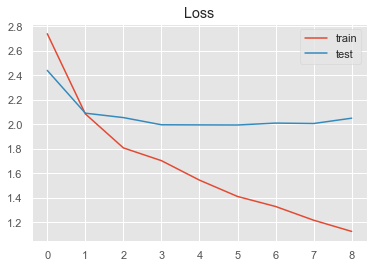

In [164]:
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

##### Observation: Found an accuracy of 57% with LSTM classifier which is higher than NN model built with glove vectorized data

### 11 Suprevised Learning Classification with glove vectorized data from pre-trained model

#### 11.1 Multinomial Naïve Bayes Classifier -- Using Default Hyperparameters

#### Splitting into train and test data

In [171]:
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(6758, 28) (6758, 74)
(1690, 28) (1690, 74)


In [172]:
nb6 = Pipeline([
               ('clf', MultinomialNB()),
              ])
nb6.fit(X_train, y_tr)

y_pred = nb6.predict(X_test)

predictions = nb6.predict_proba(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_te)) 
print('f1 score %s' % f1_score(y_pred, y_te,average='weighted')) 

print(classification_report(y_te, y_pred))

print(confusion_matrix(y_te,y_pred))


accuracy 0.0035502958579881655
f1 score 0.0033624451421240564
              precision    recall  f1-score   support

       GRP_0       0.00      0.00      0.00       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.04      0.04      0.04        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.00      0.00      0.00        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.09      0.08      0.08        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.10      0.02      0.03        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       

##### Observation: Found an accuracy of -- % with Multinomial NB classifier (with default hyperparameters) with glove vectorized data

#### 11.2 KNeighborsClassifier Classifier -- -- Using Default Hyperparameters

In [173]:
nb7 = Pipeline([
               ('clf', KNeighborsClassifier()),
              ])
nb7.fit(X_train, y_tr)

y_pred7 = nb7.predict(X_test)

predictions = nb7.predict_proba(X_test)

print('accuracy %s' % accuracy_score(y_pred7, y_te)) 
print('f1 score %s' % f1_score(y_pred7, y_te,average='weighted')) 

print(classification_report(y_te, y_pred7))

print(confusion_matrix(y_te,y_pred7))

accuracy 0.4029585798816568
f1 score 0.5410157502395966
              precision    recall  f1-score   support

       GRP_0       0.44      0.90      0.59       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.00      0.00      0.00        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.00      0.00      0.00        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.25      0.02      0.03        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

##### Observation: Found an accuracy of -- % with K Neighbors classifier (with default hyperparameters) with glove vectorized data

#### 11.3 DecisionTreeClassifier --  Using Default Hyperparameters

In [174]:
from sklearn.tree import DecisionTreeClassifier
nb8 = Pipeline([
               ('clf', DecisionTreeClassifier()),
              ])
nb8.fit(X_train, y_tr)

y_pred8 = nb8.predict(X_test)

predictions = nb8.predict_proba(X_test)

print('accuracy %s' % accuracy_score(y_pred8, y_te)) 
print('f1 score %s' % f1_score(y_pred8, y_te,average='weighted')) 

print(classification_report(y_te, y_pred8))

print(confusion_matrix(y_te,y_pred8))

accuracy 0.27928994082840236
f1 score 0.31197116239194506
              precision    recall  f1-score   support

       GRP_0       0.46      0.60      0.52       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.04      0.04      0.04        45
      GRP_13       0.13      0.05      0.08        38
      GRP_14       0.08      0.03      0.04        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.05      0.04      0.05        46
       GRP_2       0.00      0.00      0.00        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00

##### Observation: Found an accuracy of -- % with Decision Tree classifier (with default hyperparameters) with glove vectorized data

#### 11.4 Random Forest Classifier -- -- Using Default Hyperparameters

In [175]:
from sklearn.ensemble import RandomForestClassifier
nb9 = Pipeline([
               ('clf', RandomForestClassifier()),
              ])
nb9.fit(X_train, y_tr)

y_pred9 = nb9.predict(X_test)

predictions = nb9.predict_proba(X_test)

print('accuracy %s' % accuracy_score(y_pred9, y_te)) 
print('f1 score %s' % f1_score(y_pred9, y_te,average='weighted')) 

print(classification_report(y_te, y_pred9))

print(confusion_matrix(y_te,y_pred9))

accuracy 0.4195266272189349
f1 score 0.5682786241087971
              precision    recall  f1-score   support

       GRP_0       0.44      0.94      0.60       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.00      0.00      0.00        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       0.50      0.03      0.06        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.00      0.00      0.00        13
      GRP_19       0.00      0.00      0.00        46
       GRP_2       0.00      0.00      0.00        57
      GRP_20       0.00      0.00      0.00        12
      GRP_21       0.00      0.00      0.00         5
      GRP_22       0.00      0.00      0.00         6
      GRP_23       0.00  

##### Observation: Found an accuracy of -- % with RF classifier (with default hyperparameters) with glove vectorized data

#### 11.5 XG Boost Classifier -- Using Default Hyperparameters

In [176]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\p0s041d\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [177]:
from xgboost import XGBClassifier
nb10 = Pipeline([
               ('clf', XGBClassifier()),
              ])
nb10.fit(X_train, y_tr)

y_pred10 = nb10.predict(X_test)

predictions = nb10.predict_proba(X_test)

print('accuracy %s' % accuracy_score(y_pred10, y_te)) 
print('f1 score %s' % f1_score(y_pred10, y_te,average='weighted')) 

print(classification_report(y_te, y_pred10))

print(confusion_matrix(y_te,y_pred10))

[23:04:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy 0.42485207100591715
f1 score 0.5751008662276479
              precision    recall  f1-score   support

       GRP_0       0.45      0.95      0.61       750
       GRP_1       0.00      0.00      0.00         4
      GRP_10       0.00      0.00      0.00        28
      GRP_11       0.00      0.00      0.00         6
      GRP_12       0.00      0.00      0.00        45
      GRP_13       0.00      0.00      0.00        38
      GRP_14       1.00      0.03      0.06        33
      GRP_15       0.00      0.00      0.00         8
      GRP_16       0.00      0.00      0.00        20
      GRP_17       0.00      0.00      0.00        21
      GRP_18       0.00      0.00    

##### Observation: Found an accuracy of -- % with XG Boost classifier (with default hyperparameters) with glove vectorized data

### 12. Hyperparameter tuning of Classification techniques and using normal count vectorized data without padding 

#### 12.1. Creating count vectorized data without padding

In [178]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split


In [179]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
labelencoder_X = LabelEncoder()
#new_X('gender',  'topic', 'sign')=labelencoder_X.fit_transform(X['gender',  'topic', 'sign'])

Datafinal['target']=labelencoder_X.fit_transform(Datafinal['Assignment group'])

In [180]:
vectorizer = TfidfVectorizer()
vectorizer.fit(Datafinal['merged'])

TfidfVectorizer()

In [181]:
X = vectorizer.transform(Datafinal['merged'])
X_tr_countvec_wo_padd, X_te_countvec_wo_padd, y_tr_countvec_wo_padd, y_te_countvec_wo_padd = train_test_split(
    X, Datafinal['target'],test_size=0.15, random_state=0)

In [183]:
from sklearn.feature_selection import SelectKBest, chi2

ch2 = SelectKBest(chi2, k='all')
X_tr_countvec_wo_padd = ch2.fit_transform(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
X_te_countvec_wo_padd = ch2.transform(X_te_countvec_wo_padd)

X_tr_countvec_wo_padd, X_te_countvec_wo_padd

(<7180x12776 sparse matrix of type '<class 'numpy.float64'>'
 	with 137924 stored elements in Compressed Sparse Row format>,
 <1268x12776 sparse matrix of type '<class 'numpy.float64'>'
 	with 23859 stored elements in Compressed Sparse Row format>)

In [184]:
print(X_tr_countvec_wo_padd)

  (0, 6299)	0.5309285565256462
  (0, 5100)	0.2636678366543083
  (0, 129)	0.6653083198196642
  (0, 76)	0.45382703683051545
  (1, 12612)	0.3006439571900163
  (1, 12545)	0.15824706063482738
  (1, 12219)	0.05895198263693755
  (1, 12057)	0.04273774243259941
  (1, 12054)	0.05191730804567039
  (1, 11974)	0.04511004862724113
  (1, 11558)	0.10286660736015658
  (1, 11530)	0.08797811538804147
  (1, 11474)	0.12022852459159886
  (1, 11468)	0.041003149607751276
  (1, 11465)	0.0627458844496628
  (1, 11464)	0.05736502555318583
  (1, 11084)	0.0815723983641778
  (1, 11068)	0.09462888283222316
  (1, 10972)	0.09082471140641699
  (1, 10940)	0.22220866377618
  (1, 10921)	0.06668390639206268
  (1, 10896)	0.04376154607932131
  (1, 10840)	0.18978385577464021
  (1, 10815)	0.053074553666620936
  (1, 10802)	0.22674655847460826
  :	:
  (7177, 858)	0.04343933704685739
  (7177, 793)	0.041506185980259055
  (7177, 787)	0.06584350484319192
  (7177, 686)	0.07153267003535826
  (7177, 597)	0.03170001774352878
  (7177, 539

#### 12.2: Applying the tuning for Multinomial NB

In [185]:
#nb6 = Pipeline([
#               ('clf', MultinomialNB()),
 #             ])
from sklearn.model_selection import train_test_split,GridSearchCV
parameters_nb6=dict(alpha=[1.0,0],fit_prior=[True,False])
nb6 = MultinomialNB()
clf_nb6 = GridSearchCV(nb6, parameters_nb6, cv=10)
clf_nb6.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
#nb6.fit(X_train, y_tr)
scores = clf_nb6.cv_results_['mean_test_score']
nb6_comb=[]
score_list=[]
[ nb6_comb.append([i,j]) for i in parameters_nb6['alpha'] for j in parameters_nb6['fit_prior'] ]
for score, n_nb6 in zip(scores, np.array(nb6_comb)):
    score_list.append([n_nb6,score])
    print(n_nb6,":",score)


[1. 1.] : 0.5525069637883009
[1. 0.] : 0.5977715877437326
[0. 1.] : 0.6440111420612813
[0. 0.] : 0.5268802228412257


In [186]:
print("The best parameters for MultinomialNB: ",clf_nb6.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for MultinomialNB: ",clf_nb6.best_score_)

The best parameters for MultinomialNB:  {'alpha': 0, 'fit_prior': True}
The best score for MultinomialNB:  0.6440111420612813


In [188]:
from sklearn import metrics
MultinomialNB_final = MultinomialNB(alpha=0, fit_prior= True)
MultinomialNB_final.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
y_pred = MultinomialNB_final.predict(X_te_countvec_wo_padd)

predictions = MultinomialNB_final.predict_proba(X_te_countvec_wo_padd)

acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'MultinomialNB','acc_score':accuracy_score(y_pred, y_te_countvec_wo_padd),'f1_score':f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')},ignore_index=True)
#acc_df[0]=['MultinomialNB',accuracy_score(y_pred, y_te2),f1_score(y_pred, y_te2,average='weighted')]
print('accuracy %s' % accuracy_score(y_pred, y_te_countvec_wo_padd)) 
print('f1 score %s' % f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')) 

#print(classification_report(y_te, y_pred))
#cm=confusion_matrix(str(y_te),y_pred, labels=[-1, 1])
print(confusion_matrix(y_te_countvec_wo_padd,y_pred))


accuracy 0.667192429022082
f1 score 0.7143635286874613
[[572   0   0 ...   1   0   0]
 [  1   3   0 ...   0   0   0]
 [  3   0   9 ...   0   4   0]
 ...
 [  1   0   0 ...   0   0   0]
 [  3   0   0 ...   0  86   0]
 [  5   0   1 ...   0  22   7]]


In [189]:
acc_df

,Model_Name,acc_score,f1_score
0,MultinomialNB,0.667192,0.714364


##### Observation: Found an accuracy of 67 % with Multinomial NB with tuned hyperparameters with count vectorized data

#### 12.3: Applying the tuning for KNN

In [190]:
parameters_NNH=dict(n_neighbors=range(1,10),leaf_size=range(10,50), weights = ['uniform', 'distance'])
NNH = KNeighborsClassifier()
clf_NNH = GridSearchCV(NNH, parameters_NNH, cv=5)
clf_NNH.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
scores = clf_NNH.cv_results_['mean_test_score']
nnh_comb=[]
score_list=[]
[ nnh_comb.append([i,j]) for i in parameters_NNH['n_neighbors'] for j in parameters_NNH['leaf_size'] ]
for score, n_nnh in zip(scores, np.array(nnh_comb)):
    score_list.append([n_nnh,score])
    print(n_nnh,":",score)

[ 1 10] : 0.5933147632311977
[ 1 11] : 0.5933147632311977
[ 1 12] : 0.5632311977715878
[ 1 13] : 0.5793871866295264
[ 1 14] : 0.6357938718662952
[ 1 15] : 0.6385793871866294
[ 1 16] : 0.6338440111420612
[ 1 17] : 0.6430362116991644
[ 1 18] : 0.6381615598885795
[ 1 19] : 0.6484679665738161
[ 1 20] : 0.6430362116991644
[ 1 21] : 0.6520891364902507
[ 1 22] : 0.6413649025069638
[ 1 23] : 0.6520891364902507
[ 1 24] : 0.648050139275766
[ 1 25] : 0.6566852367688022
[ 1 26] : 0.6444289693593315
[ 1 27] : 0.6541782729805014
[ 1 28] : 0.5933147632311977
[ 1 29] : 0.5933147632311977
[ 1 30] : 0.5632311977715878
[ 1 31] : 0.5793871866295264
[ 1 32] : 0.6357938718662952
[ 1 33] : 0.6385793871866294
[ 1 34] : 0.6338440111420612
[ 1 35] : 0.6430362116991644
[ 1 36] : 0.6381615598885795
[ 1 37] : 0.6484679665738161
[ 1 38] : 0.6430362116991644
[ 1 39] : 0.6520891364902507
[ 1 40] : 0.6413649025069638
[ 1 41] : 0.6520891364902507
[ 1 42] : 0.648050139275766
[ 1 43] : 0.6566852367688022
[ 1 44] : 0.6444

In [191]:
print("The best parameters for KNN: ",clf_NNH.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for KNN: ",clf_NNH.best_score_)

The best parameters for KNN:  {'leaf_size': 10, 'n_neighbors': 8, 'weights': 'distance'}
The best score for KNN:  0.6566852367688022


In [192]:
NNH_final = KNeighborsClassifier(n_neighbors=7,leaf_size=10, weights = 'distance')
NNH_final.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)

KNeighborsClassifier(leaf_size=10, n_neighbors=7, weights='distance')

In [193]:
from sklearn import metrics
print(NNH_final.score(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd))
y_pred = NNH_final.predict(X_te_countvec_wo_padd)
#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'KNN','acc_score':accuracy_score(y_pred, y_te_countvec_wo_padd),'f1_score':f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')},ignore_index=True)
cm=metrics.confusion_matrix(y_te_countvec_wo_padd, y_pred)

#check_Acc(NNH_final)

0.9506963788300835


In [194]:
acc_df

,Model_Name,acc_score,f1_score
0,MultinomialNB,0.667192,0.714364
1,KNN,0.674290,0.736438


##### Observation: Found an accuracy of 67 % with Multinomial NB with tuned hyperparameters with count vectorized data

#### 12.4: Applying the tuning for SVM technique

In [195]:
from sklearn import svm
#svm.SVC(gamma=0.025, C=3)  
parameters_svm=dict(gamma=np.arange(0.01,0.05,0.01),C=range(1,10),decision_function_shape=['ovo'],class_weight=['balanced'])
SVM = svm.SVC()
clf_SVM = GridSearchCV(SVM, parameters_svm, cv=5)
clf_SVM.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': range(1, 10), 'class_weight': ['balanced'],
                         'decision_function_shape': ['ovo'],
                         'gamma': array([0.01, 0.02, 0.03, 0.04])})

In [196]:
print("The best parameters for SVM: ",clf_SVM.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for SVM: ",clf_SVM.best_score_)

The best parameters for SVM:  {'C': 9, 'class_weight': 'balanced', 'decision_function_shape': 'ovo', 'gamma': 0.04}
The best score for SVM:  0.5077994428969359


In [199]:
SVM_final = svm.SVC(C=9, class_weight = 'balanced', decision_function_shape='ovo', gamma=0.04) ##substitute with best parameters
SVM_final.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)

SVC(C=9, class_weight='balanced', decision_function_shape='ovo', gamma=0.04)

In [200]:
from sklearn import metrics
print(SVM_final.score(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd))
y_pred = SVM_final.predict(X_te_countvec_wo_padd)
#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'SVM','acc_score':accuracy_score(y_pred, y_te_countvec_wo_padd),'f1_score':f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')},ignore_index=True)
cm=metrics.confusion_matrix(y_te_countvec_wo_padd, y_pred)

0.6612813370473538


#### 12.5: Applying the tuning for Decision Tree Classifier technique

In [201]:
from sklearn.tree import DecisionTreeClassifier
parameters_dTree=dict(criterion=['gini','entropy'],max_depth=range(3,15),random_state=[1])
dTree = DecisionTreeClassifier()
clf_dTree = GridSearchCV(dTree, parameters_dTree, cv=5)
clf_dTree.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(3, 15), 'random_state': [1]})

In [202]:
print("The best parameters for Decision Tree: ",clf_dTree.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for Decision Tree: ",clf_dTree.best_score_)

The best parameters for Decision Tree:  {'criterion': 'gini', 'max_depth': 14, 'random_state': 1}
The best score for Decision Tree:  0.595682451253482


In [203]:
dTree_final=DecisionTreeClassifier(criterion='gini',max_depth=14,random_state=1)
dTree_final.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
y_pred = dTree_final.predict(X_te_countvec_wo_padd)
#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'Decision Tree','acc_score':accuracy_score(y_pred, y_te_countvec_wo_padd),'f1_score':f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')},ignore_index=True)
cm=metrics.confusion_matrix(y_te_countvec_wo_padd, y_pred)

#check_Acc(dTree_final)

In [204]:
acc_df

,Model_Name,acc_score,f1_score
0,MultinomialNB,0.667192,0.714364
1,KNN,0.674290,0.736438
2,SVM,0.543375,0.505016
3,Decision Tree,0.604890,0.697461


#### 12.6: Applying the tuning for Random Forest Classifier technique

In [205]:
from sklearn.ensemble import RandomForestClassifier
parameters_RForest=dict(criterion=['gini','entropy'],max_depth=range(3,15),random_state=[1],n_estimators=[100],bootstrap=[True,False],class_weight=['balanced', 'balanced_subsample'])
RForest = RandomForestClassifier()
clf_RForest = GridSearchCV(RForest, parameters_RForest, cv=5)
clf_RForest.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)


GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(3, 15), 'n_estimators': [100],
                         'random_state': [1]})

In [206]:
print("The best parameters for Random Forest: ",clf_RForest.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for Random Forest: ",clf_RForest.best_score_)

The best parameters for Random Forest:  {'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 14, 'n_estimators': 100, 'random_state': 1}
The best score for Random Forest:  0.37771587743732593


In [207]:
RForest_final=RandomForestClassifier(criterion='entropy',max_depth=13,random_state=1,n_estimators=100,class_weight='balanced',bootstrap=True)
RForest_final.fit(X_tr_countvec_wo_padd, y_tr_countvec_wo_padd)
y_pred = RForest_final.predict(X_te_countvec_wo_padd)
#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'Random Forest','acc_score':accuracy_score(y_pred, y_te_countvec_wo_padd),'f1_score':f1_score(y_pred, y_te_countvec_wo_padd,average='weighted')},ignore_index=True)
cm=metrics.confusion_matrix(y_te_countvec_wo_padd, y_pred)

#check_Acc(RForest_final)

In [208]:
acc_df

,Model_Name,acc_score,f1_score
0,MultinomialNB,0.667192,0.714364
1,KNN,0.674290,0.736438
2,SVM,0.543375,0.505016
3,Decision Tree,0.604890,0.697461
4,Random Forest,0.313091,0.267932


<AxesSubplot:xlabel='Model_Name', ylabel='acc_score'>

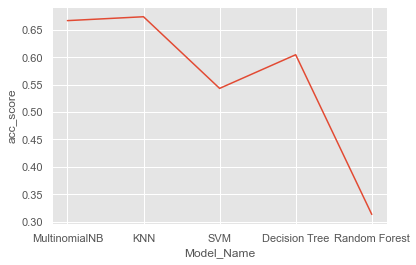

In [209]:
sns.lineplot(data=acc_df,x="Model_Name", y="acc_score")

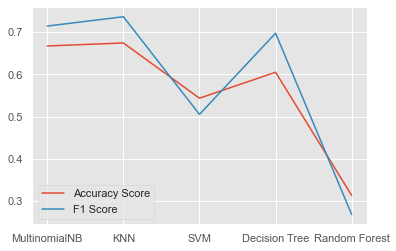

In [210]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.plot(acc_df["Model_Name"], acc_df["acc_score"], label = "Accuracy Score")
plt.plot(acc_df["Model_Name"], acc_df["f1_score"], label = "F1 Score")
plt.legend()

### 13. Applying conditional step-by-step classifiers to handle data imbalanace

#### 13.1. Creating a separate column to store Assignment groups with only GRP_0 labelled as it is and the rest labelled as "Others"

In [214]:
def GRP_0_vs_others (row):
    if row['Assignment group']!= 'GRP_0':
        return 'Others'
    return 'GRP_0'

In [215]:
Datafinal.apply(lambda row: GRP_0_vs_others(row), axis=1)

0        GRP_0
1        GRP_0
2        GRP_0
3        GRP_0
4        GRP_0
         ...  
8443    Others
8444     GRP_0
8445     GRP_0
8446    Others
8447    Others
Length: 8448, dtype: object

In [216]:
Datafinal['GRP_0_vs_others'] = Datafinal.apply (lambda row: GRP_0_vs_others(row), axis=1)

#### 13.2. Splitting the dataset into train and test sets for final evaluation of the conditional step-by-step classifier

In [234]:
X

<8448x12776 sparse matrix of type '<class 'numpy.float64'>'
	with 161783 stored elements in Compressed Sparse Row format>

In [236]:
X_tr_step_classify, X_test_final, y_tr_discard, y_test_final_discard = train_test_split(
    X, Datafinal['Assignment group'],test_size=0.10, random_state=0)

#### 13.3. Splitting the dataset into train and test sets for further processing through conditional step-by-step classifier

In [237]:
X_tr_step_classify, X_test_final, y_tr_step_classify, y_test_final = train_test_split(
    X, Datafinal['GRP_0_vs_others'],test_size=0.10, random_state=0)

#### 13.4. Build classifier 1 for GRP_0 vs 'others' classification

##### 13.4.1. Splitting the train and test sets for classifier-1 for GRP_0 vs 'others' classification - Using overall train set created above for step classification

In [238]:
X_tr_step_1, X_test_step_1, y_tr_step_1, y_test_step_1 = train_test_split(
    X_tr_step_classify,y_tr_step_classify,test_size=0.10, random_state=0)

In [240]:
y_tr_step_1

4179    Others
126      GRP_0
1918    Others
6845    Others
4106     GRP_0
         ...  
2886    Others
4925     GRP_0
3774    Others
6193    Others
203      GRP_0
Name: GRP_0_vs_others, Length: 6842, dtype: object

##### 13.4.2. Creating the KNN classifier

In [241]:
KN2 = KNeighborsClassifier()
KN2.fit(X_tr_step_1, y_tr_step_1)
y_pred = KN2.predict(X_test_step_1)

predictions = KN2.predict_proba(X_test_step_1)

print('accuracy %s' % accuracy_score(y_pred, y_test_step_1)) 
print('f1 score %s' % f1_score(y_pred, y_test_step_1,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_test_step_1, y_pred))

print(confusion_matrix(y_test_step_1, y_pred))

accuracy 0.8068331143232589
f1 score 0.8080245594503336
              precision    recall  f1-score   support

       GRP_0       0.73      0.93      0.82       349
      Others       0.92      0.70      0.80       412

    accuracy                           0.81       761
   macro avg       0.82      0.82      0.81       761
weighted avg       0.83      0.81      0.81       761

[[325  24]
 [123 289]]


##### 13.4.3. Creating the XG Boost classifier

In [242]:
XGB2 = XGBClassifier()
XGB2.fit(X_tr_step_1, y_tr_step_1)
y_pred = XGB2.predict(X_test_step_1)

predictions2 = XGB2.predict_proba(X_test_step_1)

print('accuracy %s' % accuracy_score(y_pred, y_test_step_1)) 
print('f1 score %s' % f1_score(y_pred, y_test_step_1,average='weighted')) 
#print ("logloss: %0.3f " % multiclass_logloss(y_te,predictions))

print(classification_report(y_test_step_1, y_pred))

print(confusion_matrix(y_test_step_1, y_pred))

[10:14:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy 0.8396846254927727
f1 score 0.8395894170817344
              precision    recall  f1-score   support

       GRP_0       0.82      0.83      0.83       349
      Others       0.86      0.84      0.85       412

    accuracy                           0.84       761
   macro avg       0.84      0.84      0.84       761
weighted avg       0.84      0.84      0.84       761

[[291  58]
 [ 64 348]]


##### Observation: We will use XG Boost classifier as classifier1 as that's giving the accuracy of 84%

#### 13.5. Build classifier with only 'Others' group data

##### 13.5.1. Build dataframe with only 'Others' group data

In [245]:
#Create Dataset for 'others' i.e all groups which is not part of GRP_0
DatafinalOthers= Datafinal[Datafinal['Assignment group'] != 'GRP_0']

In [246]:
DatafinalOthers

,Short description,Description,Caller,Assignment group,merged,word_count,processed_text,list_processed_text,word_vec,target,GRP_0_vs_others
6,event critical hostname company com the value ...,event critical hostname company com the value ...,jyoqwxhz clhxsoqy,GRP_1,event critical hostname company com the value ...,33,"[event, critical, hostname, company, com, valu...","[[event], [critical], [hostname], [company], [...","[[-0.005697015854824161, 0.07328896918391033, ...",1,Others
17,when undocking pc screen will not come back,when undocking pc screen will not come back,sigfdwcj reofwzlm,GRP_3,when undocking pc screen will not come back wh...,16,"[undocking, pc, screen, come, back, undocking,...","[[undocking], [pc], [screen], [come], [back], ...","[[0.026471749637124044, -0.00165972893452766, ...",23,Others
32,duplication of network address,gentles have two devices that are trying to sh...,kxsceyzo naokumlb,GRP_4,duplication of network address gentles have tw...,79,"[duplication, network, address, gentles, two, ...","[[duplication], [network], [address], [gentles...","[[0.005642860788592751, 0.07162863716295911, -...",34,Others
43,please reroute jobs on printer to printer issu...,hi the printer printer is not working and need...,yisohglr uvteflgb,GRP_5,please reroute jobs on printer to printer issu...,106,"[please, reroute, job, printer, printer, issue...","[[please], [reroute], [job], [printer], [print...","[[-0.06402298608802892, 0.06691177524647882, 0...",45,Others
47,job job failed in job scheduler at,job job failed in job scheduler at,bpctwhsn kzqsbmtp,GRP_6,job job failed in job scheduler at job job fai...,14,"[job, job, failed, job, scheduler, job, job, f...","[[job], [job], [failed], [job], [scheduler], [...","[[0.048589564659567853, -0.047672771568108584,...",56,Others
...,...,...,...,...,...,...,...,...,...,...,...
8441,erp fi ob two accounts to be added,i am sorry have another two accounts that need...,ipwjorsc uboapexr,GRP_10,erp fi ob two accounts to be added i am sorry ...,54,"[erp, fi, ob, two, account, added, sorry, anot...","[[erp], [fi], [ob], [two], [account], [added],...","[[0.062096286451703106, -0.0499245671249219, -...",2,Others
8442,tablet needs reimaged due to multiple issues w...,tablet needs reimaged due to multiple issues w...,cpmaidhj elbaqmtp,GRP_3,tablet needs reimaged due to multiple issues w...,22,"[tablet, need, reimaged, due, multiple, issue,...","[[tablet], [need], [reimaged], [due], [multipl...","[[-0.06262578282183151, -0.03902730399082881, ...",23,Others
8443,emails not coming in from zz mail,xd xd xd good afternoon xd am not receiving th...,avglmrts vhqmtiua,GRP_29,emails not coming in from zz mail xd xd xd goo...,28,"[email, coming, zz, mail, xd, xd, xd, good, af...","[[email], [coming], [zz], [mail], [xd], [xd], ...","[[-0.006496316957370652, -0.04355142234954381,...",22,Others
8446,machine o est funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine o est funcionando i am unable to acces...,22,"[machine, est, funcionando, unable, access, ma...","[[machine], [est], [funcionando], [unable], [a...","[[0.06912633505367909, -0.08868088911197955, 0...",59,Others


##### 13.5.2. Resampling the data

In [252]:
maxOthers = DatafinalOthers['Assignment group'].value_counts().max()
maxOthers

661

In [256]:
from sklearn.utils import resample
DatafinalOthers_resampled = DatafinalOthers[0:0]
for grp in DatafinalOthers['Assignment group'].unique():
    temp = DatafinalOthers[DatafinalOthers['Assignment group'] == grp]
    resampled = resample(temp, replace=True, n_samples=int(maxOthers/2), random_state=123)
    DatafinalOthers_resampled = DatafinalOthers_resampled.append(resampled)

##### 13.5.3. Checking the distribution after resampling

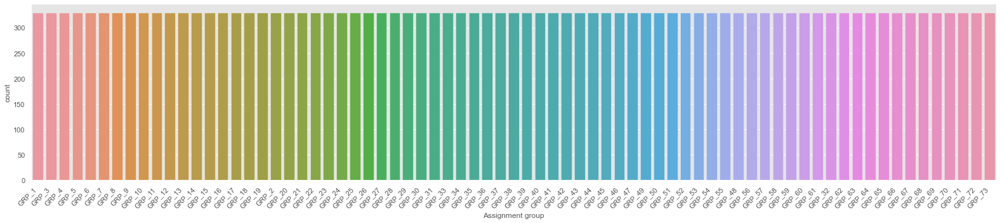

In [257]:
plt.style.use('ggplot') # Using gg plot for plotting based on descending order
%matplotlib inline

descending_order = DatafinalOthers_resampled['Assignment group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#added code for x label rotate 
ay=sns.countplot(x='Assignment group', data=DatafinalOthers_resampled,order=descending_order)
ay.set_xticklabels(ay.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

We can see above that all the groups are distributed uniformly now

##### 13.5.4. Vectorize the X data

In [259]:
X_classifier2 = vectorizer.transform(DatafinalOthers_resampled['merged'])

##### 13.5.5. Splitting the train and test sets for classifier-2 for rest of the groups classification 

In [260]:
X_tr_step_2, X_test_step_2, y_tr_step_2, y_test_step_2 = train_test_split(X_classifier2, DatafinalOthers_resampled['Assignment group'],test_size=0.15, random_state=0)

##### 13.5.6. Build classifiers for all the groups except GRP_0 filtered out before

###### 13.5.6.1. Creating the KNN classifier

In [ ]:
parameters_KN3=dict(n_neighbors=range(1,10),leaf_size=range(10,50), weights = ['uniform', 'distance'])
KN3 = KNeighborsClassifier()
clf_KN3 = GridSearchCV(KN3, parameters_KN3, cv=5)
clf_KN3.fit(X_tr_step_2, y_tr_step_2)
scores = clf_KN3.cv_results_['mean_test_score']
KN3_comb=[]
score_list=[]
[ KN3_comb.append([i,j]) for i in parameters_KN3['n_neighbors'] for j in parameters_NNH['leaf_size'] ]
for score, n_nnh in zip(scores, np.array(KN3_comb)):
    score_list.append([n_nnh,score])
    print(n_nnh,":",score)

In [ ]:
print("The best parameters for KNN: ",clf_KN3.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for KNN: ",clf_KN3.best_score_)

In [ ]:
KN3_final = KNeighborsClassifier(n_neighbors=7,leaf_size=10, weights = 'distance')
KN3_final.fit(X_tr_step_2, y_tr_step_2)

In [ ]:
from sklearn import metrics
print(KN3_final.score(X_tr_step_2, y_tr_step_2))
y_pred = KN3_final.predict(X_test_step_2)
#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
#acc_df=acc_df.append({'Model_Name':'KNN_with_resampled_data','acc_score':accuracy_score(y_pred, y_test_step_2),'f1_score':f1_score(y_pred, y_test_step_2,average='weighted')},ignore_index=True)
cm=metrics.confusion_matrix(y_test_step_2, y_pred)

#check_Acc(NNH_final)

In [ ]:
acc_df

###### 13.5.6.2. Creating the Multinomial NB classifier

In [ ]:
#nb6 = Pipeline([
#               ('clf', MultinomialNB()),
 #             ])
from sklearn.model_selection import train_test_split,GridSearchCV
parameters_MNB=dict(alpha=[1.0,0],fit_prior=[True,False])
MNB = MultinomialNB()
clf_MNB = GridSearchCV(MNB, parameters_MNB, cv=10)
clf_MNB.fit(X_tr_step_2, y_tr_step_2)
#nb6.fit(X_train, y_tr)
scores = clf_MNB.cv_results_['mean_test_score']
MNB_comb=[]
score_list=[]
[ MNB_comb.append([i,j]) for i in parameters_MNB['alpha'] for j in parameters_MNB['fit_prior'] ]
for score, n_nb6 in zip(scores, np.array(MNB_comb)):
    score_list.append([n_nb6,score])
    print(n_nb6,":",score)


In [ ]:
print("The best parameters for MultinomialNB: ",clf_MNB.best_params_)
#print(clf_nb6.best_estimator_)
print("The best score for MultinomialNB: ",clf_MNB.best_score_)

In [ ]:
from sklearn import metrics
MNB_final = MultinomialNB(alpha=0, fit_prior= True)
MNB_final.fit(X_tr_step_2, y_tr_step_2)
y_pred = MNB_final.predict(X_test_step_2)

predictions = MNB_final.predict_proba(X_test_step_2)

#acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
#acc_df=acc_df.append({'Model_Name':'MultinomialNB_with_resampled_data','acc_score':accuracy_score(y_pred, y_test_step_2),'f1_score':f1_score(y_pred, y_test_step_2,average='weighted')},ignore_index=True)
#acc_df[0]=['MultinomialNB',accuracy_score(y_pred, y_te2),f1_score(y_pred, y_te2,average='weighted')]
print('accuracy %s' % accuracy_score(y_pred, y_test_step_2)) 
print('f1 score %s' % f1_score(y_pred, y_test_step_2,average='weighted')) 

#print(classification_report(y_te, y_pred))
#cm=confusion_matrix(str(y_te),y_pred, labels=[-1, 1])
print(confusion_matrix(y_test_step_2,y_pred))


In [ ]:
acc_df

##### Observation: We will use Multinomial NB as classifier 2 as that gives maximum accuracy with re-sampled data

#### 13.6. Defining a function to apply the classifier 2 conditionally based on result of classifier 1

In [ ]:
def condition_based_classifier(X):
    # Step:1 - Apply Classifier1 on X and find Y
    y_predicted = []
    y_predicted = XGB2.predict(X) # Applying classifier 1 overall
    for i in range(len(y_predicted)):
        if y_predicted[i] != 'GRP_0':
    # Step:2 - For all X which are classified as "Others", apply Classifier2
            y_predicted[i]=KN3_final.predict(X[i]) # Applying classifier 2 wherever predicted y is not GRP_0
    # Step:3 - Finally generate the classification results    
    return y_predicted

#### 13.7. Evaluating the overall condition based classifier with test data formed initially

In [ ]:
y_pred_final = []
y_pred_final = condition_based_classifier(X_test_final)
#predictions = MNB_final.predict_proba(X_test_step_2)

acc_df=pd.DataFrame(columns=['Model_Name','acc_score','f1_score'])
acc_df=acc_df.append({'Model_Name':'conditional_classifier_with_resampled_data','acc_score':accuracy_score(y_pred_final, y_test_final),'f1_score':f1_score(y_pred_final, y_test_final,average='weighted')},ignore_index=True)
#acc_df[0]=['MultinomialNB',accuracy_score(y_pred, y_te2),f1_score(y_pred, y_te2,average='weighted')]
print('accuracy %s' % accuracy_score(y_pred_final, y_test_final)) 
print('f1 score %s' % f1_score(y_pred_final, y_test_final,average='weighted')) 

### 13. Comparing the results obtained from all the techniques

#### 12.1 Plotting the accuracies

In [ ]:
%matplotlib inline
plt.plot(acc_df["Model_Name"], acc_df["acc_score"], label = "Accuracy Score")
plt.plot(acc_df["Model_Name"], acc_df["f1_score"], label = "F1 Score")
plt.legend()

## Final Conclusion

### Comparison Results and classifier with the best result

The maximum accuracy was found with K Neighbors classifier of 66% - After applying Hyperparameter tuning on tokenized ticket description data (without padding)
Below are the top 3 classifiers along with the methods:

K Neighbors with hp tuning (66%) > Multinomial NB with hp tuning (65%) > K Neighbors, XG Boost and SVM (without hp tuning)

### Insights

- The Supervised Learning classifiers gave best results on count vectorized data rather than Glove vectorized data. Hence, context-based word vectorization technique are recommended only for Neural network models and not supervised learning classifiers
- Padding of data is not recommended for Supervised Learning classifiers unlike what we do usually in neural network modelling. Its better to apply feature reduction techniques like PCA while applying supervised classification.
- NLP models-based classification and LSTM models might not work best with skewed data as provided to us (GRP_0 being the outlier in the dataset) where supervised learning techniques work better.
- In case the input dataset has varied row lengths, LSTM model gives good results with optimum padding of data which should be close to the median value of row lengths. Since, in the given case, median length was 18, we applied a close padding of 28 words

### Data Quality and Recommendations

- The data had values which were masked and hence weren’t conveying any meaning for e.g. “xd’”, “zz” etc.
- Data quality could have been better. Given data had lot of junk characters like: mail sub headers (“received from:”, “from:”, “to”, “cc:”, “https:”)
- In an ideal solution, the user interface meant for raising tickets should be build such that it should accept only valid text values. Good quality data received through such a solution should eliminate the need of cleansing the data and should eventually improve the results

To address these shortcomings, we had to define custom function to selectively remove these junk values from the dataset

### Data Veracity

Given data looked genuine with “Caller IDs” provided for each ticket. In industry practice, if there is a possibility of malicious tickets, we can build a solution to first verify the registered Caller IDs and then process the concerned tickets 

### Implementation Suggestions

The proposed classifier should be kept updated with by periodically monitoring the performance/ accuracy and accordingly refitting the models with updated data.


------------------------------------------------------------------------